In [1]:
import os
import librosa
# import pydub
from pydub import AudioSegment
import numpy as np
import copy
import random
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import datetime

from torch.utils.tensorboard import SummaryWriter

import threading
import time

from tqdm.notebook import tqdm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

In [2]:
dataset_dir = '/home/torooc/dataHDD2/speech_commands_v0.01/'

run_name = 'runs/2_layer_rnn_hidden_fc_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# run_name = 'runs/debug_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)


In [3]:
testing_list_path = dataset_dir + 'testing_list.txt'
validation_list_path = dataset_dir + 'validation_list.txt'

In [4]:
with open(testing_list_path) as f:
    testing_list = f.readlines()
    testing_list = [file.strip() for file in testing_list]
    
with open(validation_list_path) as f:
    validation_list = f.readlines()
    validation_list = [file.strip() for file in validation_list]

In [5]:
command_dirs = os.listdir(dataset_dir)

command_dirs = [direc for direc in command_dirs if os.path.isdir(os.path.join(dataset_dir, direc))]

command_dirs.sort()

command_dirs.remove('_background_noise_')

command_dirs.remove('_hey_liku')


In [6]:
print(command_dirs)

['bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'four', 'go', 'happy', 'house', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'wow', 'yes', 'zero']


In [7]:
key2label_dict = dict()
label2key_list = list()

key2label_dict[' '] = 0
label2key_list.append(' ')

for i, command in enumerate(command_dirs):
    key2label_dict[command] = i + 1
    label2key_list.append(command)

In [8]:
key2label_dict

{' ': 0,
 'bed': 1,
 'bird': 2,
 'cat': 3,
 'dog': 4,
 'down': 5,
 'eight': 6,
 'five': 7,
 'four': 8,
 'go': 9,
 'happy': 10,
 'house': 11,
 'left': 12,
 'marvin': 13,
 'nine': 14,
 'no': 15,
 'off': 16,
 'on': 17,
 'one': 18,
 'right': 19,
 'seven': 20,
 'sheila': 21,
 'six': 22,
 'stop': 23,
 'three': 24,
 'tree': 25,
 'two': 26,
 'up': 27,
 'wow': 28,
 'yes': 29,
 'zero': 30}

In [9]:
total_wav_file_list = list()

for command_dir in command_dirs:
    wav_list = os.listdir(os.path.join(dataset_dir, command_dir))
    
    wav_list_with_prefix = [os.path.join(command_dir, file_name) for file_name in wav_list]
    
    total_wav_file_list += wav_list_with_prefix

In [10]:
training_list = list(set(total_wav_file_list) - set(testing_list) - set(validation_list))
training_list.sort()


In [11]:
'''
validation_list
testing_list
training_list
'''

'\nvalidation_list\ntesting_list\ntraining_list\n'

In [12]:
audio_metadata = list()

for wav_file_name in tqdm(total_wav_file_list):
    audio = AudioSegment.from_wav(dataset_dir + wav_file_name)
    fs = audio.frame_rate
    length_in_samples = audio.frame_count()
    
#   normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15
    
#   print("Max: {}, Min: {}".format(max(normalized_audio_array), min(normalized_audio_array)))
    
    audio_metadata.append([fs, length_in_samples])

In [13]:
SR = 16000

class DatasetLoader():
    
    def __init__(self, batch_size, dataset_dir, wav_file_name_list, key2label, label2key, is_train):
        self.batch_size = batch_size
        self.dataset_dir = dataset_dir
        self.wav_file_name_list = copy.deepcopy(wav_file_name_list)
        self.sr = SR
        self.nsc_in_ms = 40
#         self.nov_in_ms = self.nsc_in_ms / 2
        self.nov_in_ms = 0
        self.nsc_in_sample = int(self.nsc_in_ms / 1000 * self.sr)
        self.nov_in_sample = int(self.nov_in_ms / 1000 * self.sr)
        
        self.key2label = key2label
        self.label2key = label2key
        
        self.spectrogram_list = list()
        self.label_list = list()
        
        self.lock = threading.RLock()
        
        self.num_thread = 4
        
        self.loading_counter = 0
        
        self.dataset_number = len(self.wav_file_name_list)
        
        self.is_train = is_train
        
    def shuffle_dataset_order(self):
        random.shuffle(self.wav_file_name_list)
        
    def load_dataset(self):
        
        self.shuffle_dataset_order()
        self.spectrogram_list = list()
        self.label_list = list()
        self.loading_counter = 0
        
        step = int(np.floor(self.dataset_number / self.num_thread))
        
        for i in range(self.num_thread):
            
            wav_file_name_list_thread = self.wav_file_name_list[i*step:(i+1)*step]
            
            if i + 1 == self.num_thread:
                wav_file_name_list_thread = self.wav_file_name_list[i*step:]
            
            thread = threading.Thread(target=self.load_spectrogram, args=(wav_file_name_list_thread,))
            thread.start()
        
    def batch_generator(self):
        
        self.load_dataset()
        x = 0
        
        while self.loading_counter < self.dataset_number or len(self.spectrogram_list) > self.batch_size:
            
            if len(self.spectrogram_list) >= self.batch_size:

                spectrogram_list = self.spectrogram_list[:self.batch_size]
                label_list = self.label_list[:self.batch_size]

                with self.lock:
                    self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                    self.label_list = self.label_list[self.batch_size:]
#                     print('[GPU Count: {}]'.format(x))
#                     x += 1

                spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
                max_time_step = max(spectrogram_time_step_list)
                freq_size = spectrogram_list[0].shape[0]
                batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

                for j, specgram in enumerate(spectrogram_list):
                    batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

                batch_label = np.asarray(label_list)

                yield batch, batch_label
            
            else:
                time.sleep(0.05)
        
        
        if len(self.spectrogram_list) > 0:

            spectrogram_list = self.spectrogram_list
            label_list = self.label_list

            with self.lock:
                self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                self.label_list = self.label_list[self.batch_size:]
#                 print('[GPU Count: {}]'.format(x))
#                 x += 1

            spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
            max_time_step = max(spectrogram_time_step_list)
            freq_size = spectrogram_list[0].shape[0]
            batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

            for j, specgram in enumerate(spectrogram_list):
                batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

            batch_label = np.asarray(label_list)

            yield batch, batch_label
        
        return 0
    

    def load_spectrogram(self, wav_file_name_list_part):

        for i, wav_file_name in enumerate(wav_file_name_list_part):

            audio = AudioSegment.from_wav(self.dataset_dir + wav_file_name)

            normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15

            f, t, Zxx = scipy_signal.stft(normalized_audio_array, fs=self.sr, 
                                          nperseg=self.nsc_in_sample,
                                          noverlap=self.nov_in_sample)

            Sxx = np.abs(Zxx)

            normalized_spectrogram = (20 * np.log10(np.maximum(Sxx, 1e-8)) + 160) / 160
            
            ###
            if self.is_train:
                normalized_spectrogram += (np.random.random(normalized_spectrogram.shape) - 0.5)/10
                normalized_spectrogram = np.clip(normalized_spectrogram, 0, None)

            ###
            
            keyword = wav_file_name.split('/')[0]
            label = self.key2label[keyword]
            
            with self.lock:
                self.spectrogram_list.append(normalized_spectrogram)
                self.label_list.append(label)
                self.loading_counter += 1
#                 print('[Dataset Count: {}] [Specgram Length: {}]'.format(self.loading_counter, len(self.spectrogram_list)))
            

In [14]:
len(training_list)

51088

In [15]:
dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

# dataset_loader_testing = DatasetLoader(64, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(64, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(512, dataset_dir, training_list, key2label_dict, label2key_list)
# dataset_loader_testing = DatasetLoader(512, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(512, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
# dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
# dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

In [16]:
# batch_generator = dataset_loader_training.batch_generator()

In [17]:
# class basic_model(nn.Module):
#     def __init__(self, D_in, H, num_layers, num_labels):
#         super(basic_model, self).__init__()
#         self.fc = torch.nn.Linear(D_in, H)
#         self.relu = torch.nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)

#         self.gru_layers = nn.ModuleList([nn.GRU(H, int(H / 2), bidirectional=True, batch_first=True) for i in range(num_layers)])

#         self.fc_pred = nn.Linear(H, num_labels)
#         self.log_softmax = nn.LogSoftmax(dim=2)
        
#     def forward(self, input_tensor):
#         # (B, T, F)
#         output_tensor = self.fc(input_tensor)
#         output_tensor = self.relu(output_tensor)
#         output_tensor = self.dropout(output_tensor)
#         # (B, T, H)
#         for layer in self.gru_layers:
#             output_tensor, _ = layer(output_tensor)
            
#         output_tensor = self.fc_pred(output_tensor)

#         output_tensor = self.log_softmax(output_tensor)
        
#         return output_tensor

class basic_conv_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_conv_model, self).__init__()
        self.conv2d_1 = nn.Conv2d(1, 16, (13, 2))
        self.conv2d_2 = nn.Conv2d(16, 32, (13, 2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(4800, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)
        tensor = self.conv2d_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor = self.conv2d_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_crnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_crnn_model, self).__init__()
#         self.conv2d = nn.Conv2d(1, 128, (13, 2))
        self.conv2d_1 = nn.Conv2d(1, 64, (7, 2))
        self.conv2d_2 = nn.Conv2d(64, 64, (7, 2))
#         self.gru_1 = nn.GRU(16 * 103, 256, 1)
#         self.gru_1 = nn.GRU(128 * 103, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 33, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 99, 256, 1, bidirectional=True)
        self.gru_1 = nn.GRU(19776, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 2 * 12, 31)
#         self.fc = nn.Linear(256 * 10, 31) # 5632
        self.fc = nn.Linear(256 * 48, 31) # 12288
#         self.fc = nn.Linear(256 * 22, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)  # (B, 1, F, T)
        tensor = self.conv2d_1(input_tensor) # (B, 16, F, T)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor = self.conv2d_2(tensor) # (B, 16, F, T)
# #         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
        
        tensor = tensor.view(tensor.shape[0], -1, tensor.shape[3])
        # (B, 16 * F, T)
        
#         print('[After Reshape]: {}'.format(tensor.shape))
        
        tensor.transpose_(0, 2) # (T, F, B)
        tensor.transpose_(1, 2) # (T, B, F)

        tensor, _ = self.gru_1(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))

        tensor, _ = self.gru_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_4(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)

        tensor.transpose_(0, 1) # (B, T, F)
    
#         print('[After Reshape]: {}'.format(tensor.shape))
    
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_rnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_rnn_model, self).__init__()
        self.gru_1 = nn.GRU(321, 128, 1, bidirectional=True)
        self.gru_2 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_3 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_4 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_5 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_6 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_7 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_8 = nn.GRU(256, 128, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 26, 31)
        self.fc = nn.Linear(256, 31)
        
    def forward(self, input_tensor):
#       input_tensor.unsqueeze_(1)
        # (B, F, T)
        input_tensor.transpose_(0, 2) # (T, F, B)
        input_tensor.transpose_(1, 2) # (T, B, F)
        tensor, _ = self.gru_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor, hidden = self.gru_2(tensor)
        '''
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_4(tensor) # Hidden (2[Direction], B, H)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        
#         tensor = F.relu(hidden)
#         tensor = F.dropout(tensor, 0.1, training=True)
        
#         print(hidden.shape)
        
        tensor, _ = self.gru_5(tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_6(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_7(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor, _ = self.gru_8(tensor)
        tensor, hidden = self.gru_8(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
#         tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
        '''
        tensor = F.relu(hidden)
        tensor = F.dropout(tensor, 0.1, training=True)
        
        tensor.transpose_(0, 1) # (B, T, F)
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor

    
# model = basic_model(321, 512, 3, 31).float().to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# dictation_loss = nn.CTCLoss().to(device)

# model = basic_crnn_model().float().to(device)  
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
        

In [18]:
class hello_edge_fc_model(nn.Module):
    def __init__(self):
        super(hello_edge_fc_model, self).__init__()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(8346, 31)
        
    def forward(self, input_tensor):
        tensor = self.flatten(input_tensor)
        tensor = self.fc(tensor)
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
# model = basic_crnn_model().float().to(device)  
model = basic_rnn_model().float().to(device)  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [19]:
# batch_generator = dataset_loader_training.batch_generator()
# next(batch_generator)[0].shape

13:09:44.283083
#000 [Train: 3.415] [Test: 3.396] [Valid: 3.397]
#000 [Train: 0.038] [Test: 0.046] [Valid: 0.043]


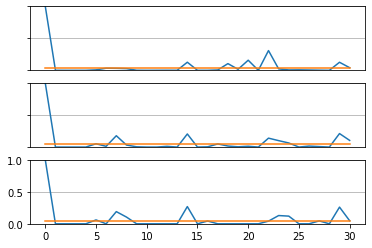

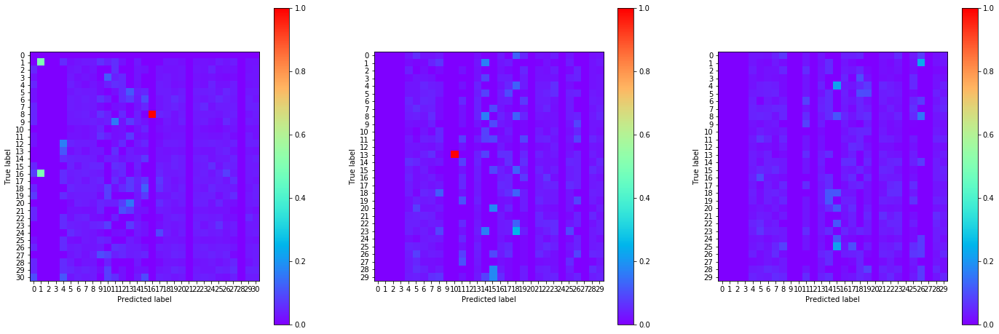

13:10:50.031092
#001 [Train: 3.395] [Test: 3.377] [Valid: 3.379]
#001 [Train: 0.049] [Test: 0.063] [Valid: 0.056]


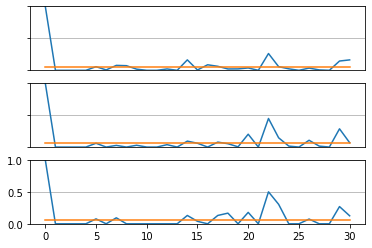

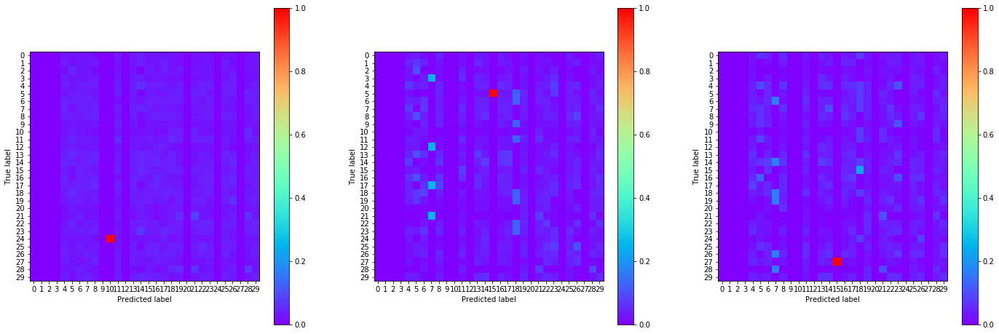

13:11:55.276829
#002 [Train: 3.330] [Test: 3.243] [Valid: 3.224]
#002 [Train: 0.073] [Test: 0.094] [Valid: 0.095]


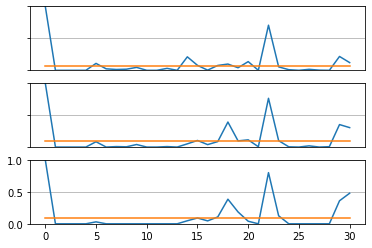

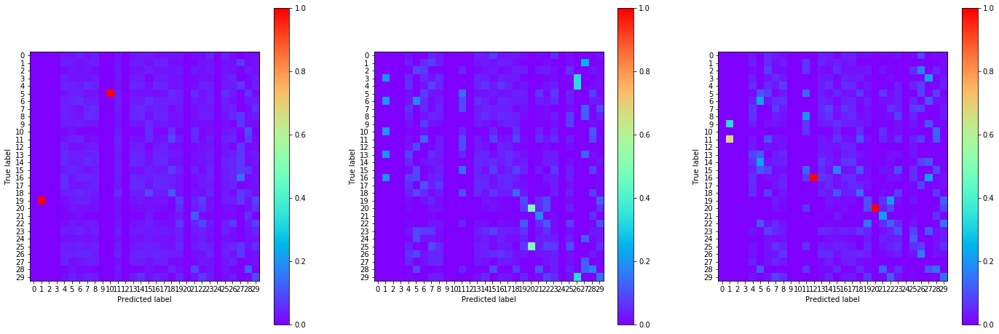

13:13:01.280722
#003 [Train: 3.176] [Test: 3.091] [Valid: 3.052]
#003 [Train: 0.101] [Test: 0.111] [Valid: 0.117]


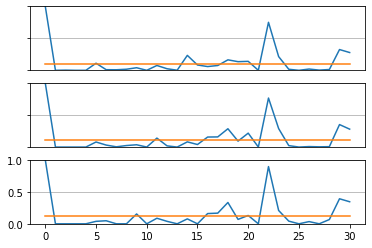

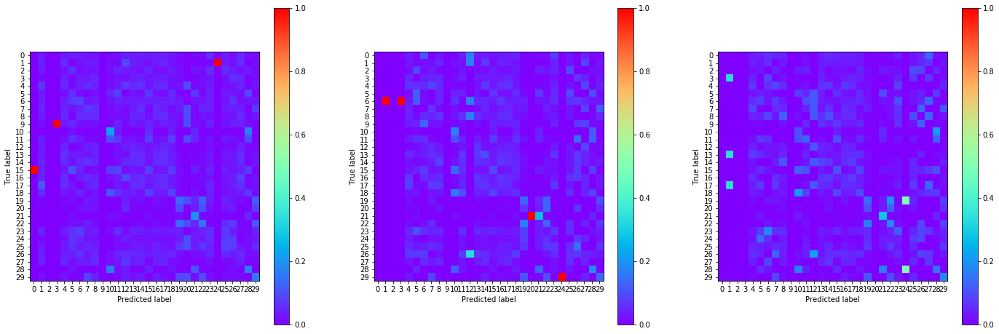

13:14:08.065470
#004 [Train: 3.018] [Test: 2.943] [Valid: 2.904]
#004 [Train: 0.119] [Test: 0.130] [Valid: 0.138]


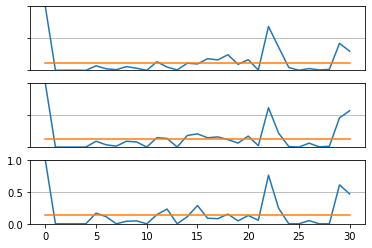

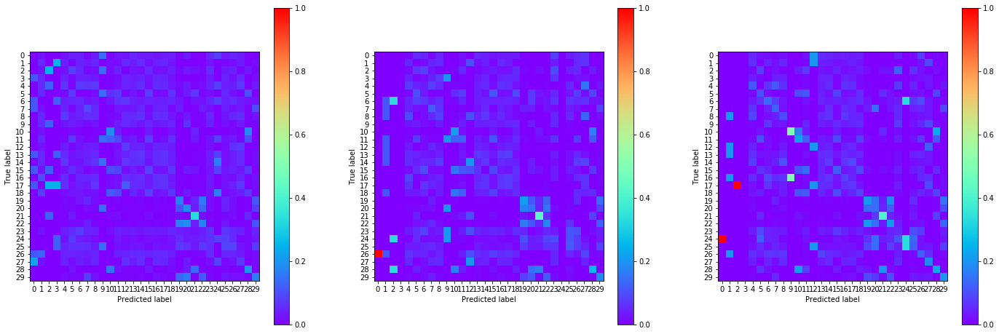

13:15:13.880358
#005 [Train: 2.879] [Test: 2.829] [Valid: 2.791]
#005 [Train: 0.135] [Test: 0.144] [Valid: 0.143]


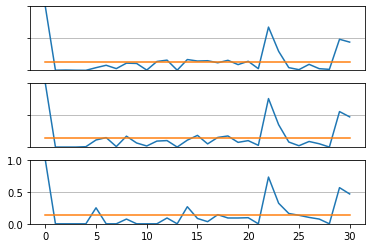

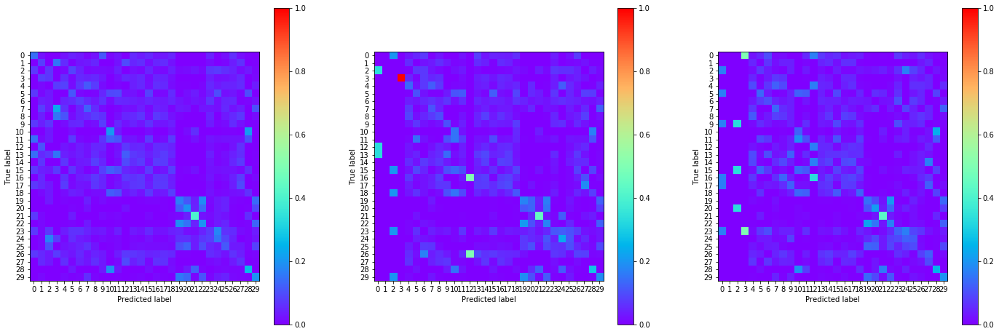

13:16:18.904773
#006 [Train: 2.775] [Test: 2.744] [Valid: 2.708]
#006 [Train: 0.153] [Test: 0.168] [Valid: 0.166]


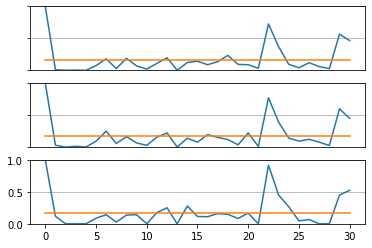

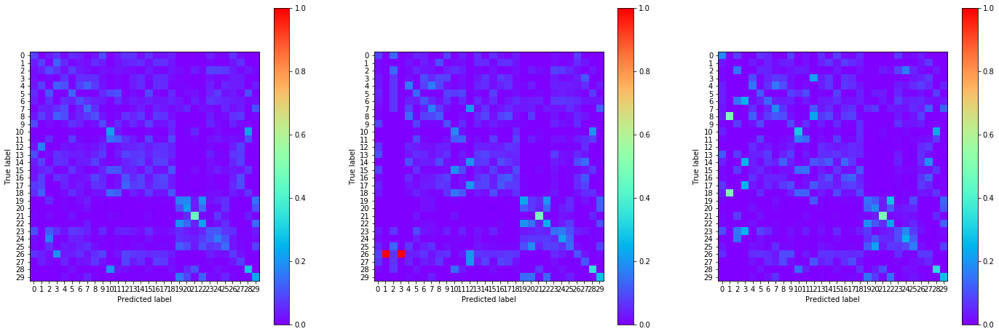

13:17:24.468189
#007 [Train: 2.686] [Test: 2.660] [Valid: 2.615]
#007 [Train: 0.172] [Test: 0.184] [Valid: 0.192]


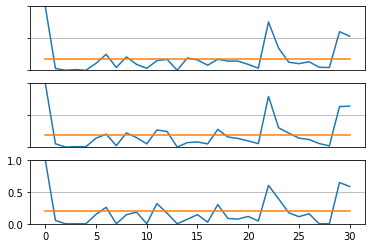

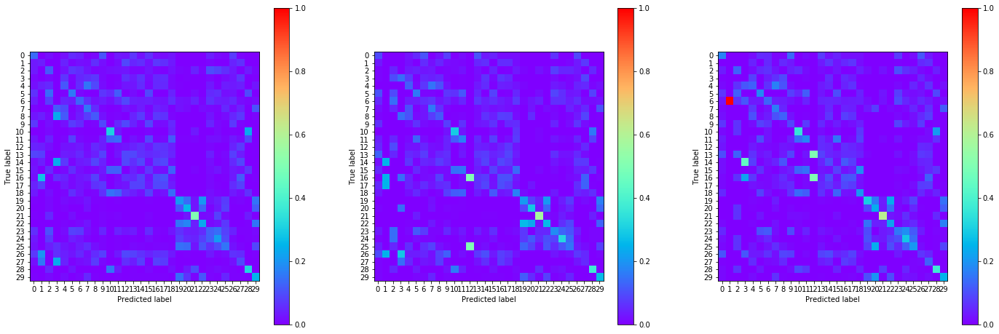

13:18:30.040541
#008 [Train: 2.613] [Test: 2.590] [Valid: 2.549]
#008 [Train: 0.192] [Test: 0.199] [Valid: 0.207]


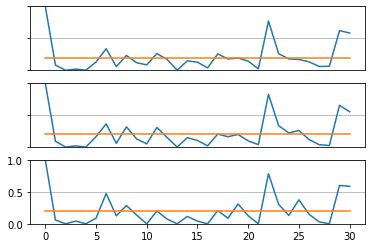

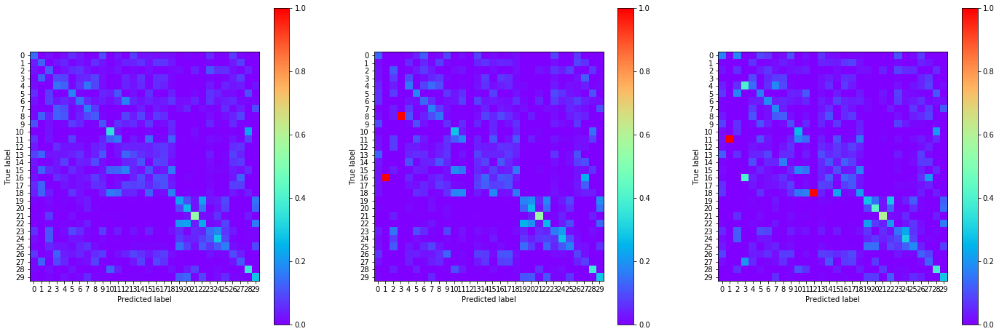

13:19:35.686373
#009 [Train: 2.545] [Test: 2.534] [Valid: 2.491]
#009 [Train: 0.210] [Test: 0.213] [Valid: 0.221]


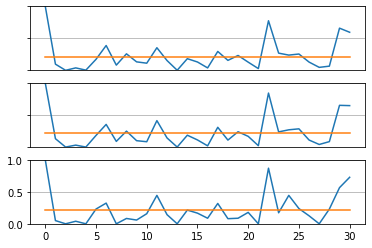

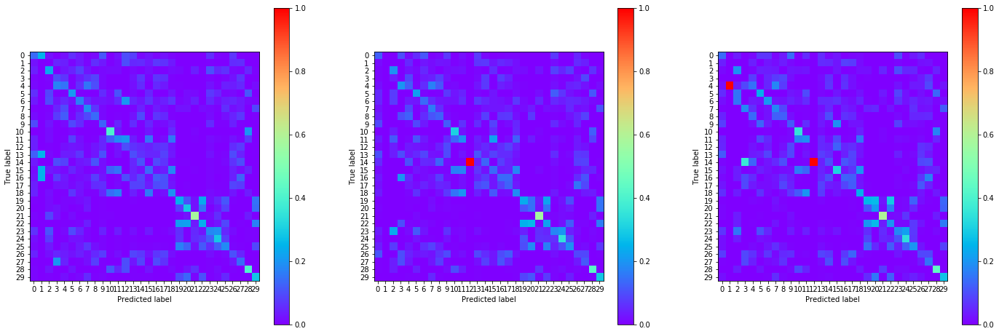

13:20:41.273257
#010 [Train: 2.484] [Test: 2.480] [Valid: 2.426]
#010 [Train: 0.225] [Test: 0.232] [Valid: 0.255]


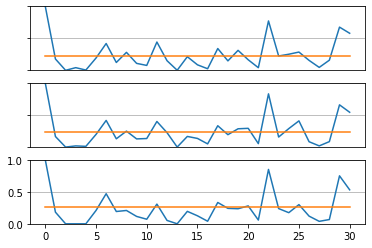

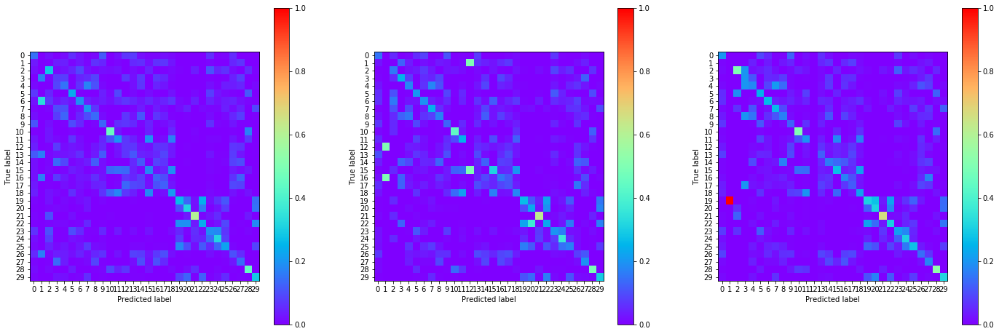

13:21:46.375510
#011 [Train: 2.424] [Test: 2.417] [Valid: 2.370]
#011 [Train: 0.244] [Test: 0.239] [Valid: 0.262]


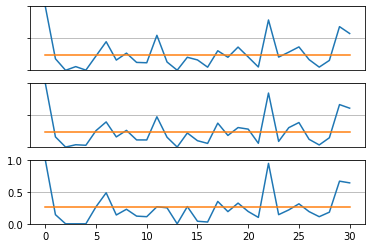

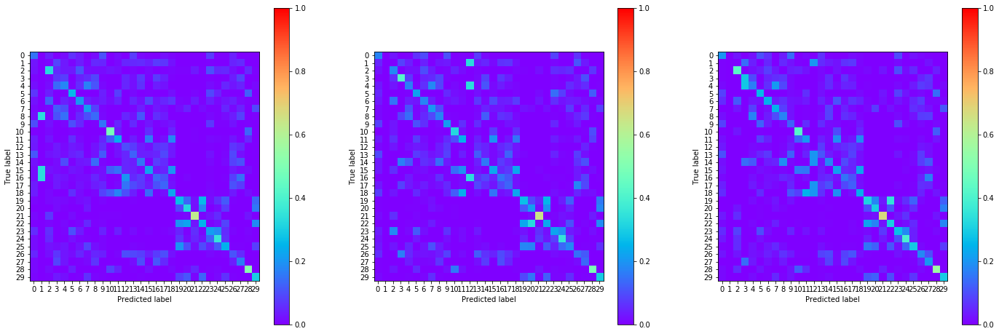

13:22:52.257736
#012 [Train: 2.362] [Test: 2.364] [Valid: 2.314]
#012 [Train: 0.258] [Test: 0.257] [Valid: 0.268]


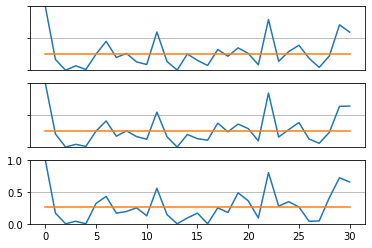

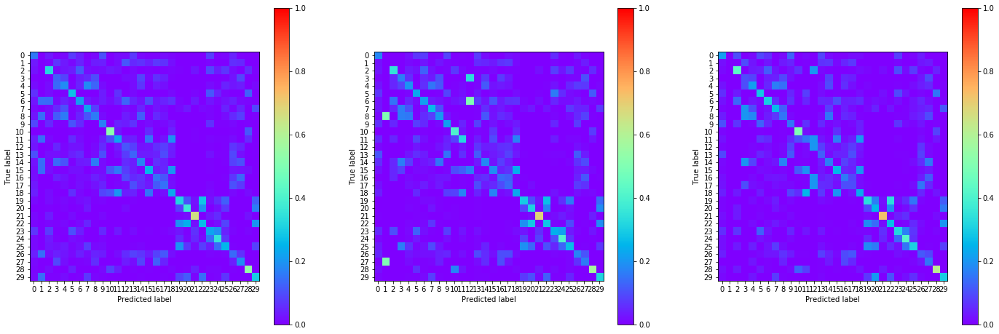

13:23:59.483394
#013 [Train: 2.305] [Test: 2.302] [Valid: 2.258]
#013 [Train: 0.273] [Test: 0.271] [Valid: 0.291]


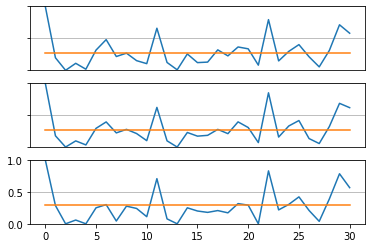

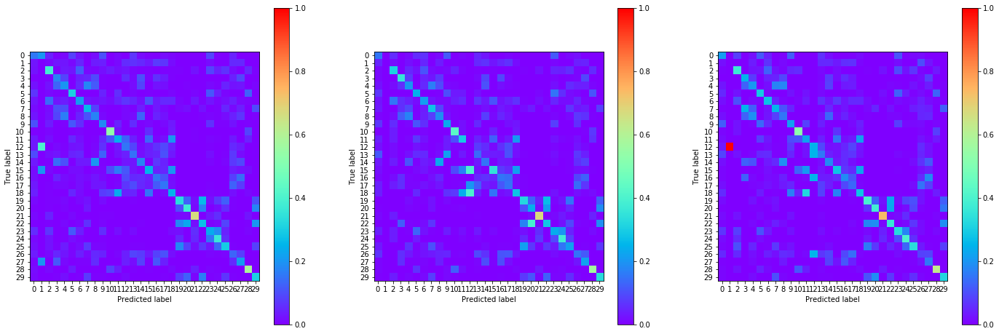

13:25:05.737132
#014 [Train: 2.248] [Test: 2.255] [Valid: 2.214]
#014 [Train: 0.293] [Test: 0.280] [Valid: 0.301]


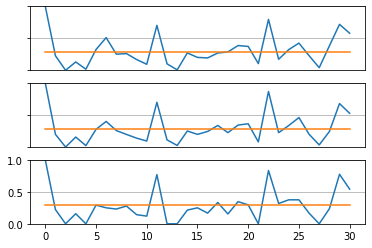

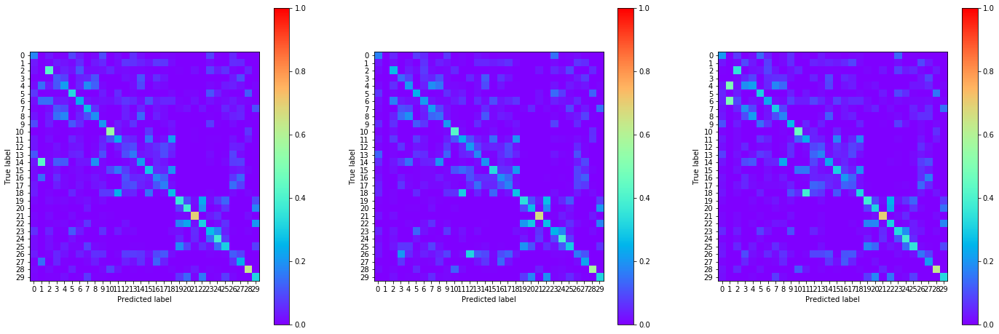

13:26:12.498817
#015 [Train: 2.195] [Test: 2.196] [Valid: 2.151]
#015 [Train: 0.308] [Test: 0.307] [Valid: 0.329]


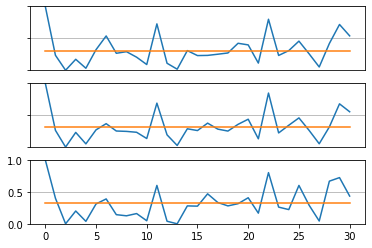

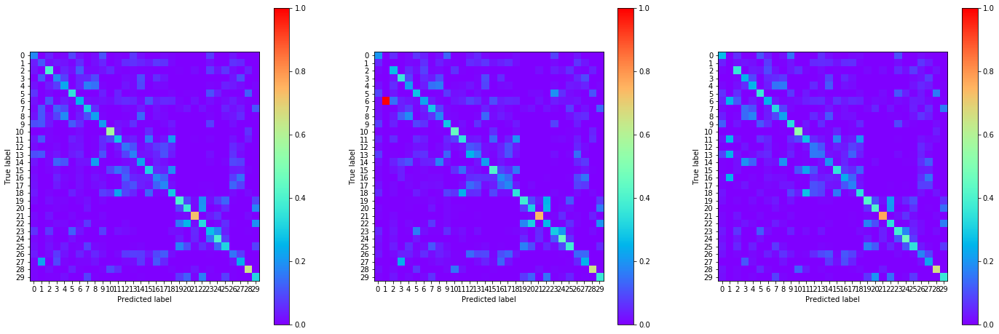

13:27:18.323201
#016 [Train: 2.145] [Test: 2.203] [Valid: 2.169]
#016 [Train: 0.323] [Test: 0.313] [Valid: 0.324]


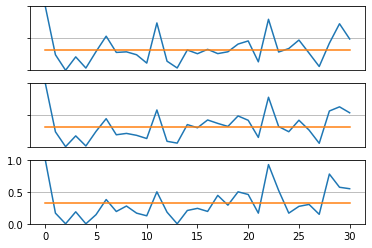

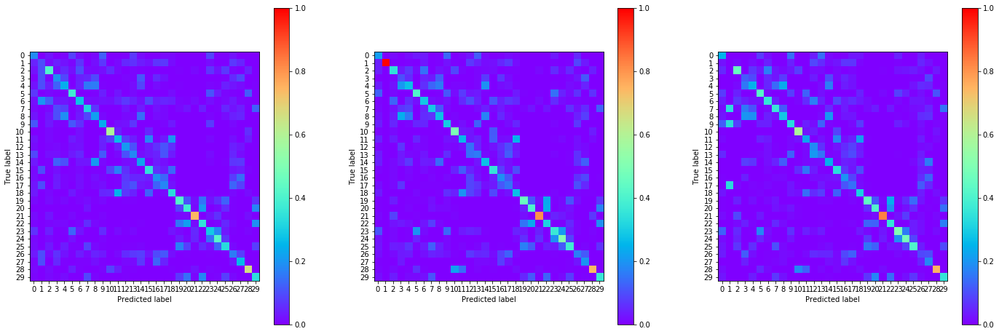

13:28:26.698375
#017 [Train: 2.097] [Test: 2.103] [Valid: 2.064]
#017 [Train: 0.342] [Test: 0.340] [Valid: 0.349]


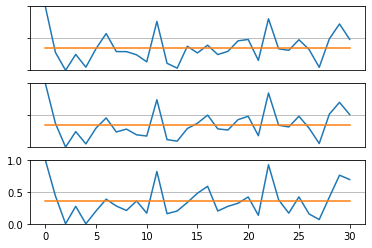

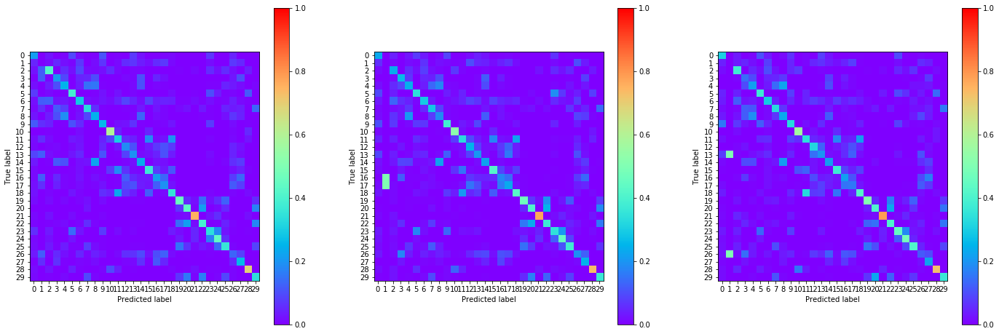

13:29:34.530149
#018 [Train: 2.048] [Test: 2.063] [Valid: 2.020]
#018 [Train: 0.357] [Test: 0.355] [Valid: 0.377]


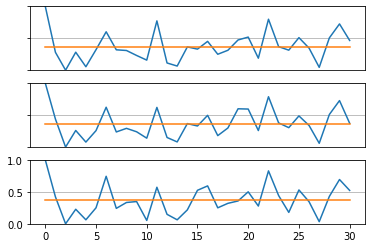

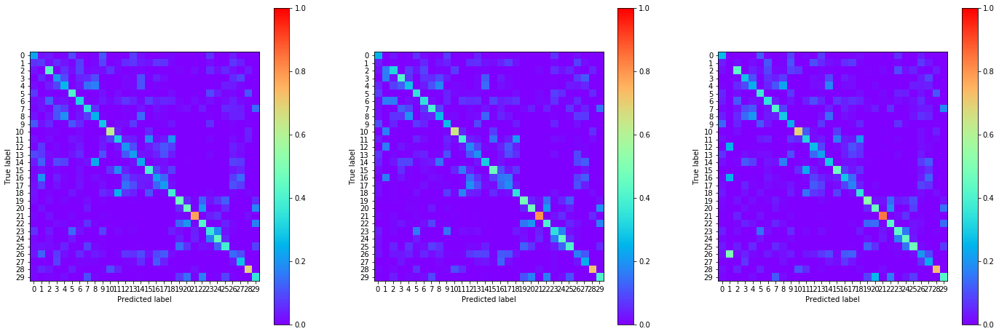

13:30:41.878009
#019 [Train: 1.999] [Test: 2.024] [Valid: 1.983]
#019 [Train: 0.375] [Test: 0.376] [Valid: 0.390]


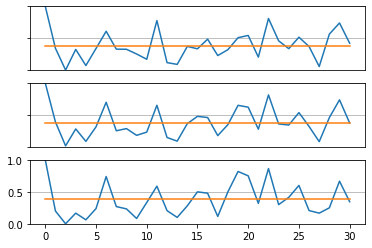

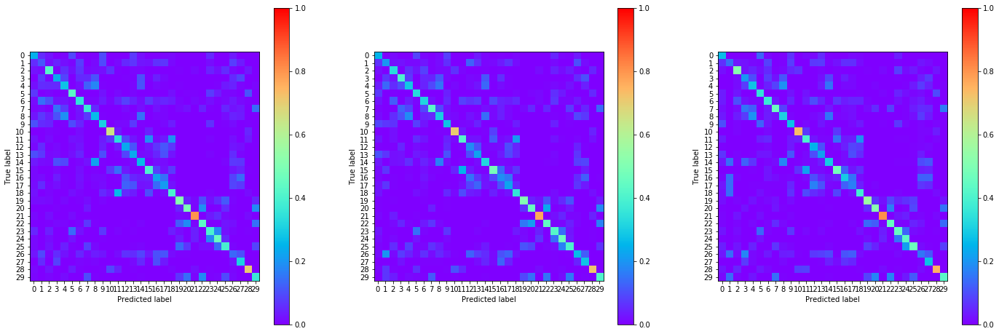

13:31:50.183225
#020 [Train: 1.949] [Test: 1.958] [Valid: 1.920]
#020 [Train: 0.390] [Test: 0.405] [Valid: 0.407]


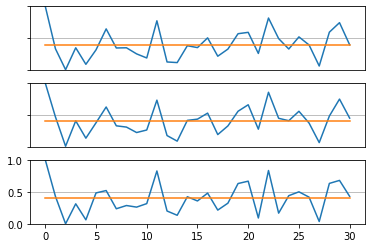

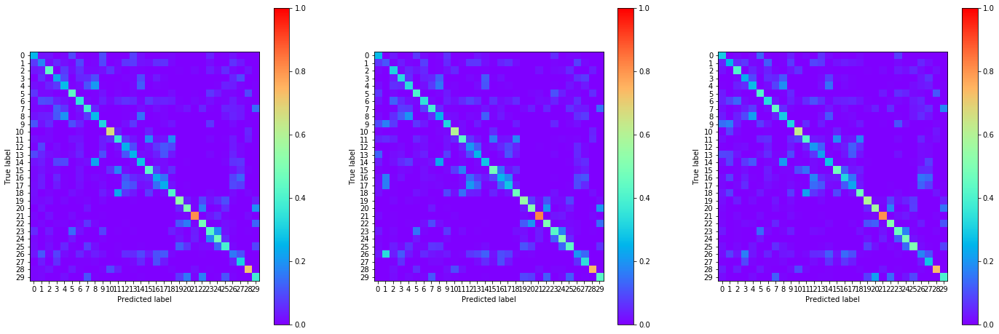

13:32:58.091923
#021 [Train: 1.899] [Test: 1.911] [Valid: 1.872]
#021 [Train: 0.414] [Test: 0.418] [Valid: 0.425]


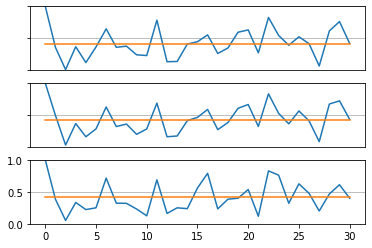

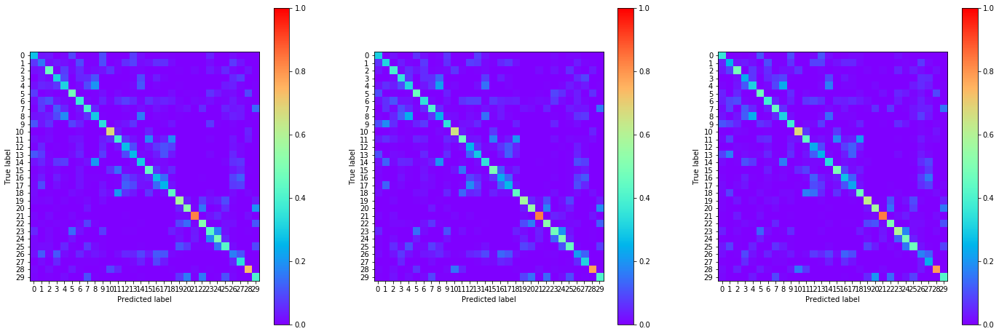

13:34:06.148912
#022 [Train: 1.856] [Test: 1.883] [Valid: 1.836]
#022 [Train: 0.428] [Test: 0.428] [Valid: 0.436]


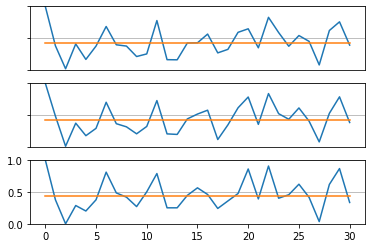

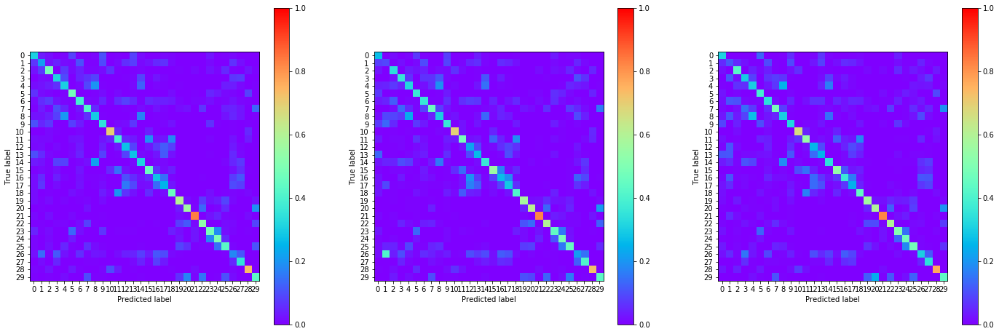

13:35:12.795789
#023 [Train: 1.800] [Test: 1.827] [Valid: 1.790]
#023 [Train: 0.449] [Test: 0.448] [Valid: 0.452]


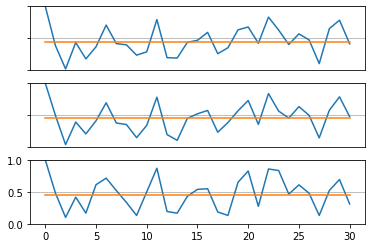

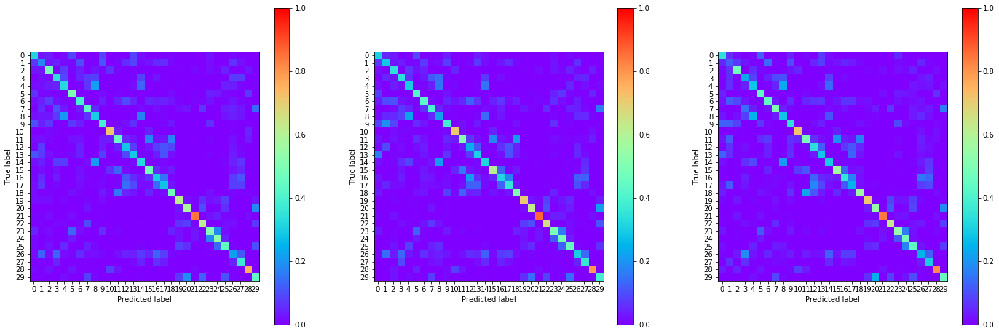

13:36:21.253067
#024 [Train: 1.754] [Test: 1.784] [Valid: 1.739]
#024 [Train: 0.461] [Test: 0.457] [Valid: 0.473]


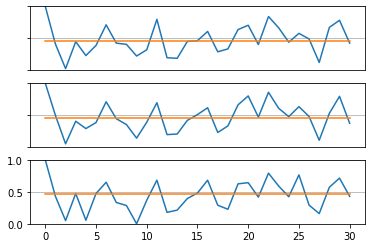

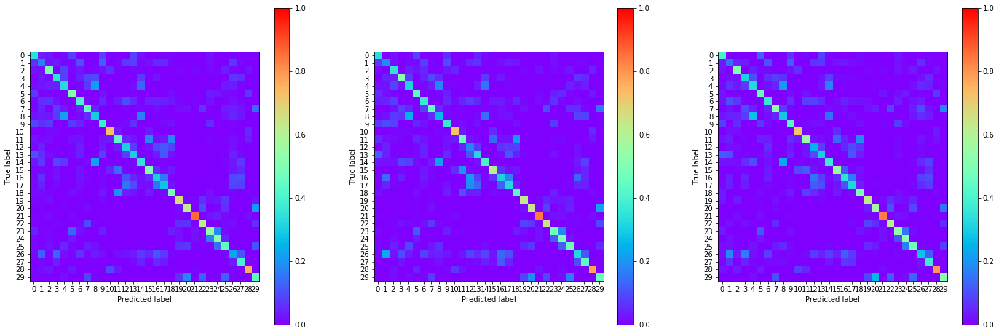

13:37:29.146329
#025 [Train: 1.708] [Test: 1.733] [Valid: 1.691]
#025 [Train: 0.479] [Test: 0.479] [Valid: 0.485]


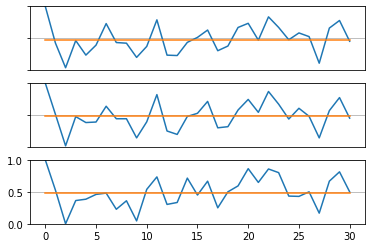

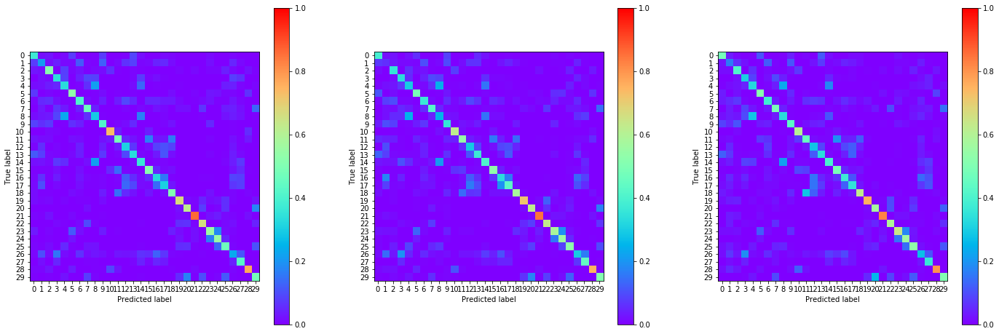

13:38:36.104141
#026 [Train: 1.668] [Test: 1.695] [Valid: 1.653]
#026 [Train: 0.490] [Test: 0.494] [Valid: 0.504]


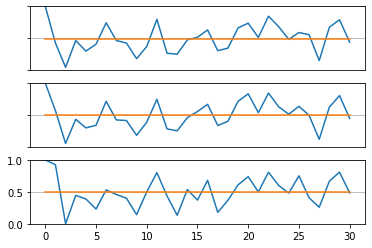

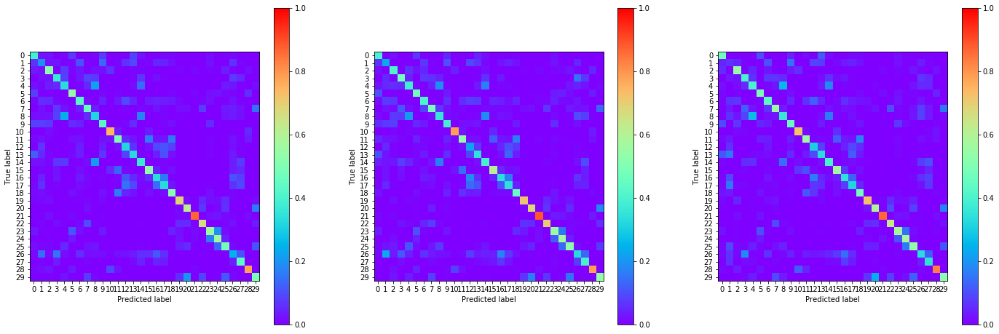

13:39:43.444632
#027 [Train: 1.618] [Test: 1.638] [Valid: 1.592]
#027 [Train: 0.508] [Test: 0.512] [Valid: 0.521]


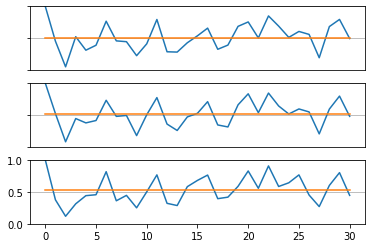

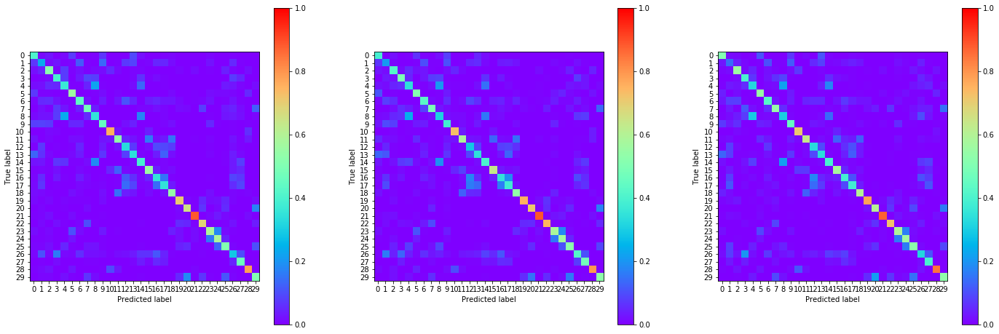

13:40:52.071865
#028 [Train: 1.578] [Test: 1.599] [Valid: 1.555]
#028 [Train: 0.519] [Test: 0.528] [Valid: 0.536]


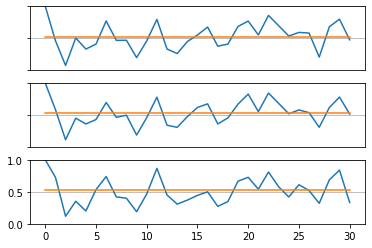

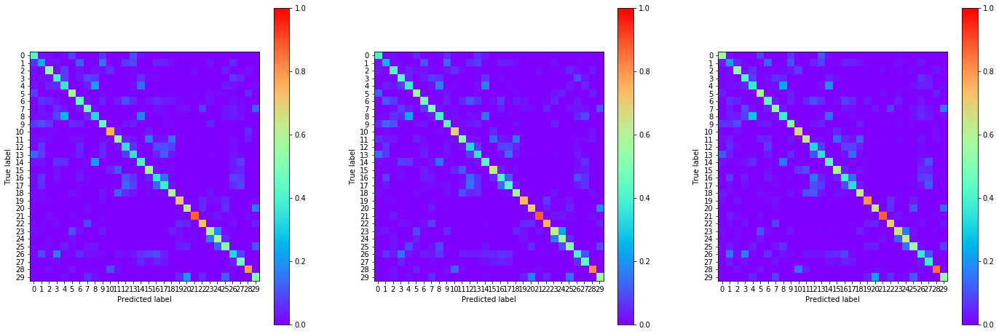

13:42:00.028356
#029 [Train: 1.526] [Test: 1.556] [Valid: 1.512]
#029 [Train: 0.538] [Test: 0.544] [Valid: 0.543]


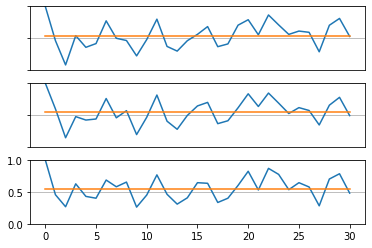

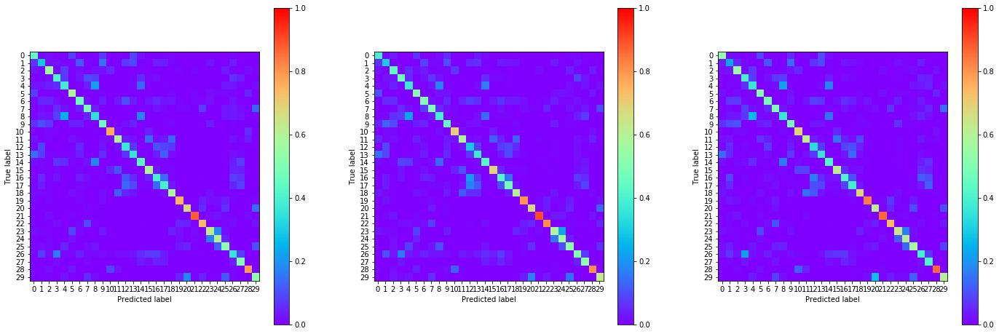

13:43:07.170163
#030 [Train: 1.490] [Test: 1.522] [Valid: 1.478]
#030 [Train: 0.550] [Test: 0.553] [Valid: 0.566]


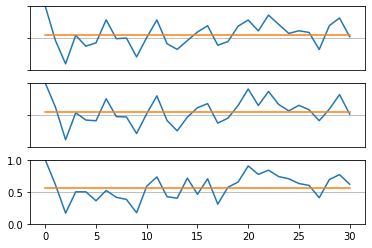

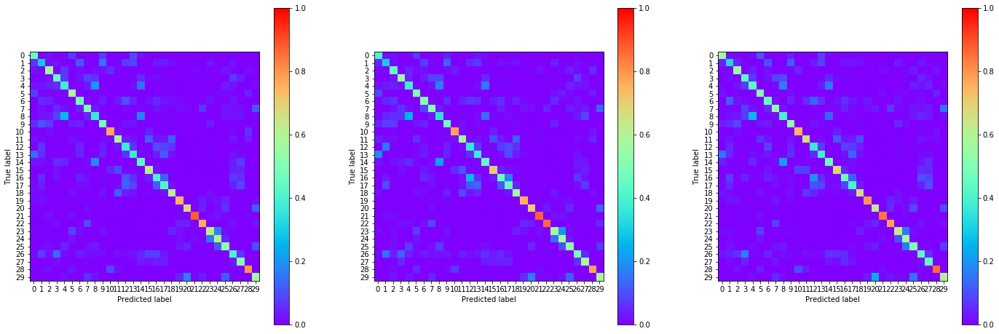

13:44:16.083669
#031 [Train: 1.447] [Test: 1.483] [Valid: 1.439]
#031 [Train: 0.564] [Test: 0.564] [Valid: 0.567]


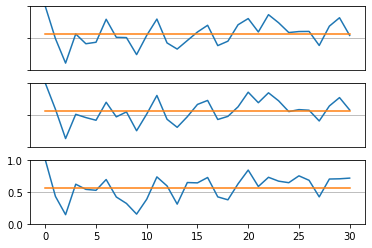

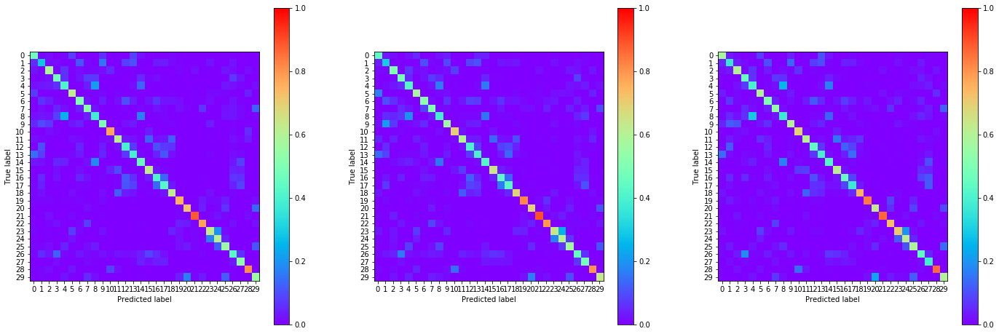

13:45:23.097295
#032 [Train: 1.415] [Test: 1.457] [Valid: 1.410]
#032 [Train: 0.575] [Test: 0.575] [Valid: 0.574]


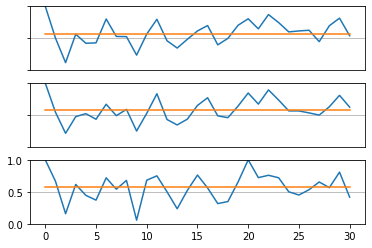

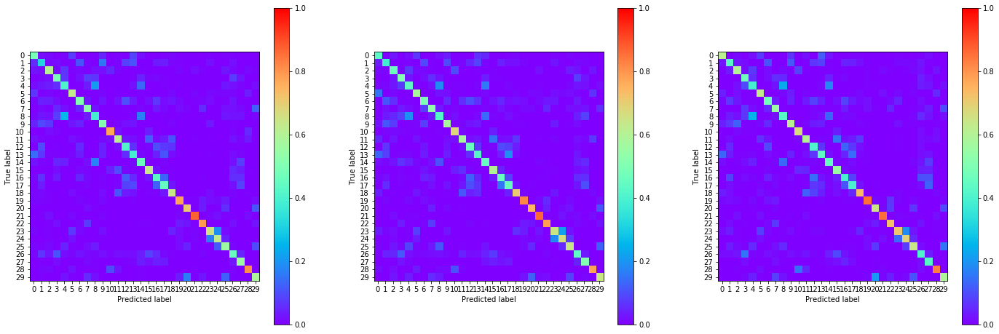

13:46:31.365730
#033 [Train: 1.374] [Test: 1.447] [Valid: 1.398]
#033 [Train: 0.590] [Test: 0.569] [Valid: 0.578]


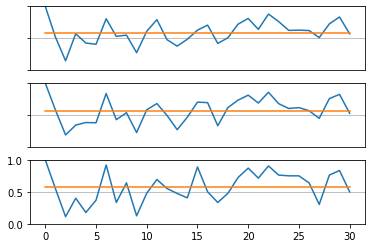

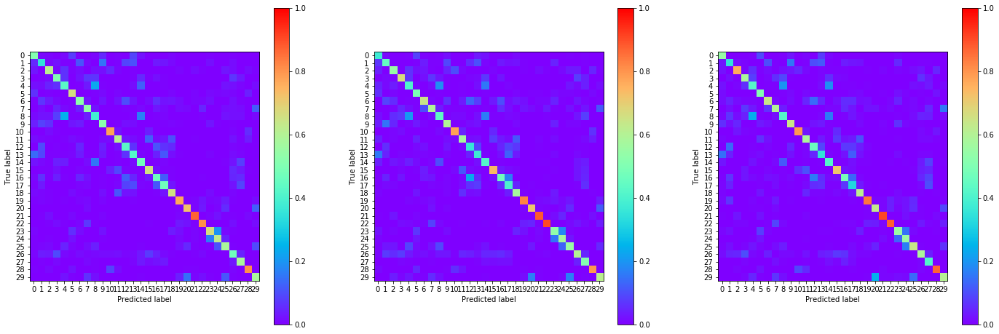

13:47:39.285440
#034 [Train: 1.340] [Test: 1.380] [Valid: 1.334]
#034 [Train: 0.602] [Test: 0.598] [Valid: 0.605]


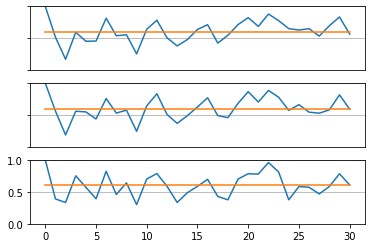

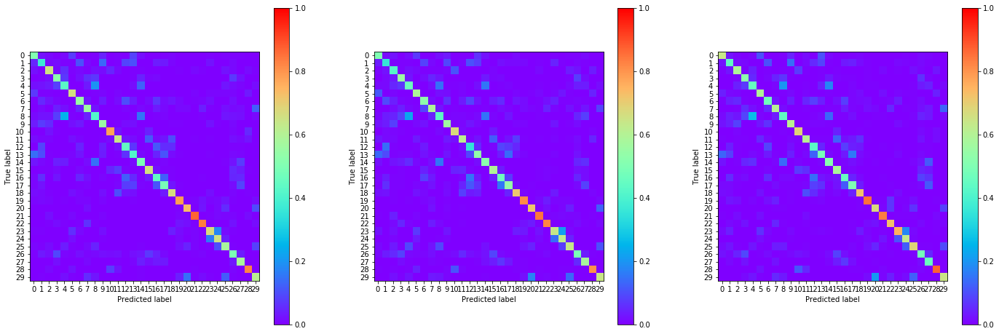

13:48:47.821953
#035 [Train: 1.304] [Test: 1.355] [Valid: 1.299]
#035 [Train: 0.611] [Test: 0.608] [Valid: 0.617]


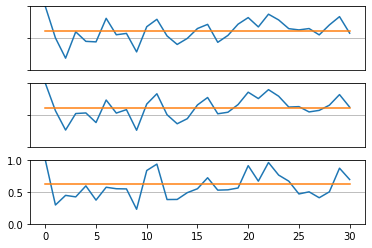

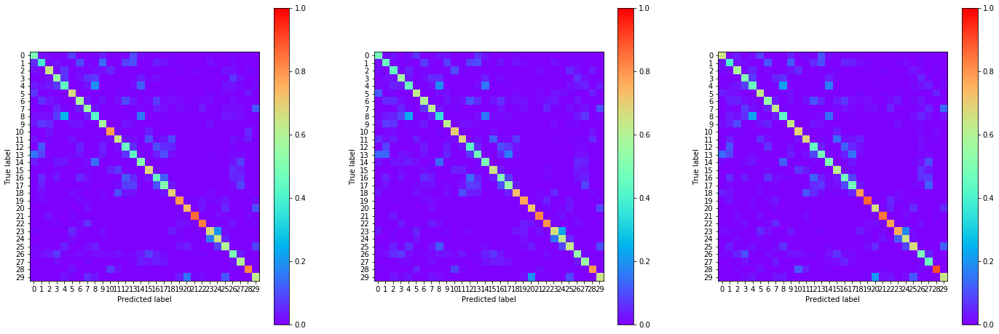

13:49:55.288210
#036 [Train: 1.277] [Test: 1.317] [Valid: 1.259]
#036 [Train: 0.619] [Test: 0.620] [Valid: 0.628]


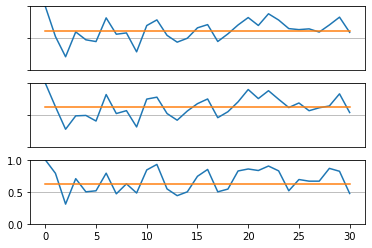

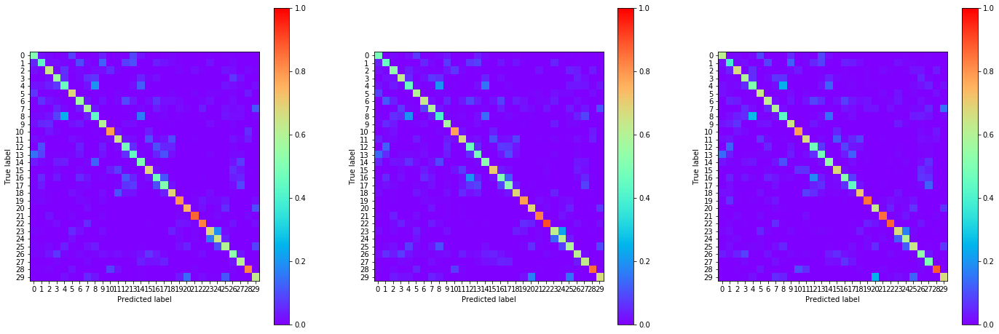

13:51:03.797222
#037 [Train: 1.240] [Test: 1.294] [Valid: 1.242]
#037 [Train: 0.633] [Test: 0.621] [Valid: 0.632]


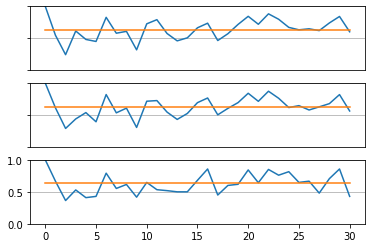

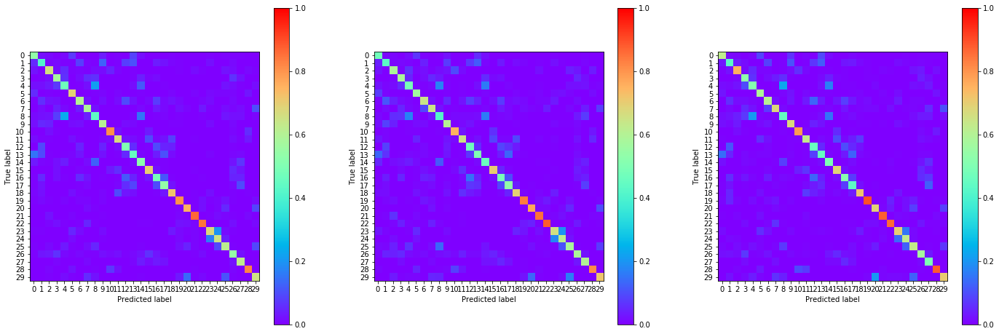

13:52:12.327996
#038 [Train: 1.215] [Test: 1.261] [Valid: 1.204]
#038 [Train: 0.639] [Test: 0.639] [Valid: 0.645]


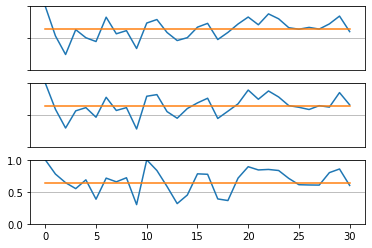

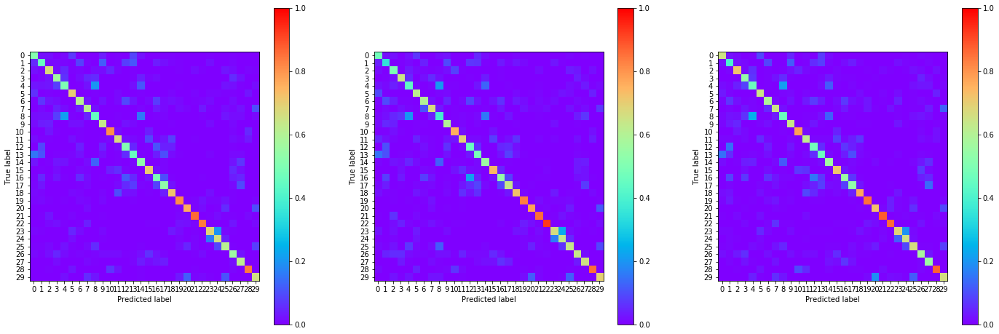

13:53:20.967708
#039 [Train: 1.188] [Test: 1.243] [Valid: 1.183]
#039 [Train: 0.646] [Test: 0.635] [Valid: 0.651]


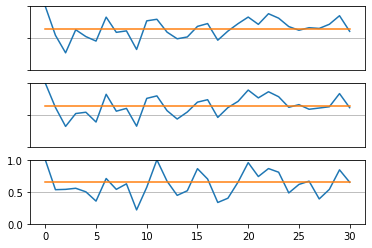

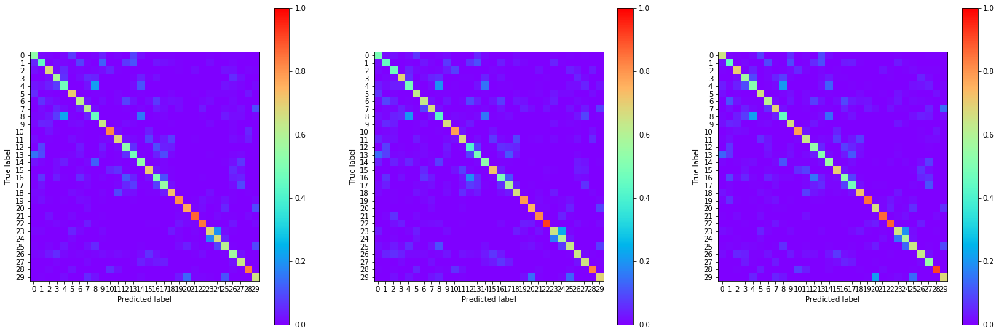

13:54:29.957150
#040 [Train: 1.158] [Test: 1.214] [Valid: 1.158]
#040 [Train: 0.655] [Test: 0.647] [Valid: 0.660]


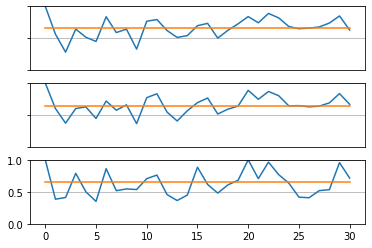

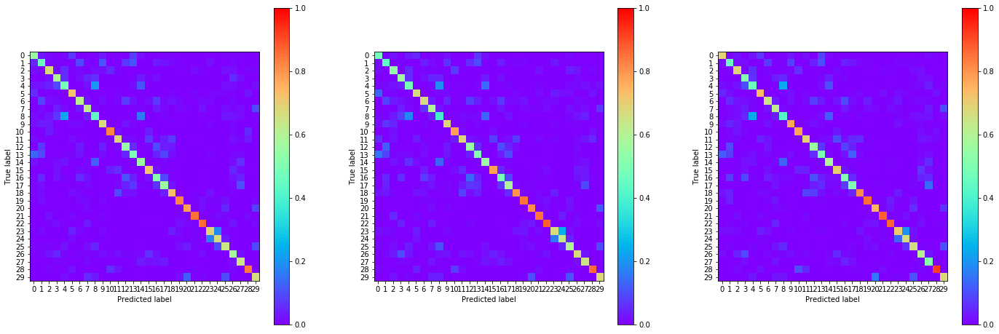

13:55:38.241189
#041 [Train: 1.135] [Test: 1.211] [Valid: 1.143]
#041 [Train: 0.664] [Test: 0.647] [Valid: 0.658]


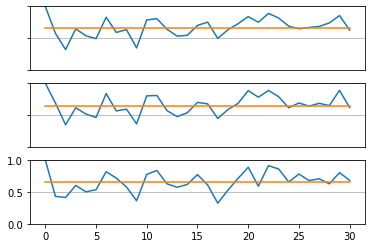

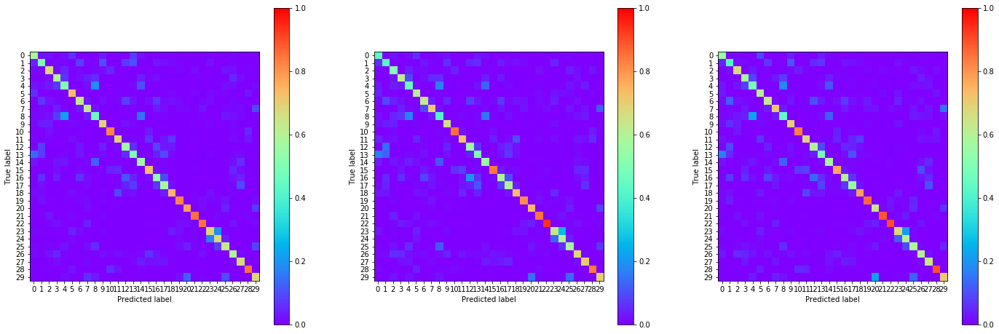

13:56:46.154472
#042 [Train: 1.112] [Test: 1.181] [Valid: 1.122]
#042 [Train: 0.670] [Test: 0.648] [Valid: 0.669]


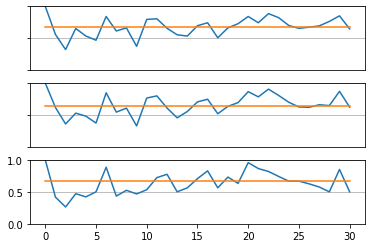

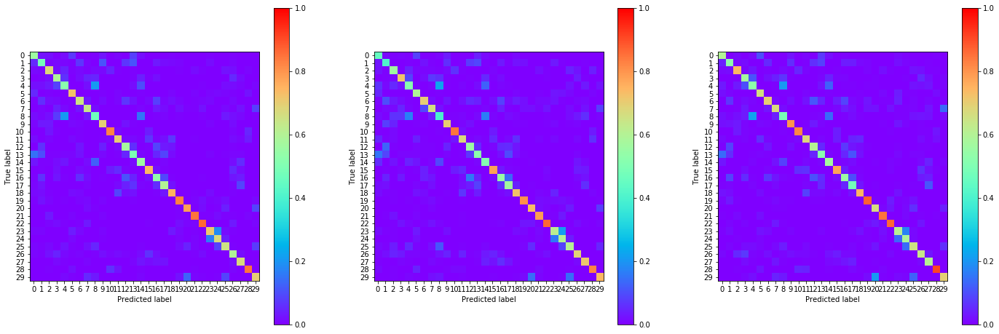

13:57:55.418938
#043 [Train: 1.086] [Test: 1.152] [Valid: 1.098]
#043 [Train: 0.677] [Test: 0.670] [Valid: 0.680]


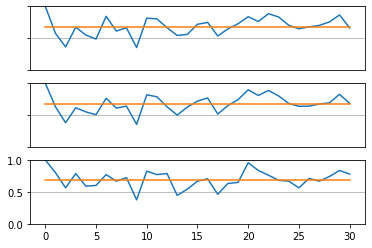

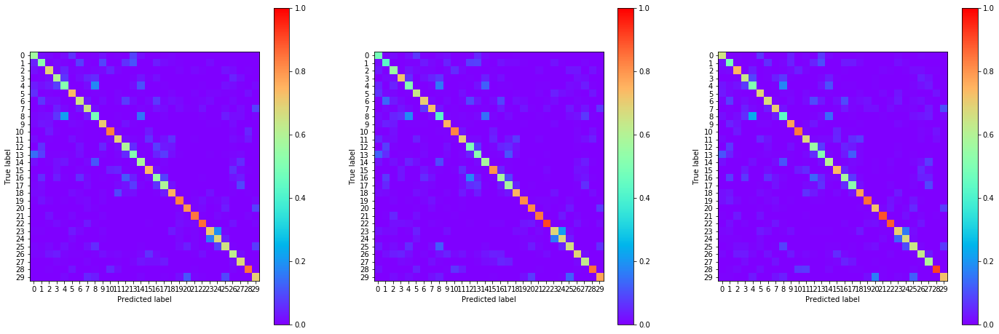

13:59:04.632316
#044 [Train: 1.070] [Test: 1.128] [Valid: 1.078]
#044 [Train: 0.683] [Test: 0.671] [Valid: 0.682]


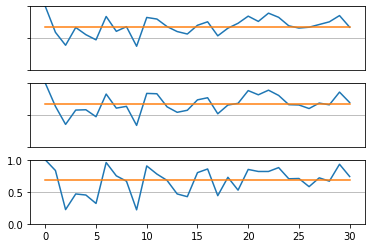

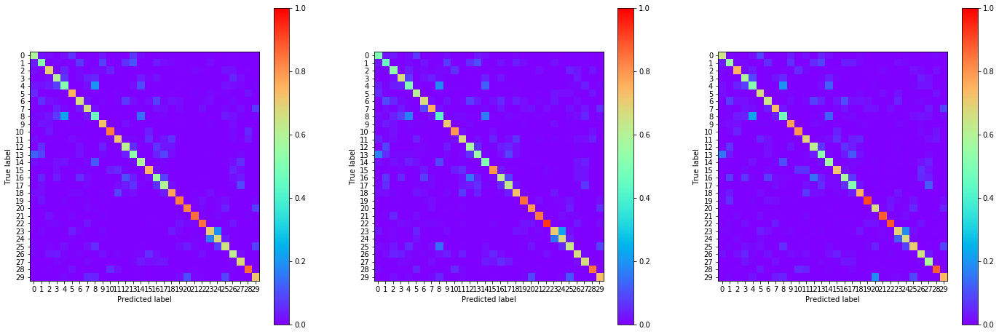

14:00:12.797171
#045 [Train: 1.054] [Test: 1.101] [Valid: 1.066]
#045 [Train: 0.686] [Test: 0.680] [Valid: 0.683]


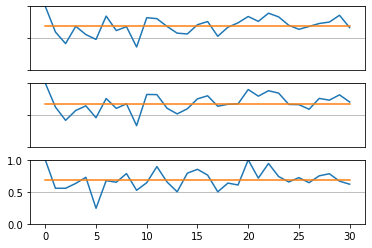

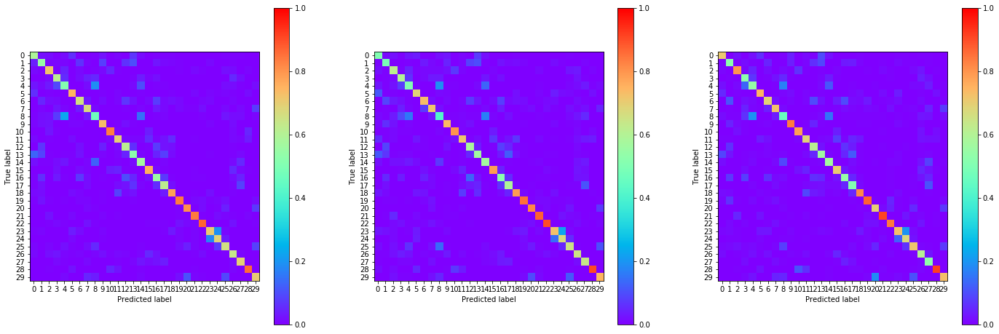

14:01:21.934780
#046 [Train: 1.026] [Test: 1.095] [Valid: 1.038]
#046 [Train: 0.698] [Test: 0.683] [Valid: 0.697]


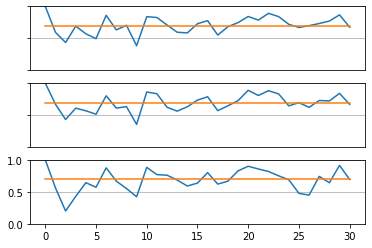

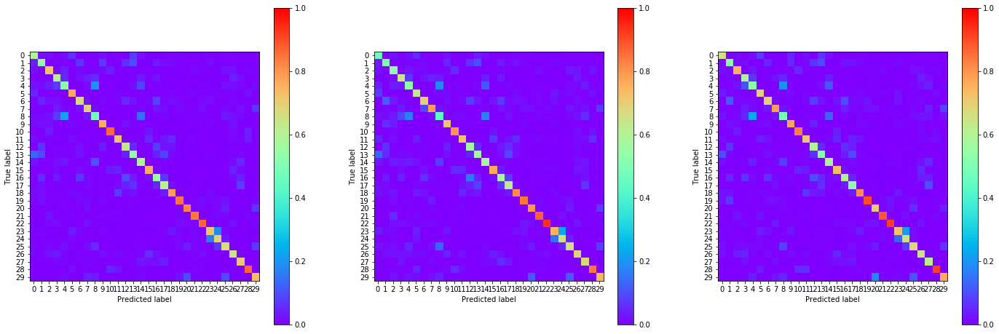

14:02:30.072782
#047 [Train: 1.008] [Test: 1.074] [Valid: 1.025]
#047 [Train: 0.702] [Test: 0.690] [Valid: 0.696]


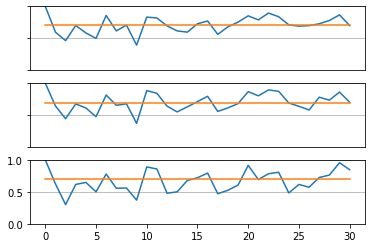

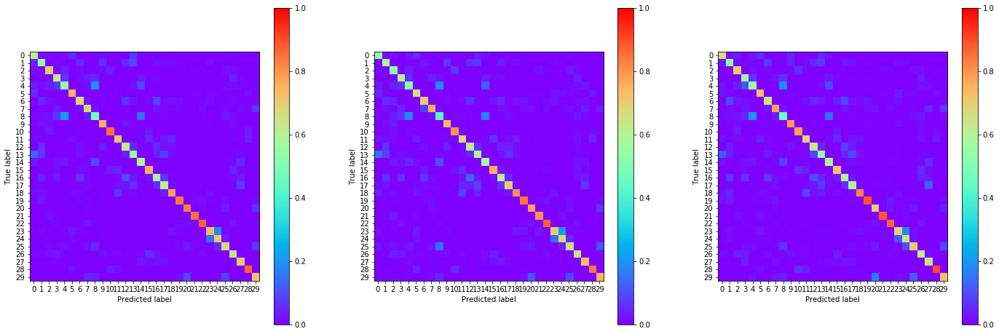

14:03:38.762337
#048 [Train: 0.985] [Test: 1.057] [Valid: 1.008]
#048 [Train: 0.709] [Test: 0.693] [Valid: 0.705]


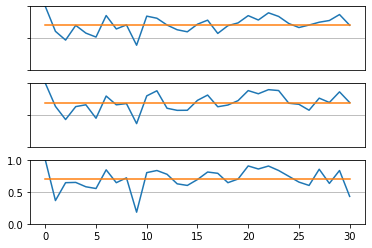

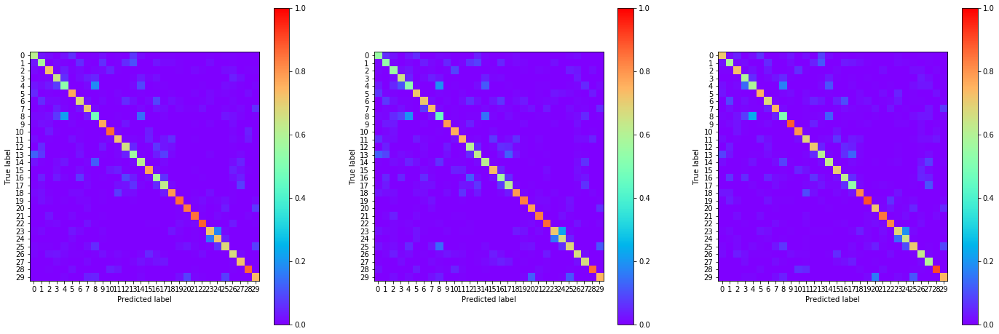

14:04:47.423190
#049 [Train: 0.972] [Test: 1.080] [Valid: 1.027]
#049 [Train: 0.713] [Test: 0.680] [Valid: 0.694]


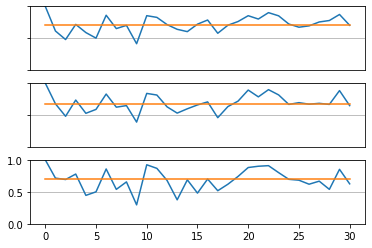

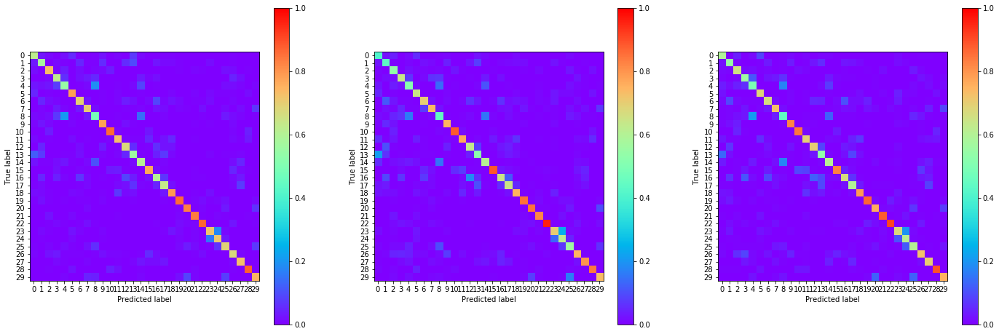

14:05:55.892770
#050 [Train: 0.960] [Test: 1.032] [Valid: 0.993]
#050 [Train: 0.716] [Test: 0.700] [Valid: 0.707]


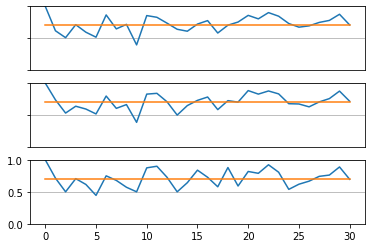

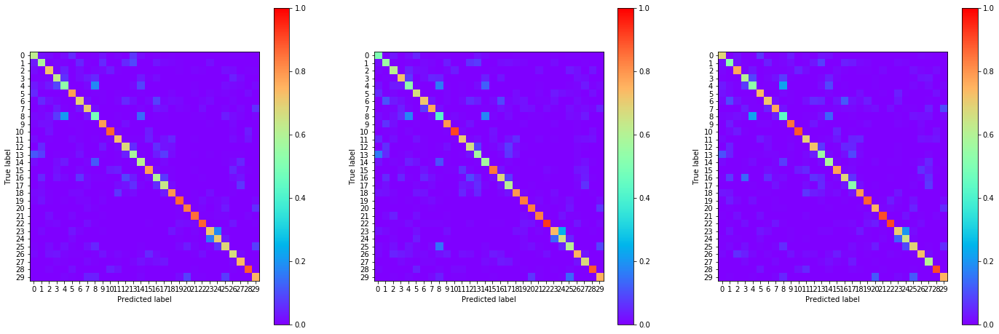

14:07:04.697433
#051 [Train: 0.942] [Test: 1.012] [Valid: 0.965]
#051 [Train: 0.721] [Test: 0.705] [Valid: 0.711]


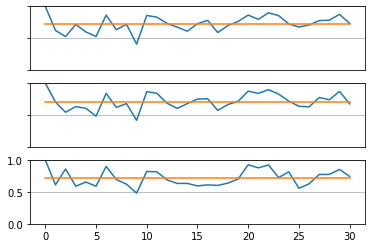

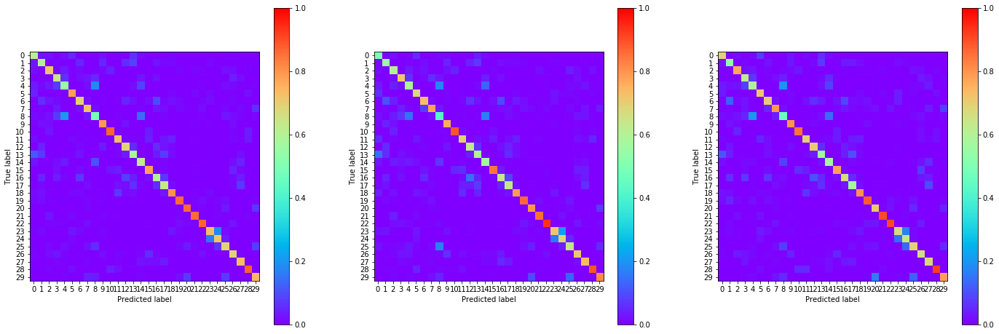

14:08:13.013699
#052 [Train: 0.918] [Test: 0.998] [Valid: 0.944]
#052 [Train: 0.729] [Test: 0.708] [Valid: 0.723]


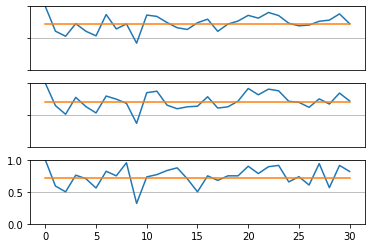

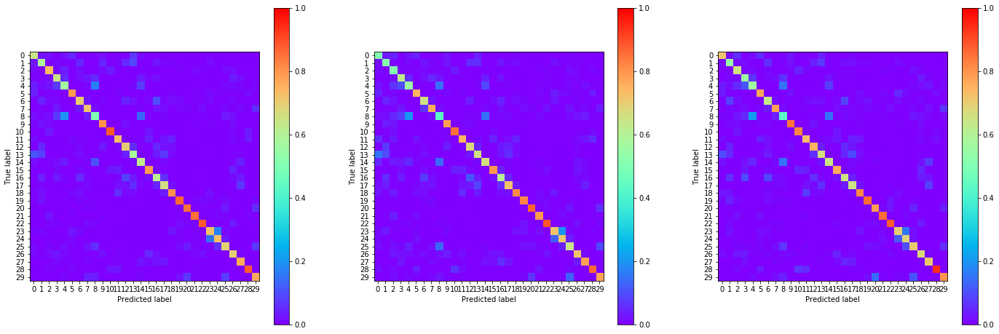

14:09:21.294945
#053 [Train: 0.916] [Test: 0.981] [Valid: 0.940]
#053 [Train: 0.730] [Test: 0.712] [Valid: 0.724]


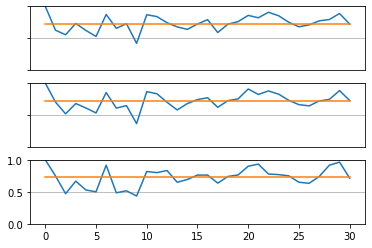

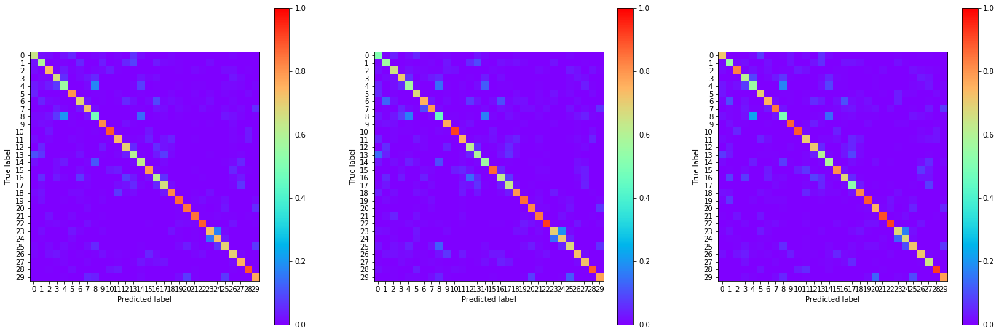

14:10:29.033350
#054 [Train: 0.894] [Test: 0.958] [Valid: 0.918]
#054 [Train: 0.736] [Test: 0.719] [Valid: 0.729]


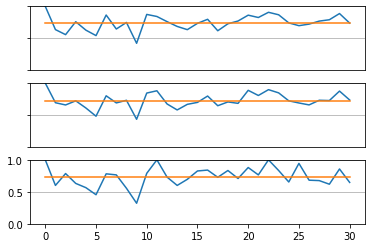

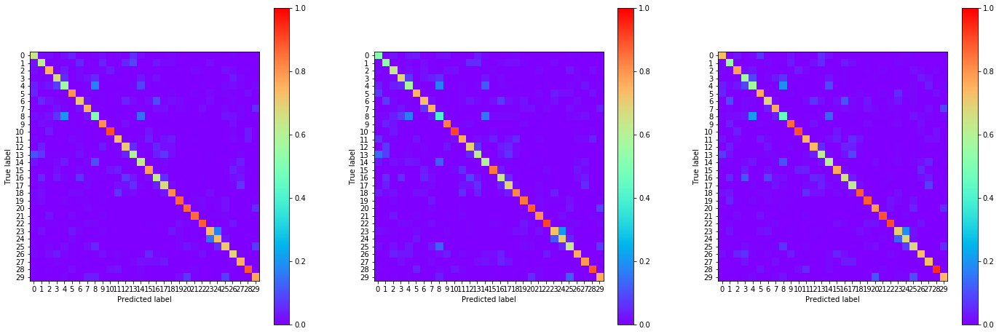

14:11:35.190032
#055 [Train: 0.874] [Test: 0.978] [Valid: 0.932]
#055 [Train: 0.745] [Test: 0.713] [Valid: 0.721]


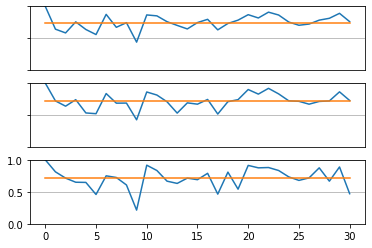

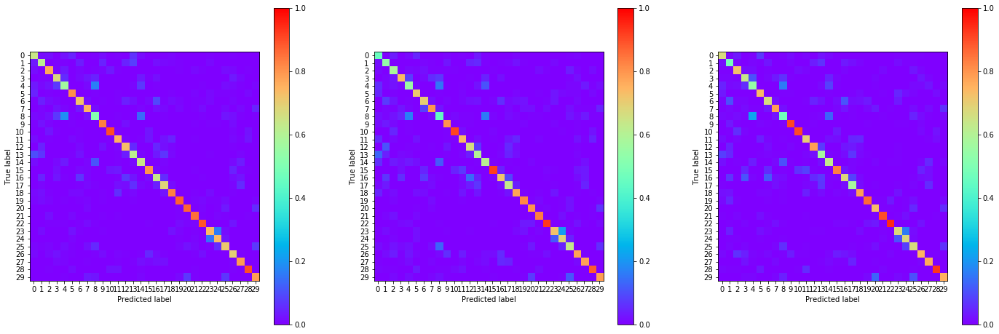

14:12:41.408557
#056 [Train: 0.863] [Test: 0.929] [Valid: 0.899]
#056 [Train: 0.746] [Test: 0.731] [Valid: 0.734]


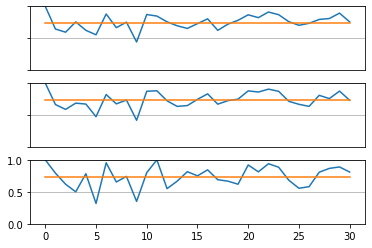

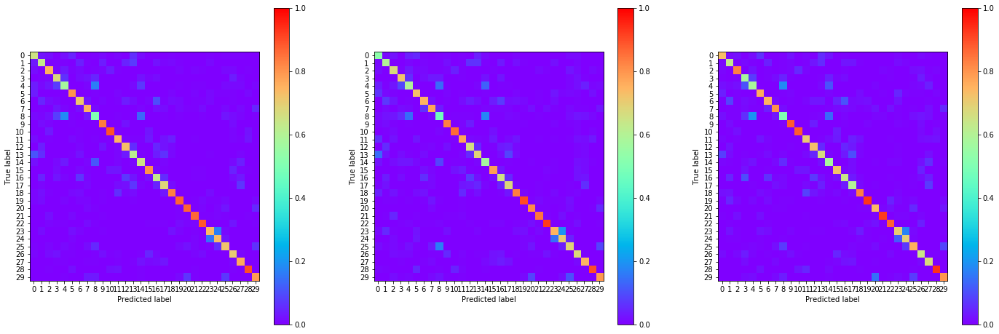

14:13:47.318722
#057 [Train: 0.850] [Test: 0.921] [Valid: 0.880]
#057 [Train: 0.749] [Test: 0.726] [Valid: 0.735]


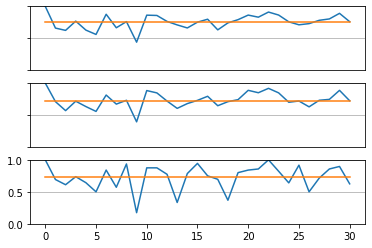

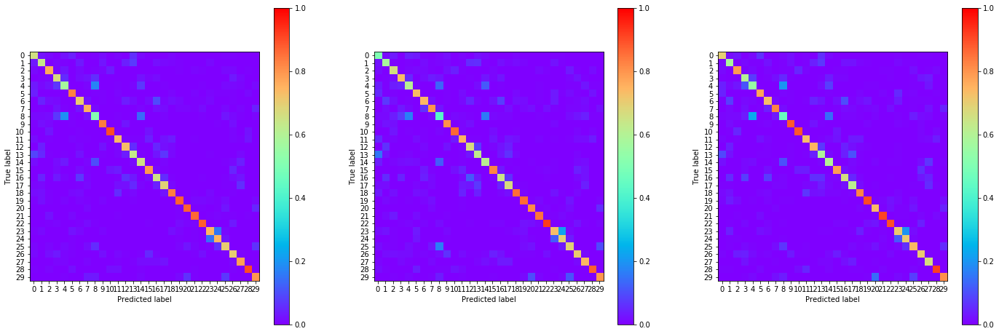

14:14:53.544425
#058 [Train: 0.834] [Test: 0.916] [Valid: 0.865]
#058 [Train: 0.755] [Test: 0.731] [Valid: 0.746]


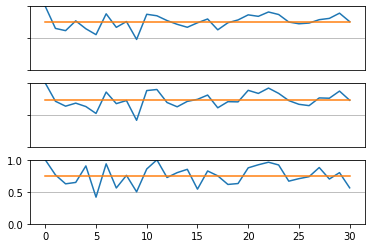

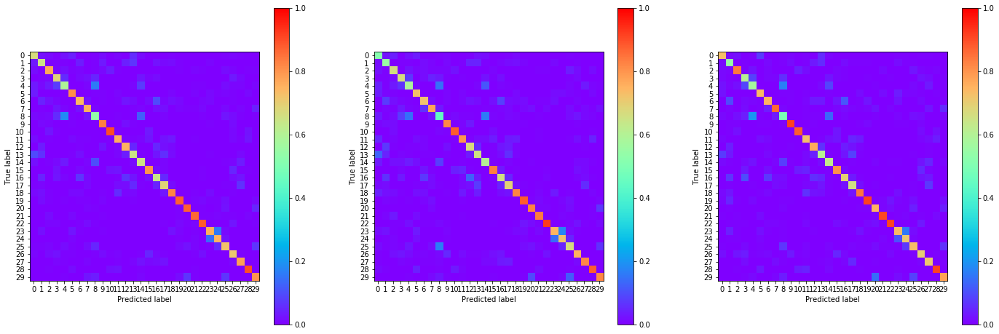

14:15:59.007505
#059 [Train: 0.827] [Test: 0.904] [Valid: 0.870]
#059 [Train: 0.756] [Test: 0.735] [Valid: 0.744]


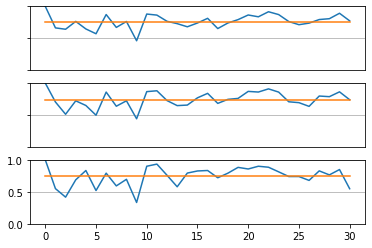

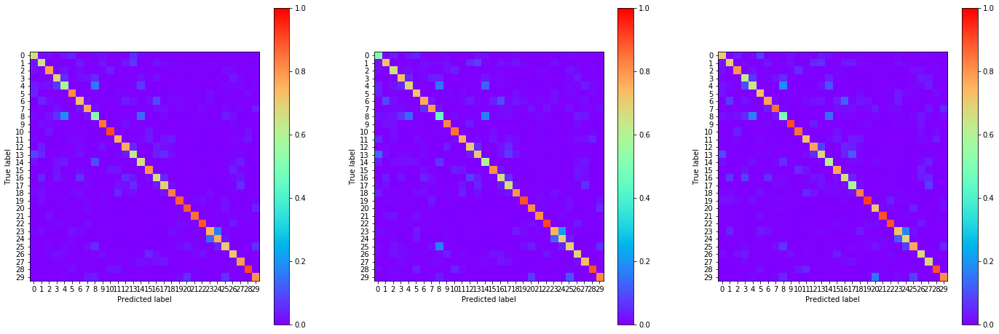

14:17:06.287275
#060 [Train: 0.812] [Test: 0.887] [Valid: 0.852]
#060 [Train: 0.760] [Test: 0.740] [Valid: 0.749]


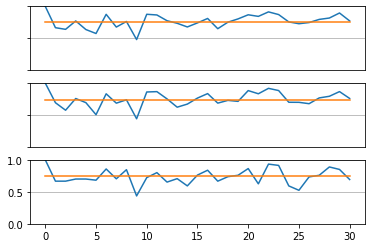

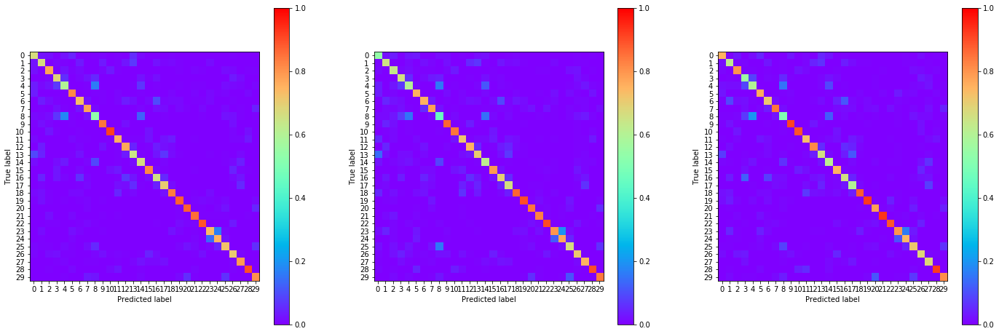

14:18:12.199835
#061 [Train: 0.795] [Test: 0.885] [Valid: 0.841]
#061 [Train: 0.767] [Test: 0.742] [Valid: 0.751]


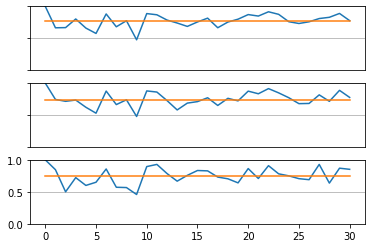

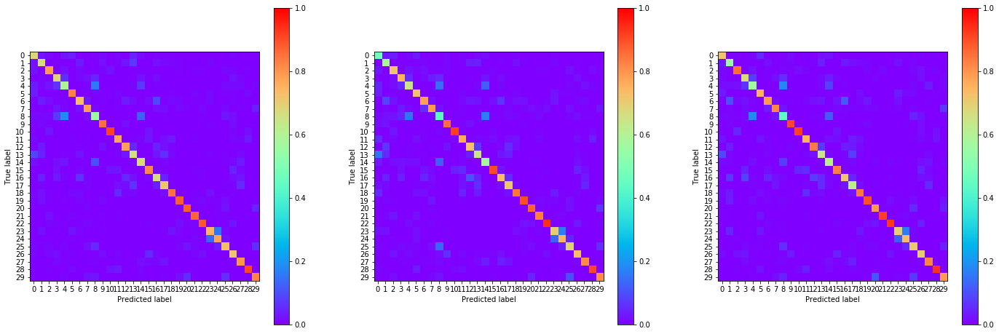

14:19:18.157864
#062 [Train: 0.785] [Test: 0.869] [Valid: 0.833]
#062 [Train: 0.769] [Test: 0.747] [Valid: 0.756]


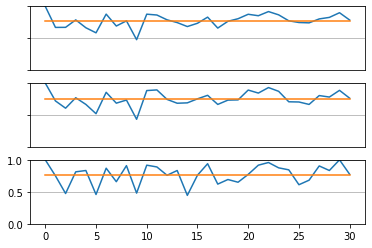

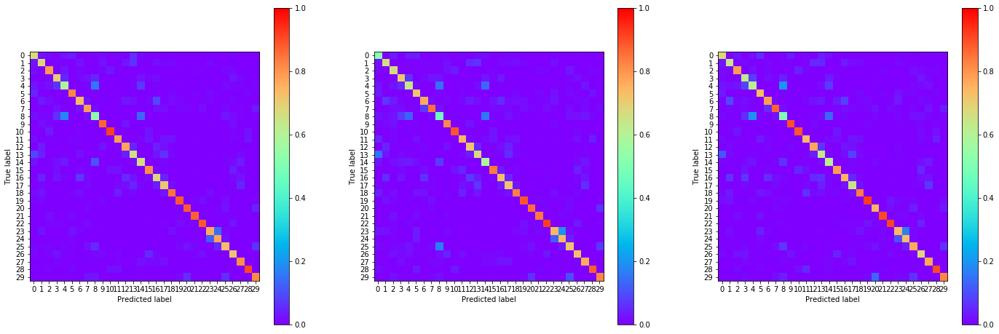

14:20:25.141477
#063 [Train: 0.770] [Test: 0.846] [Valid: 0.815]
#063 [Train: 0.776] [Test: 0.753] [Valid: 0.759]


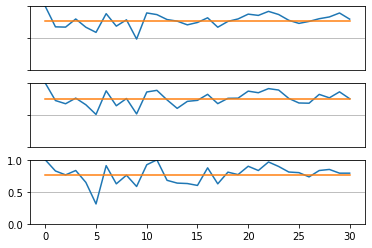

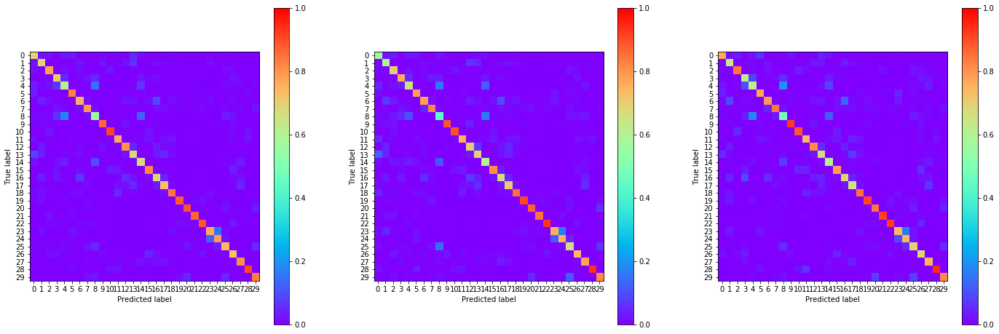

14:21:33.064290
#064 [Train: 0.764] [Test: 0.840] [Valid: 0.807]
#064 [Train: 0.775] [Test: 0.752] [Valid: 0.759]


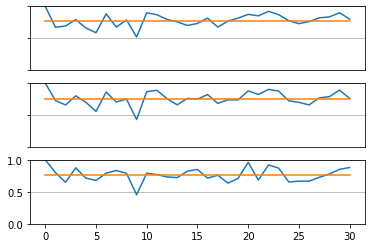

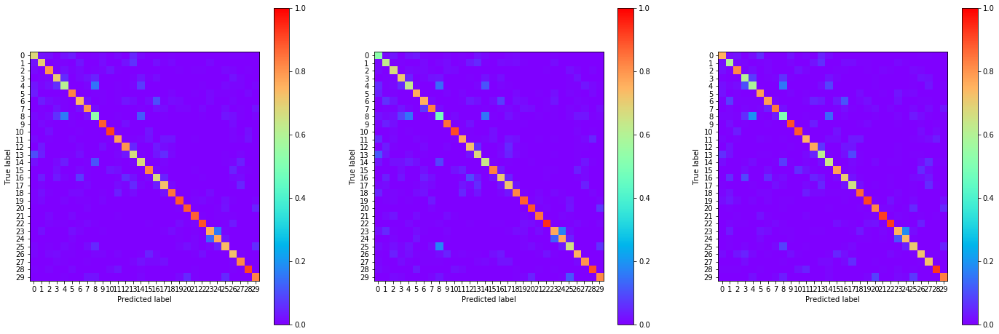

14:22:40.000297
#065 [Train: 0.748] [Test: 0.836] [Valid: 0.802]
#065 [Train: 0.780] [Test: 0.755] [Valid: 0.765]


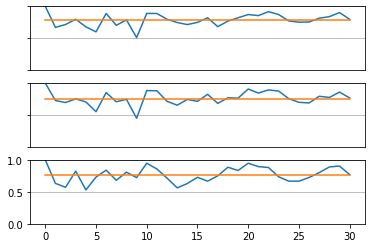

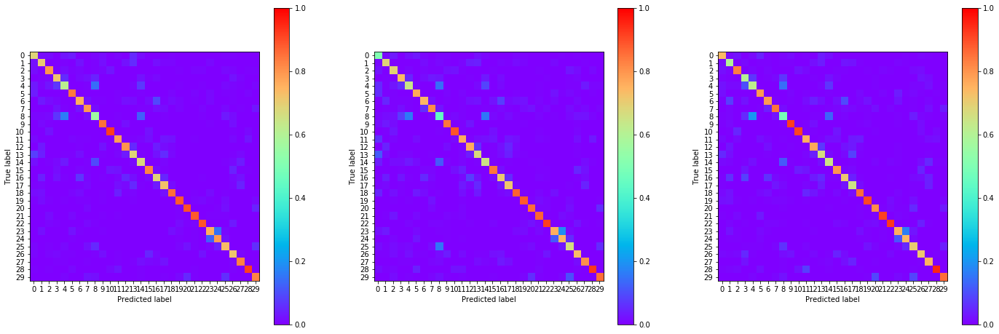

14:23:47.381129
#066 [Train: 0.736] [Test: 0.852] [Valid: 0.805]
#066 [Train: 0.784] [Test: 0.749] [Valid: 0.760]


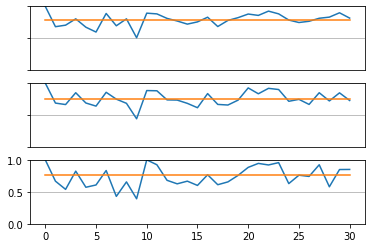

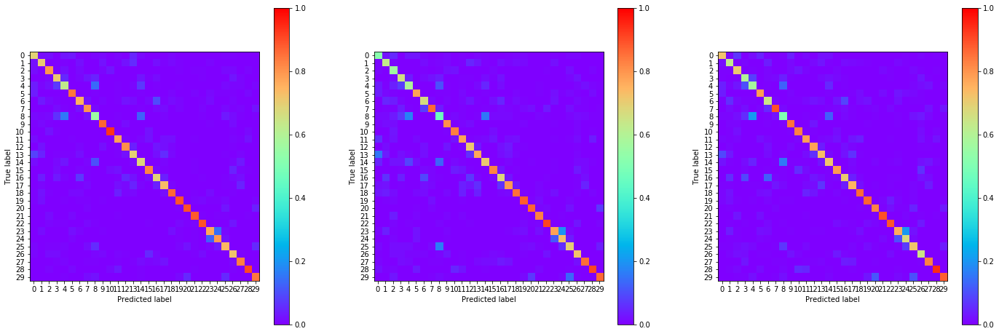

14:24:54.359159
#067 [Train: 0.732] [Test: 0.827] [Valid: 0.796]
#067 [Train: 0.787] [Test: 0.761] [Valid: 0.766]


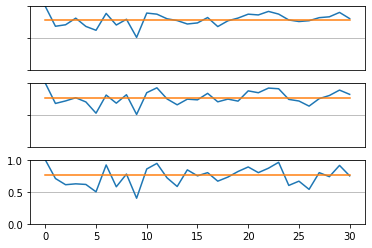

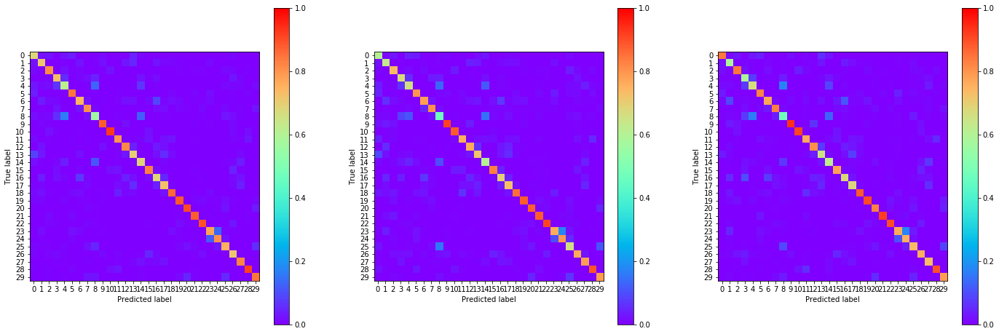

14:26:02.123357
#068 [Train: 0.721] [Test: 0.852] [Valid: 0.809]
#068 [Train: 0.789] [Test: 0.751] [Valid: 0.757]


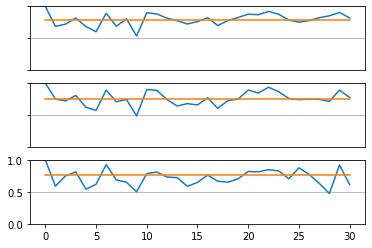

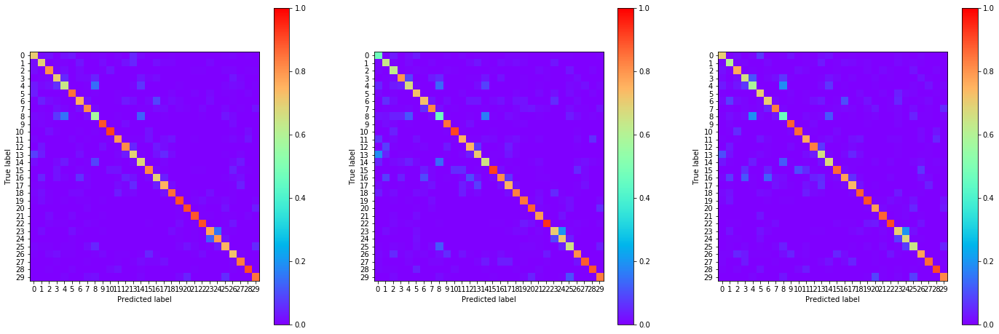

14:27:10.465502
#069 [Train: 0.708] [Test: 0.789] [Valid: 0.762]
#069 [Train: 0.791] [Test: 0.768] [Valid: 0.771]


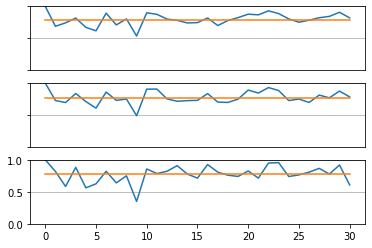

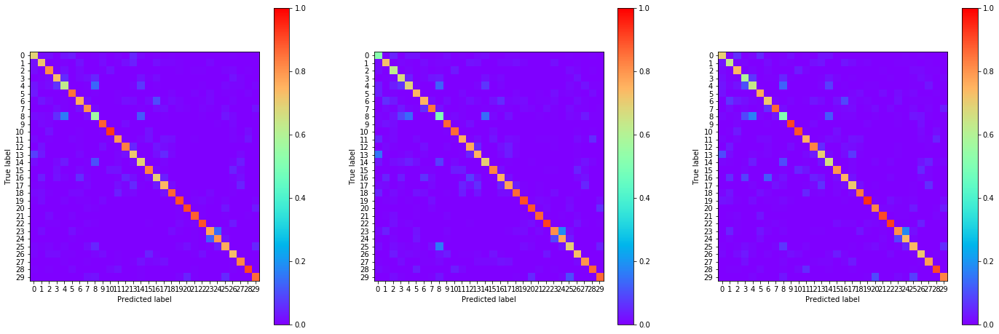

14:28:18.769631
#070 [Train: 0.697] [Test: 0.784] [Valid: 0.761]
#070 [Train: 0.795] [Test: 0.771] [Valid: 0.773]


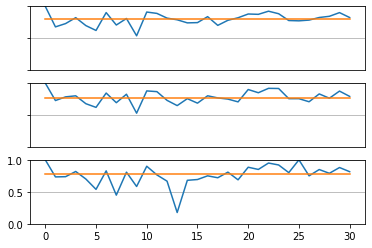

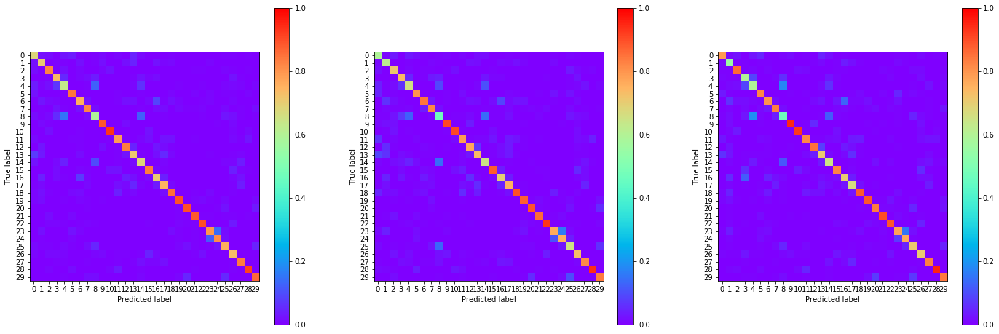

14:29:26.905021
#071 [Train: 0.691] [Test: 0.777] [Valid: 0.744]
#071 [Train: 0.798] [Test: 0.768] [Valid: 0.778]


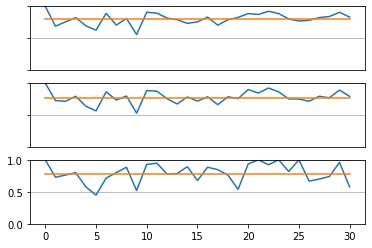

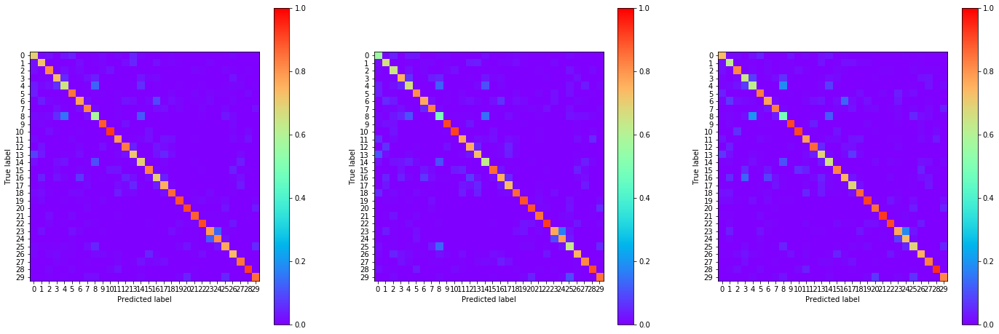

14:30:34.682687
#072 [Train: 0.679] [Test: 0.759] [Valid: 0.736]
#072 [Train: 0.801] [Test: 0.777] [Valid: 0.787]


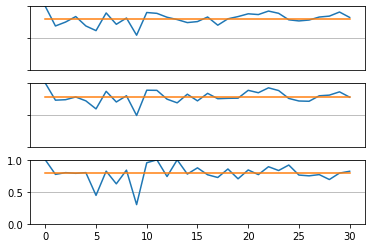

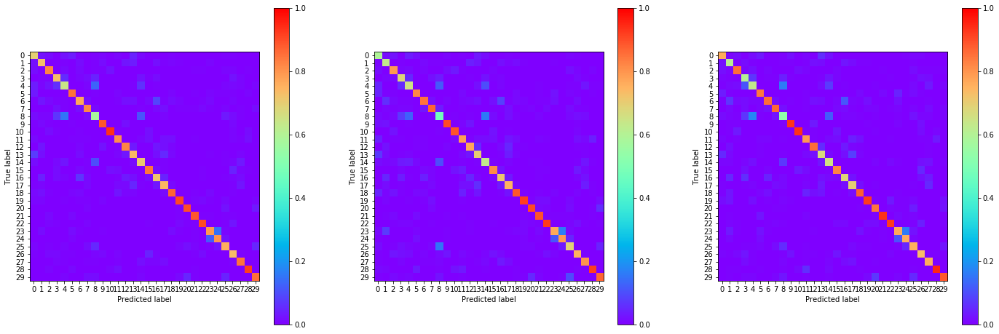

14:31:43.339385
#073 [Train: 0.669] [Test: 0.755] [Valid: 0.731]
#073 [Train: 0.805] [Test: 0.781] [Valid: 0.787]


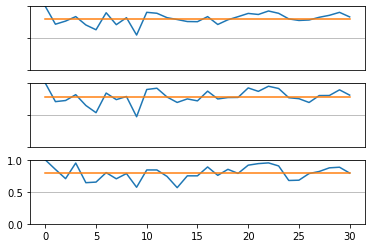

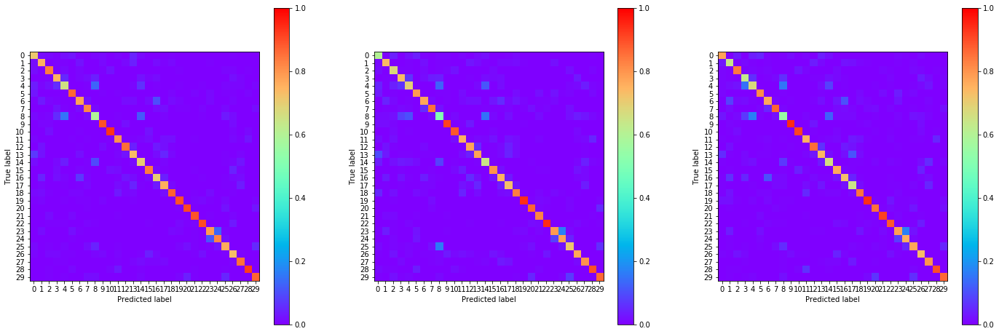

14:32:52.347230
#074 [Train: 0.662] [Test: 0.757] [Valid: 0.725]
#074 [Train: 0.805] [Test: 0.777] [Valid: 0.790]


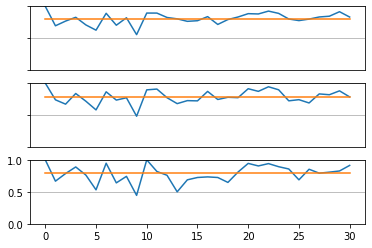

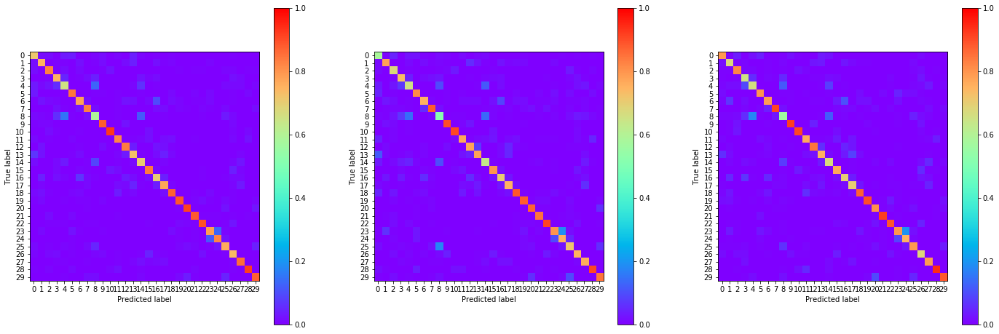

14:34:00.723190
#075 [Train: 0.653] [Test: 0.734] [Valid: 0.714]
#075 [Train: 0.810] [Test: 0.785] [Valid: 0.787]


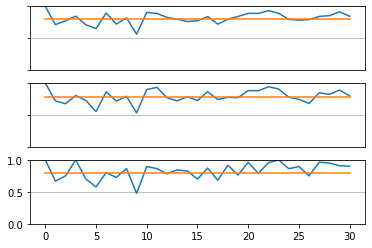

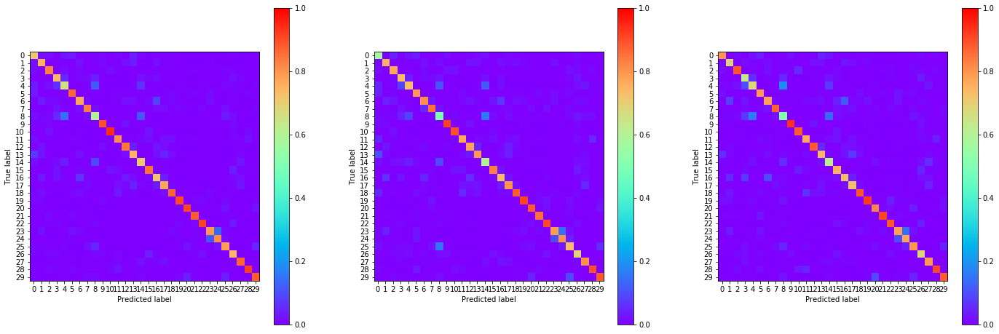

14:35:08.906415
#076 [Train: 0.644] [Test: 0.731] [Valid: 0.704]
#076 [Train: 0.812] [Test: 0.782] [Valid: 0.790]


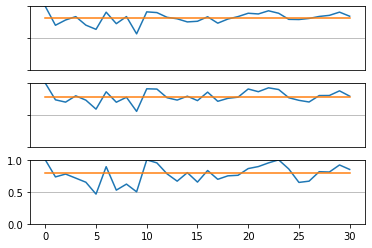

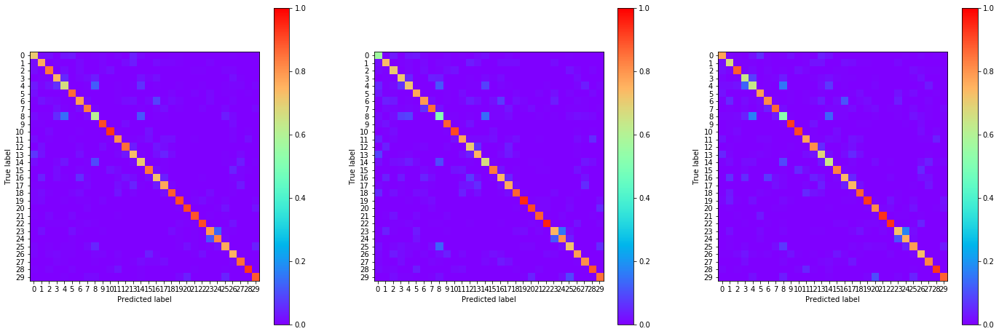

14:36:17.415289
#077 [Train: 0.633] [Test: 0.723] [Valid: 0.697]
#077 [Train: 0.815] [Test: 0.787] [Valid: 0.794]


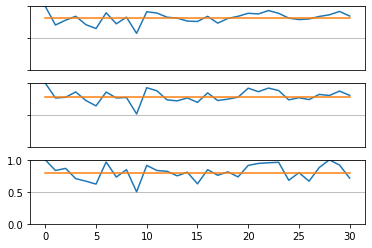

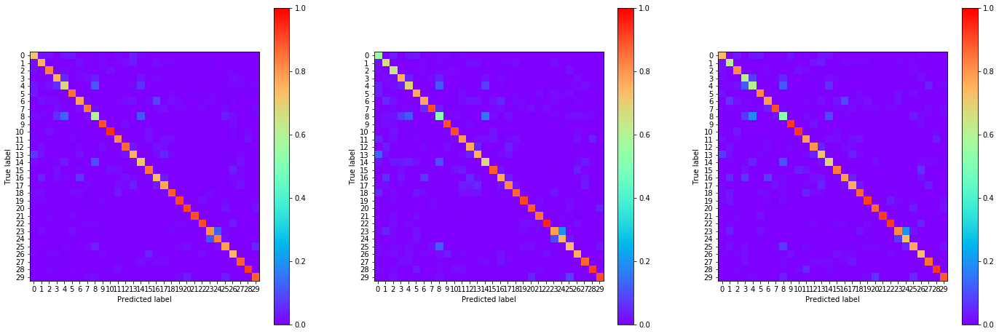

14:37:27.067306
#078 [Train: 0.631] [Test: 0.709] [Valid: 0.685]
#078 [Train: 0.816] [Test: 0.792] [Valid: 0.801]


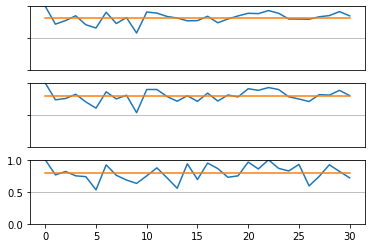

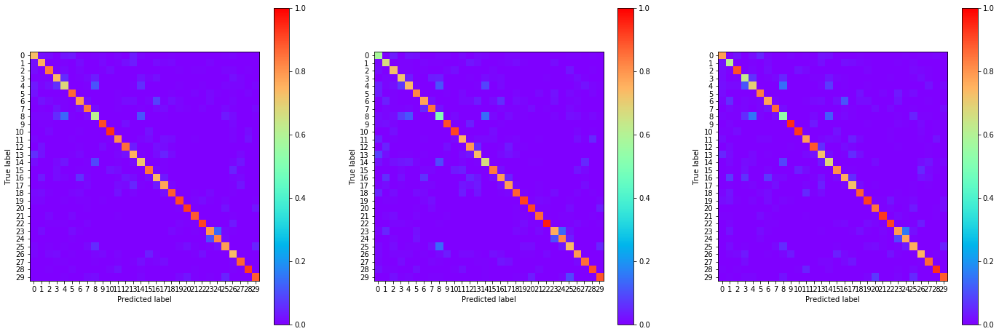

14:38:36.343414
#079 [Train: 0.615] [Test: 0.705] [Valid: 0.686]
#079 [Train: 0.821] [Test: 0.791] [Valid: 0.793]


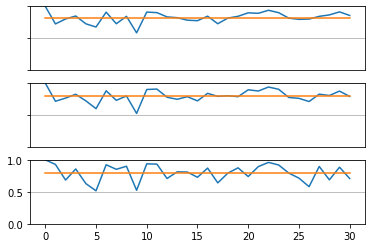

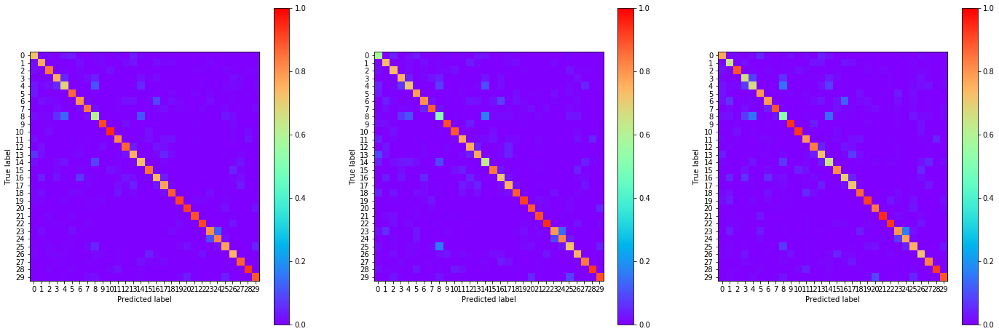

14:39:44.070338
#080 [Train: 0.609] [Test: 0.699] [Valid: 0.682]
#080 [Train: 0.823] [Test: 0.792] [Valid: 0.798]


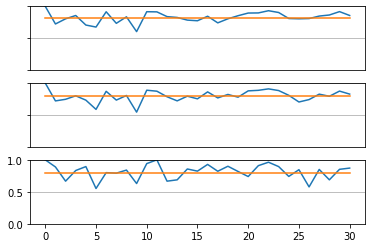

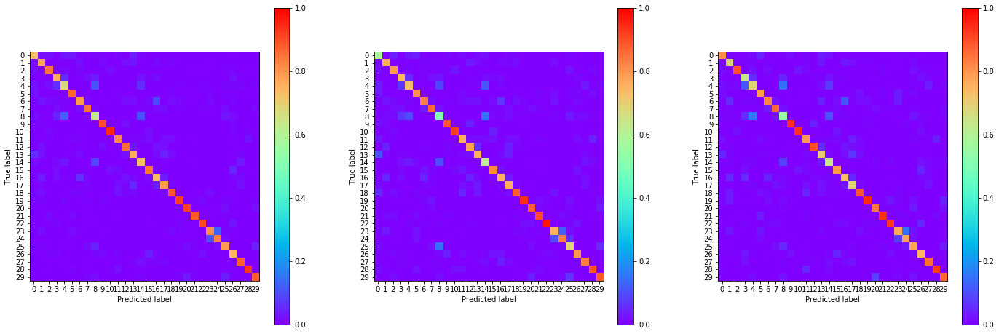

14:40:52.269435
#081 [Train: 0.601] [Test: 0.697] [Valid: 0.668]
#081 [Train: 0.826] [Test: 0.793] [Valid: 0.800]


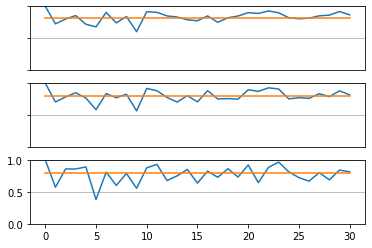

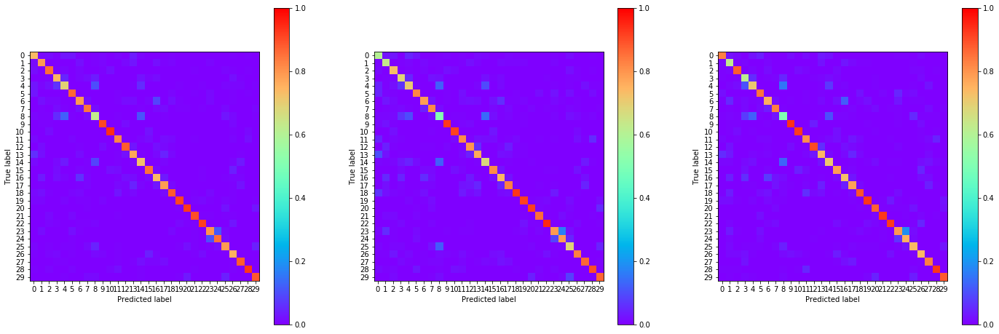

14:41:59.243759
#082 [Train: 0.595] [Test: 0.685] [Valid: 0.657]
#082 [Train: 0.825] [Test: 0.800] [Valid: 0.804]


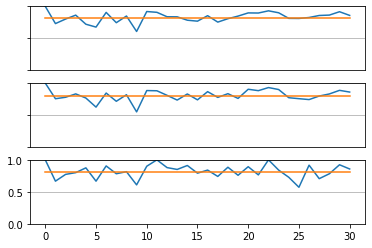

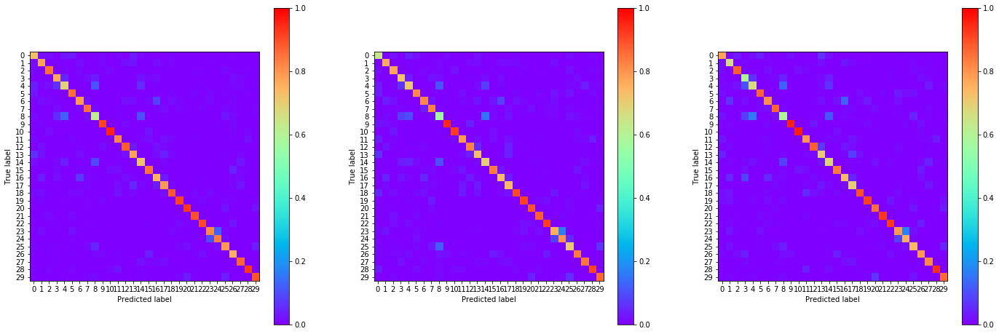

14:43:08.274522
#083 [Train: 0.591] [Test: 0.697] [Valid: 0.659]
#083 [Train: 0.827] [Test: 0.792] [Valid: 0.801]


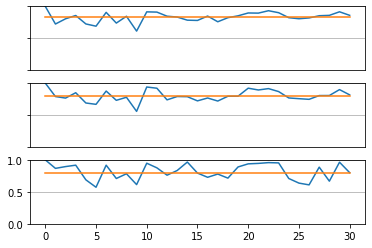

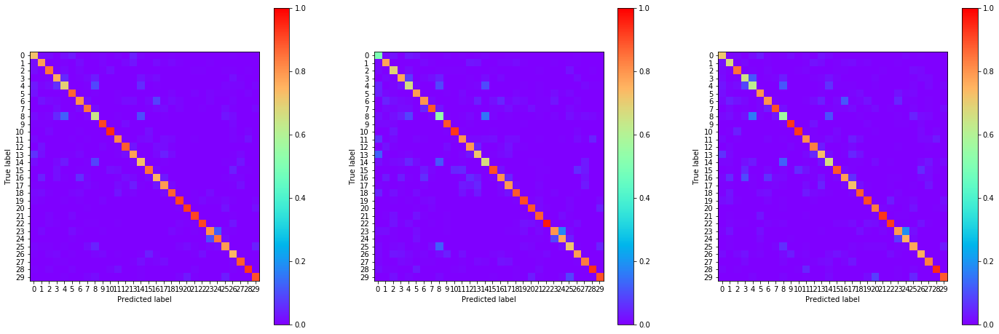

14:44:18.520959
#084 [Train: 0.581] [Test: 0.680] [Valid: 0.649]
#084 [Train: 0.830] [Test: 0.801] [Valid: 0.806]


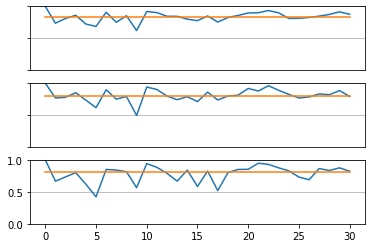

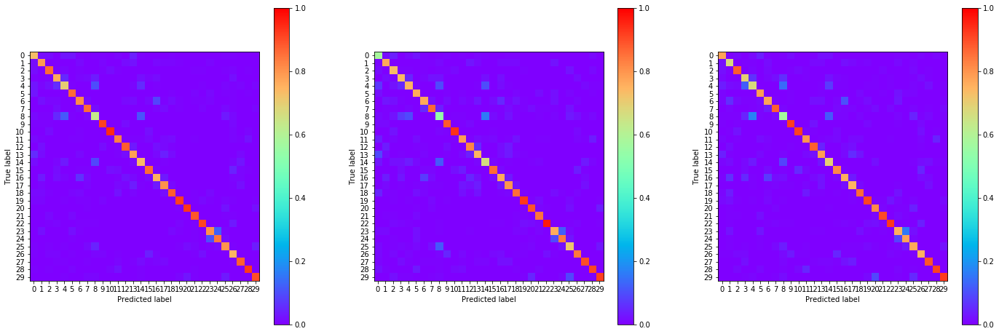

14:45:27.654950
#085 [Train: 0.576] [Test: 0.670] [Valid: 0.654]
#085 [Train: 0.832] [Test: 0.802] [Valid: 0.804]


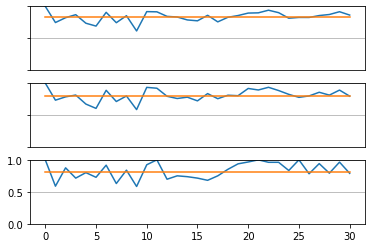

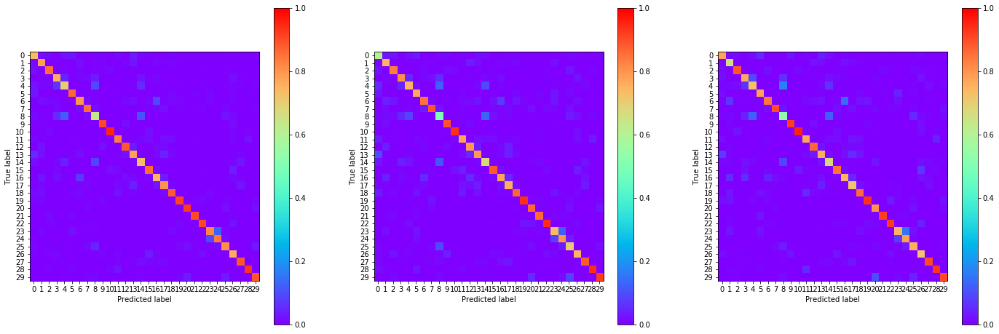

14:46:36.773253
#086 [Train: 0.567] [Test: 0.672] [Valid: 0.647]
#086 [Train: 0.835] [Test: 0.799] [Valid: 0.809]


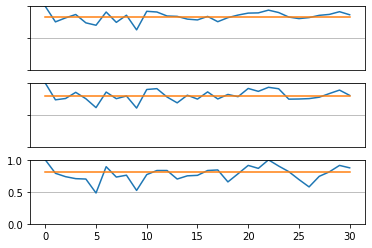

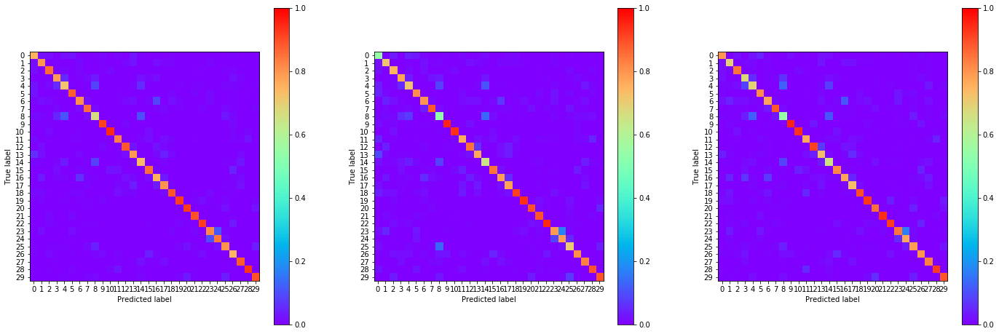

14:47:46.452212
#087 [Train: 0.558] [Test: 0.653] [Valid: 0.638]
#087 [Train: 0.837] [Test: 0.807] [Valid: 0.808]


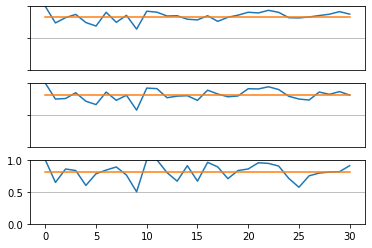

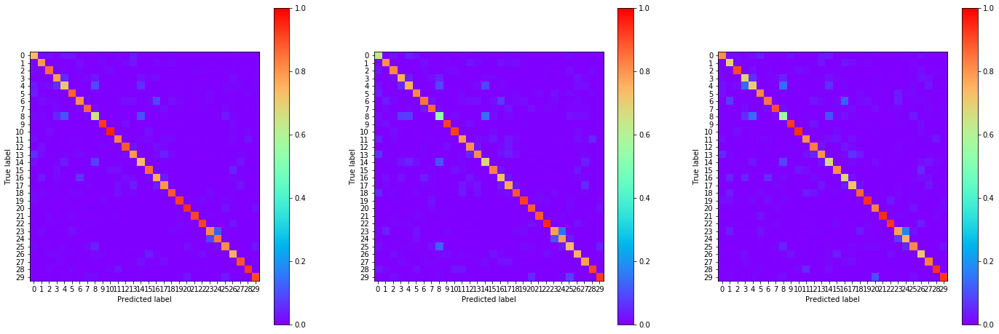

14:48:55.461195
#088 [Train: 0.551] [Test: 0.665] [Valid: 0.622]
#088 [Train: 0.840] [Test: 0.802] [Valid: 0.815]


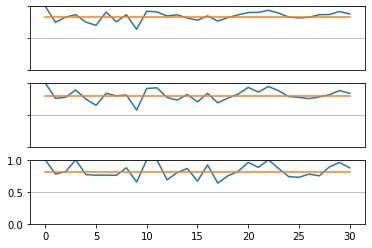

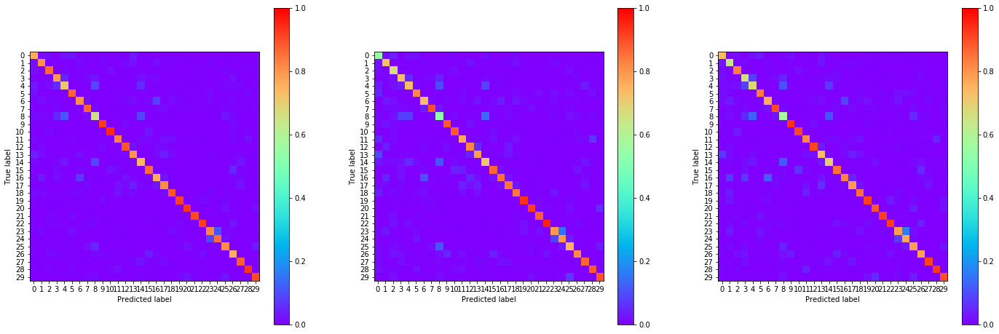

14:50:03.493314
#089 [Train: 0.546] [Test: 0.644] [Valid: 0.628]
#089 [Train: 0.840] [Test: 0.808] [Valid: 0.812]


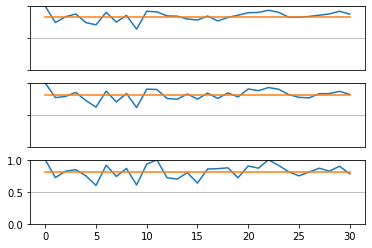

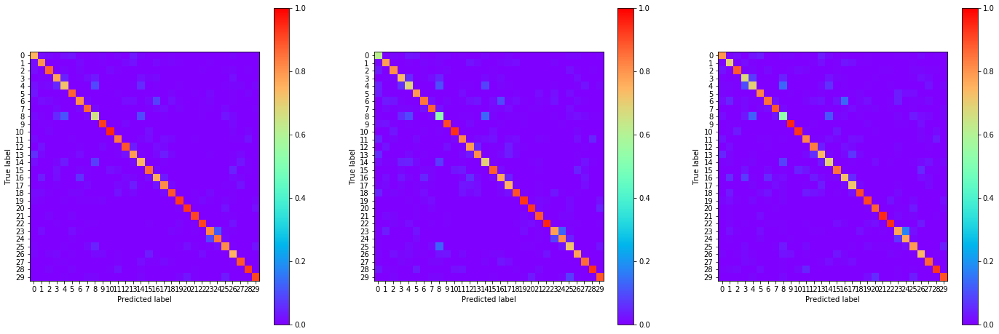

14:51:12.409103
#090 [Train: 0.546] [Test: 0.633] [Valid: 0.611]
#090 [Train: 0.838] [Test: 0.814] [Valid: 0.815]


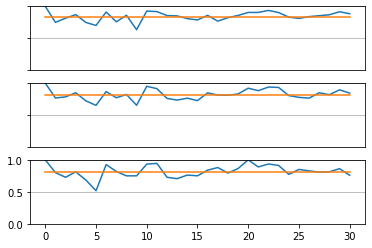

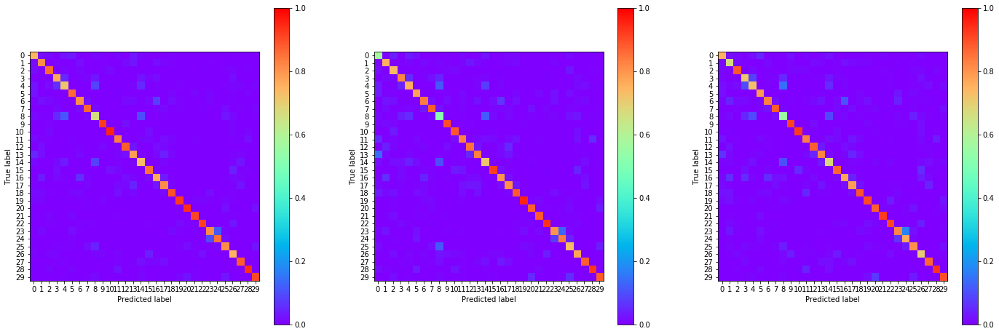

14:52:21.104642
#091 [Train: 0.533] [Test: 0.626] [Valid: 0.606]
#091 [Train: 0.844] [Test: 0.815] [Valid: 0.815]


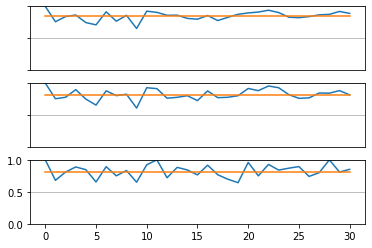

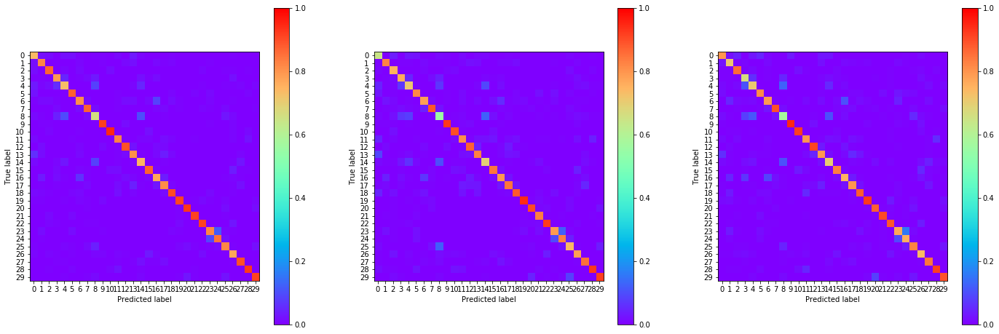

14:53:28.809488
#092 [Train: 0.529] [Test: 0.629] [Valid: 0.609]
#092 [Train: 0.846] [Test: 0.815] [Valid: 0.816]


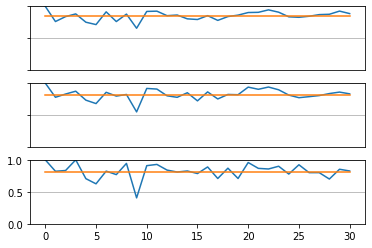

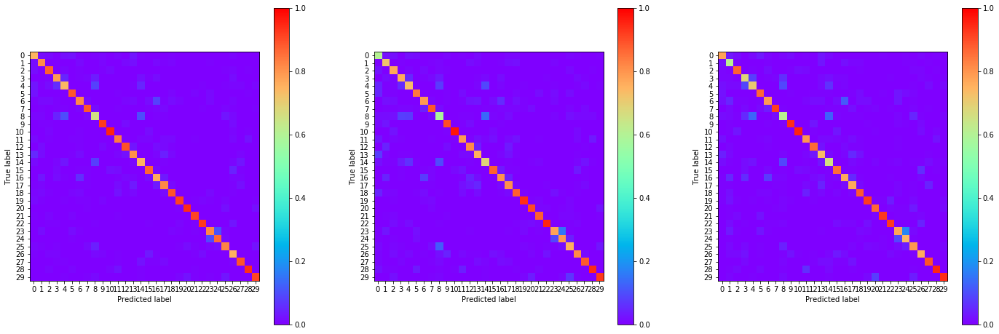

14:54:37.091644
#093 [Train: 0.522] [Test: 0.616] [Valid: 0.599]
#093 [Train: 0.848] [Test: 0.817] [Valid: 0.820]


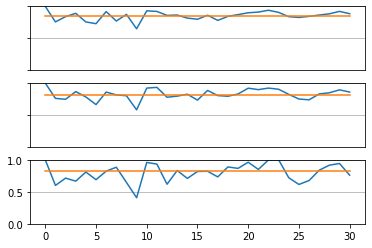

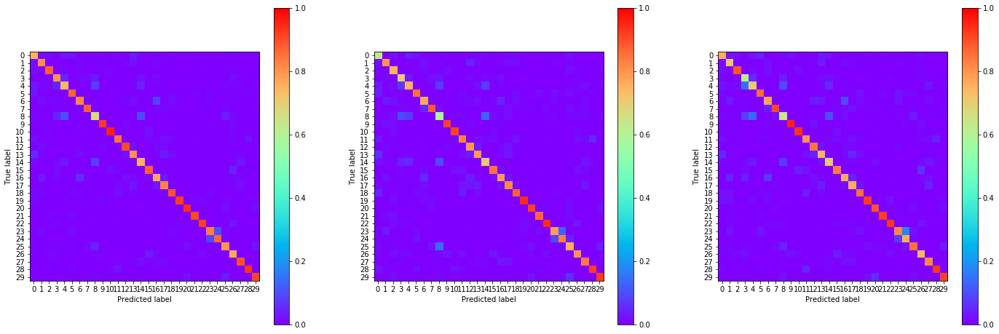

14:55:46.455879
#094 [Train: 0.517] [Test: 0.616] [Valid: 0.596]
#094 [Train: 0.849] [Test: 0.821] [Valid: 0.821]


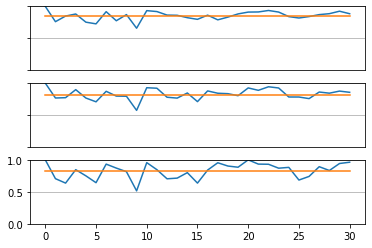

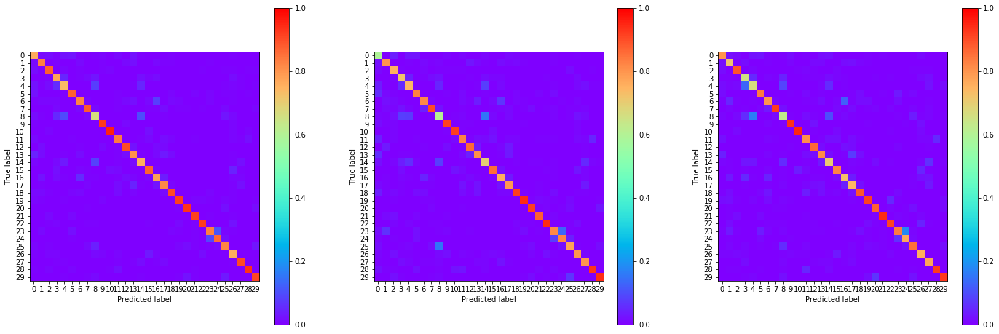

14:56:58.098125
#095 [Train: 0.512] [Test: 0.607] [Valid: 0.593]
#095 [Train: 0.850] [Test: 0.818] [Valid: 0.824]


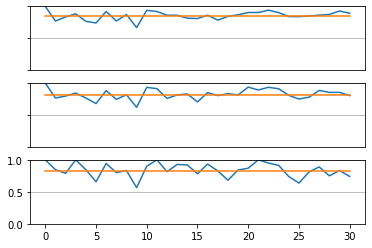

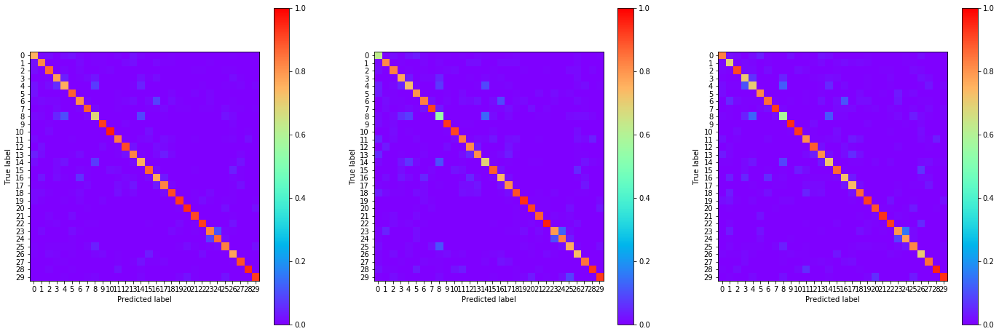

14:58:06.794922
#096 [Train: 0.506] [Test: 0.606] [Valid: 0.580]
#096 [Train: 0.853] [Test: 0.822] [Valid: 0.827]


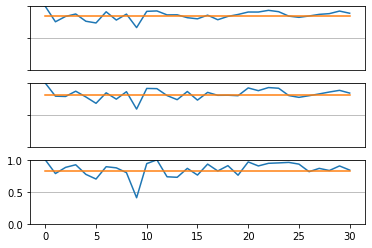

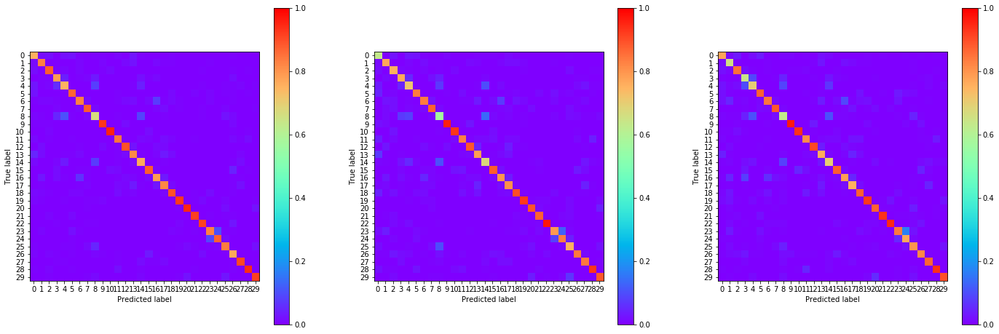

14:59:22.884558
#097 [Train: 0.500] [Test: 0.590] [Valid: 0.576]
#097 [Train: 0.855] [Test: 0.826] [Valid: 0.829]


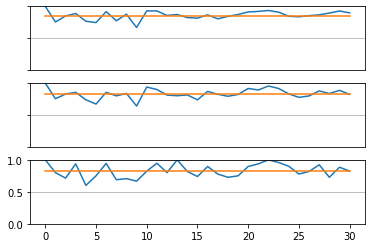

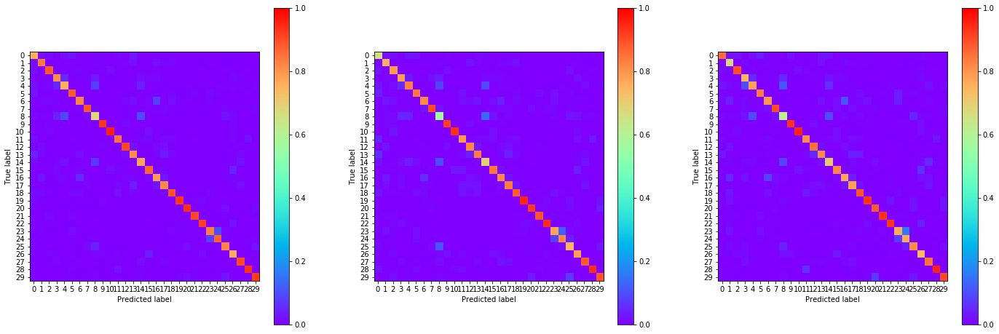

15:00:31.827276
#098 [Train: 0.496] [Test: 0.586] [Valid: 0.570]
#098 [Train: 0.856] [Test: 0.830] [Valid: 0.828]


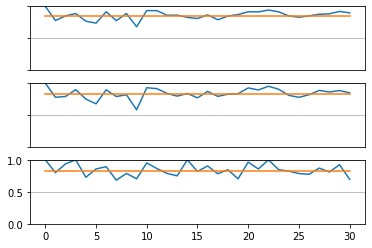

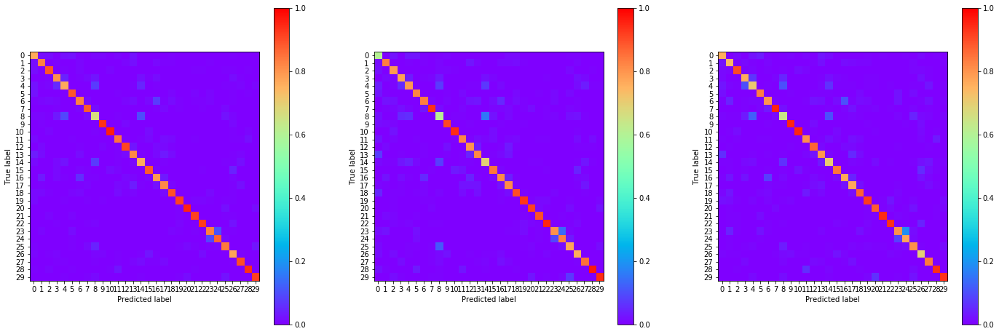

15:01:41.381863
#099 [Train: 0.489] [Test: 0.593] [Valid: 0.572]
#099 [Train: 0.859] [Test: 0.825] [Valid: 0.829]


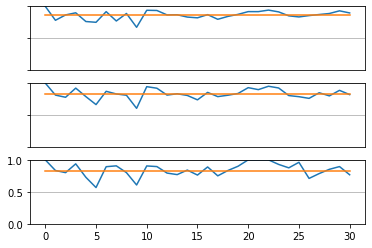

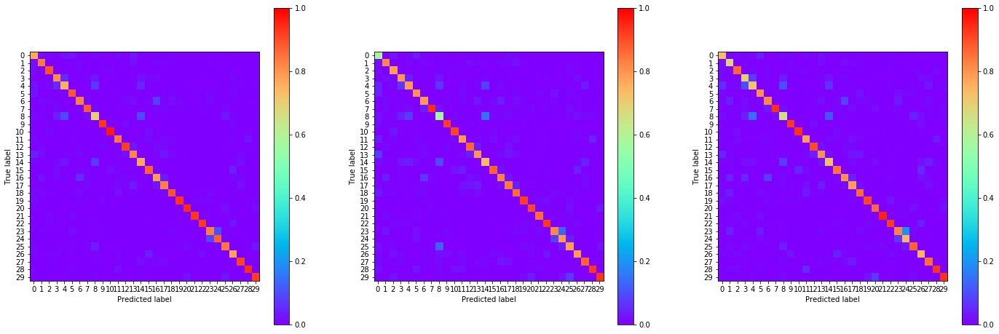

15:02:52.726000
#100 [Train: 0.484] [Test: 0.586] [Valid: 0.568]
#100 [Train: 0.860] [Test: 0.827] [Valid: 0.828]


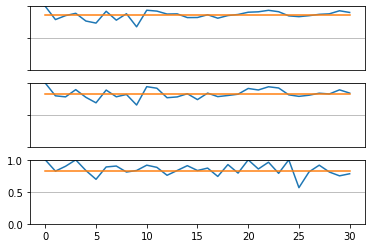

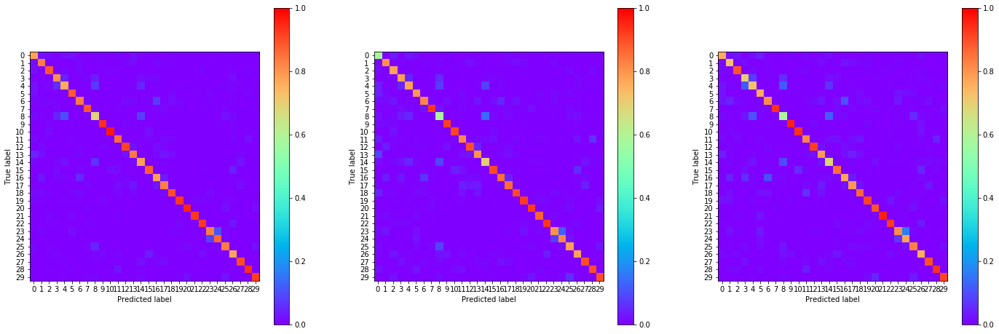

15:04:01.981304
#101 [Train: 0.483] [Test: 0.580] [Valid: 0.563]
#101 [Train: 0.859] [Test: 0.830] [Valid: 0.835]


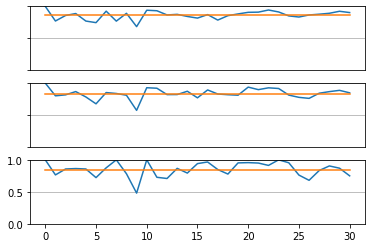

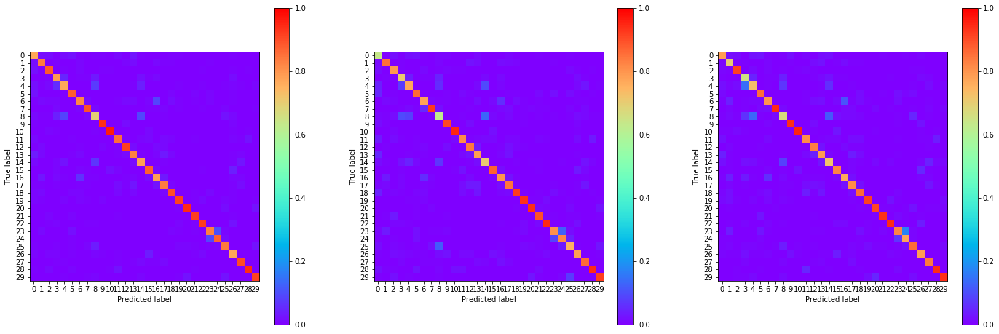

15:05:16.190861
#102 [Train: 0.475] [Test: 0.570] [Valid: 0.551]
#102 [Train: 0.862] [Test: 0.832] [Valid: 0.836]


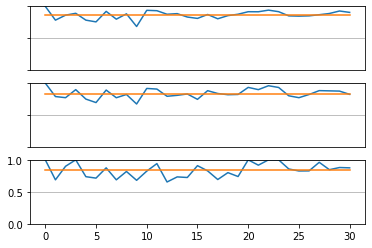

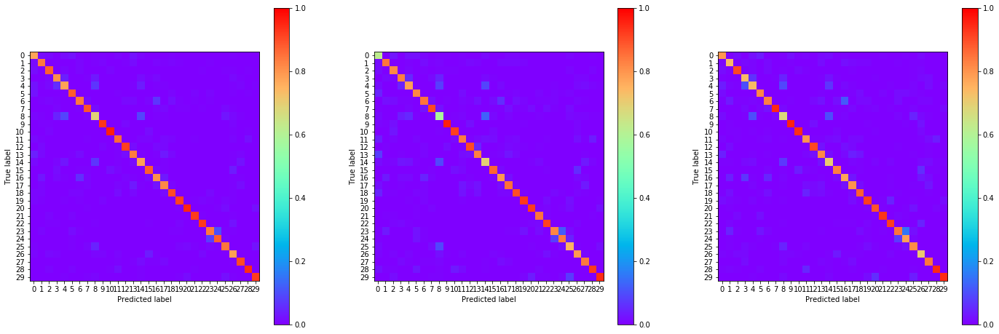

15:06:30.787664
#103 [Train: 0.468] [Test: 0.561] [Valid: 0.549]
#103 [Train: 0.865] [Test: 0.837] [Valid: 0.835]


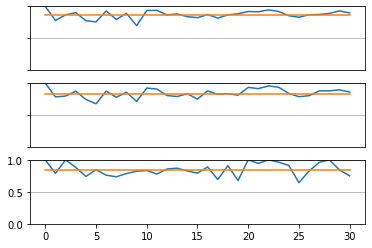

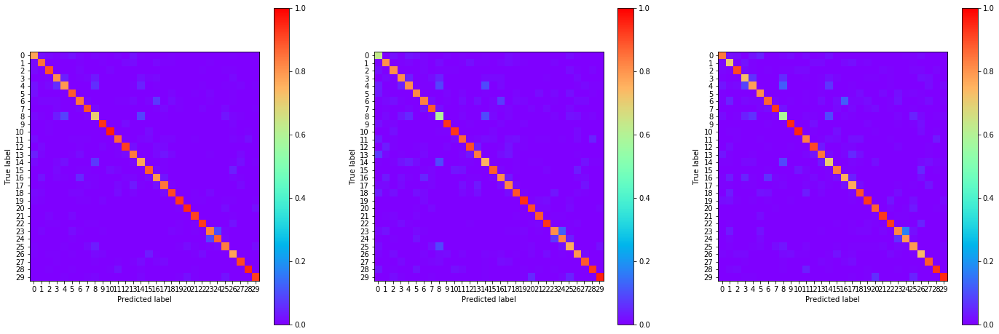

15:07:46.213224
#104 [Train: 0.465] [Test: 0.552] [Valid: 0.542]
#104 [Train: 0.864] [Test: 0.838] [Valid: 0.840]


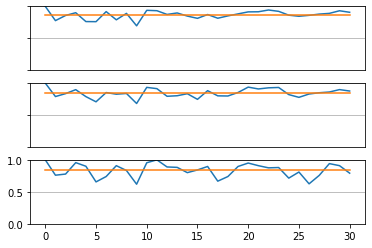

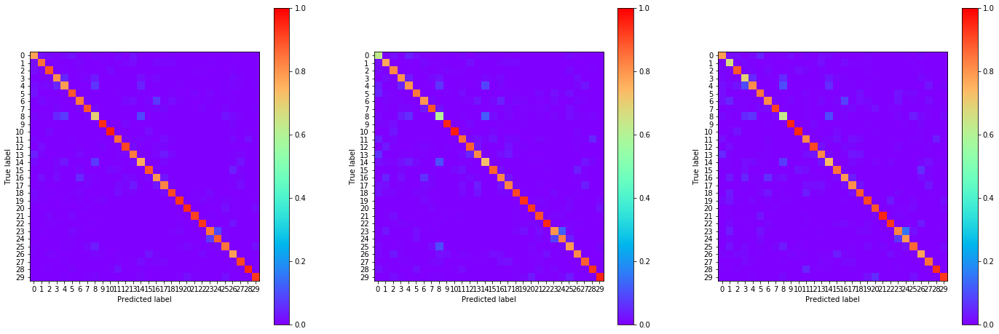

15:08:53.497864
#105 [Train: 0.464] [Test: 0.548] [Valid: 0.539]
#105 [Train: 0.865] [Test: 0.837] [Valid: 0.839]


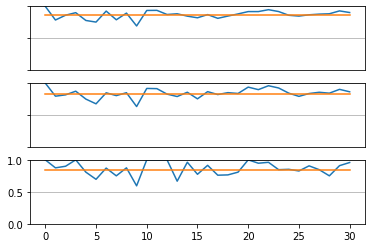

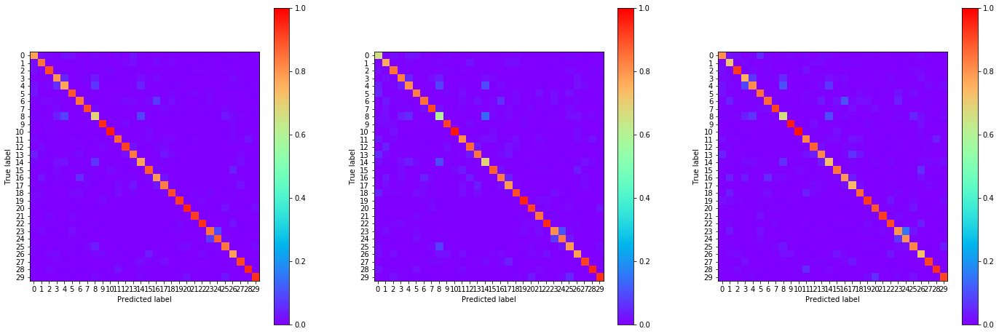

15:10:01.933398
#106 [Train: 0.455] [Test: 0.567] [Valid: 0.546]
#106 [Train: 0.867] [Test: 0.830] [Valid: 0.835]


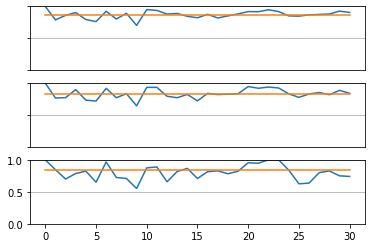

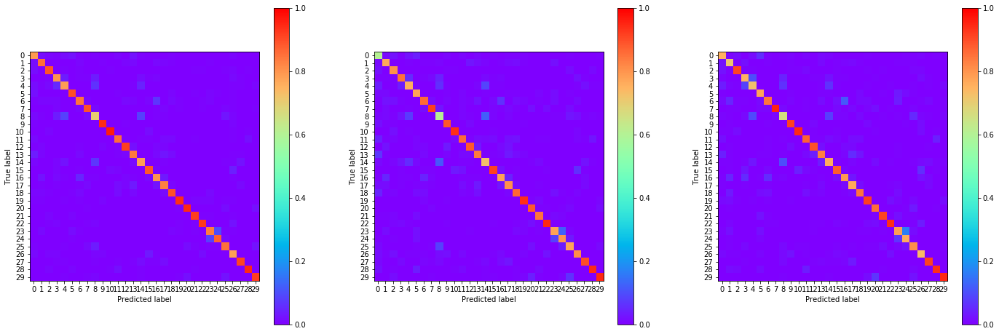

15:11:10.624995
#107 [Train: 0.449] [Test: 0.560] [Valid: 0.540]
#107 [Train: 0.868] [Test: 0.836] [Valid: 0.838]


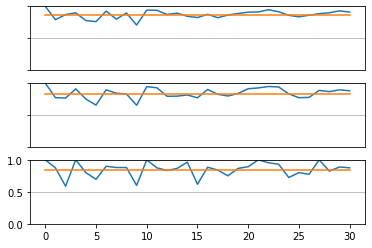

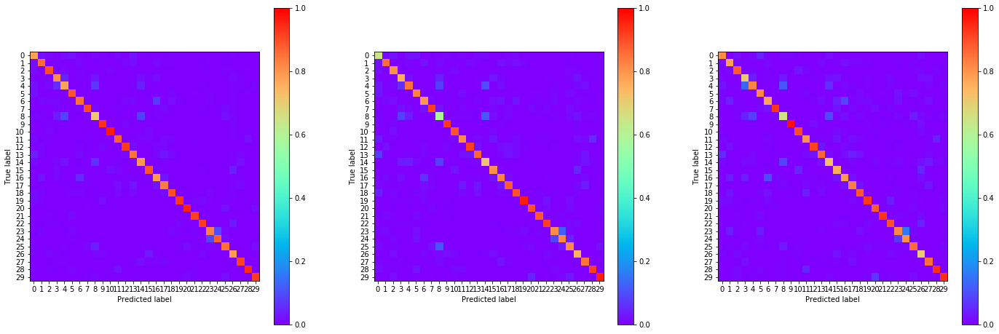

15:12:19.930498
#108 [Train: 0.447] [Test: 0.541] [Valid: 0.533]
#108 [Train: 0.869] [Test: 0.846] [Valid: 0.841]


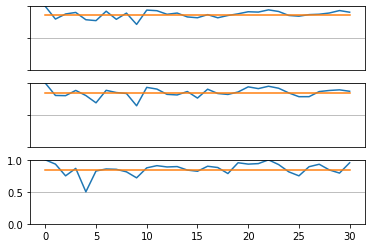

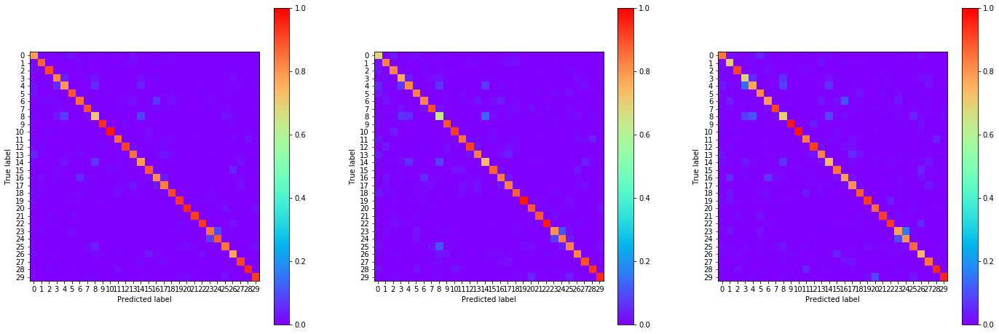

15:13:27.510788
#109 [Train: 0.443] [Test: 0.545] [Valid: 0.527]
#109 [Train: 0.870] [Test: 0.839] [Valid: 0.842]


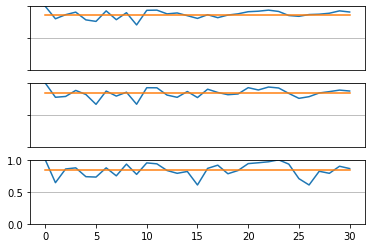

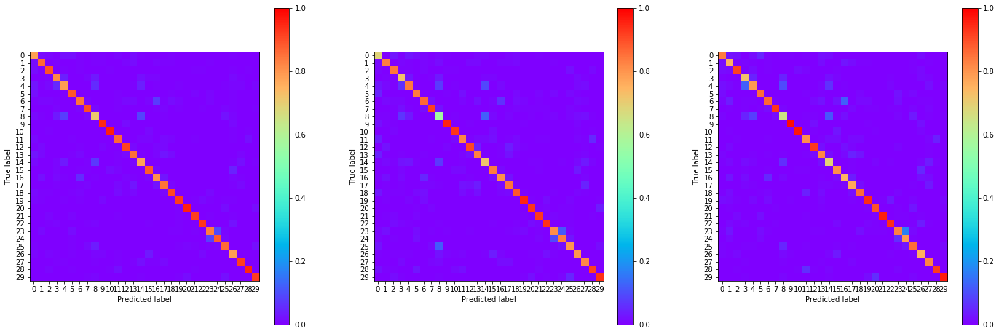

15:14:35.450098
#110 [Train: 0.434] [Test: 0.536] [Valid: 0.529]
#110 [Train: 0.873] [Test: 0.843] [Valid: 0.843]


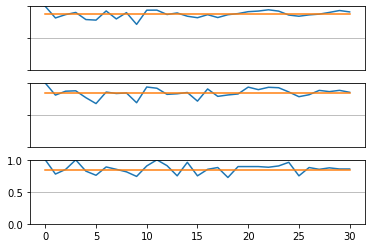

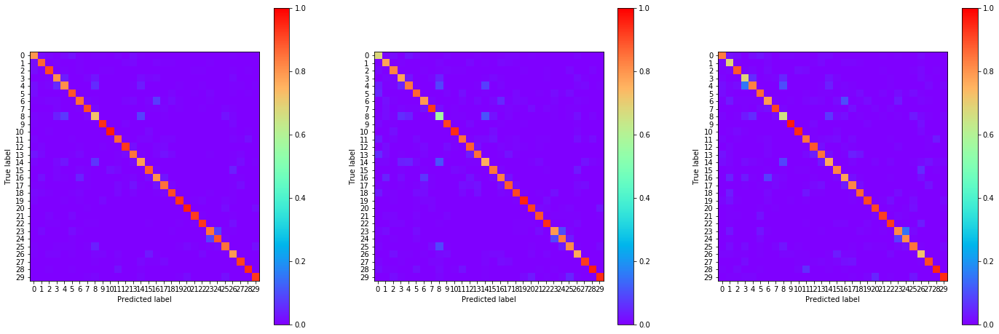

15:15:44.653454
#111 [Train: 0.432] [Test: 0.535] [Valid: 0.522]
#111 [Train: 0.874] [Test: 0.847] [Valid: 0.845]


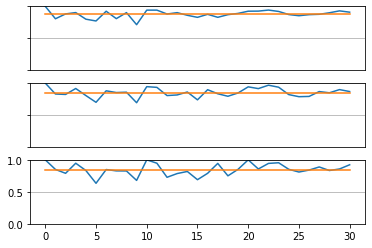

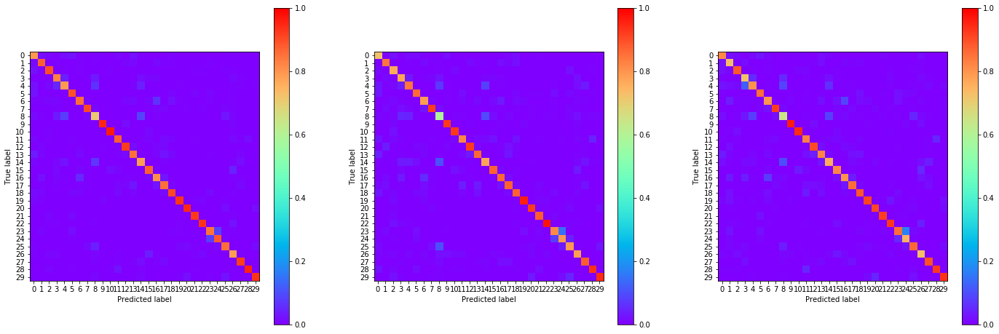

15:16:54.051812
#112 [Train: 0.428] [Test: 0.535] [Valid: 0.528]
#112 [Train: 0.875] [Test: 0.842] [Valid: 0.842]


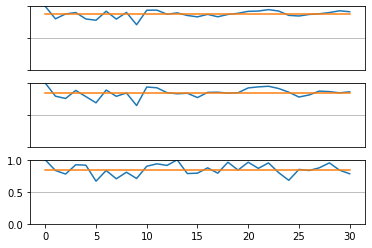

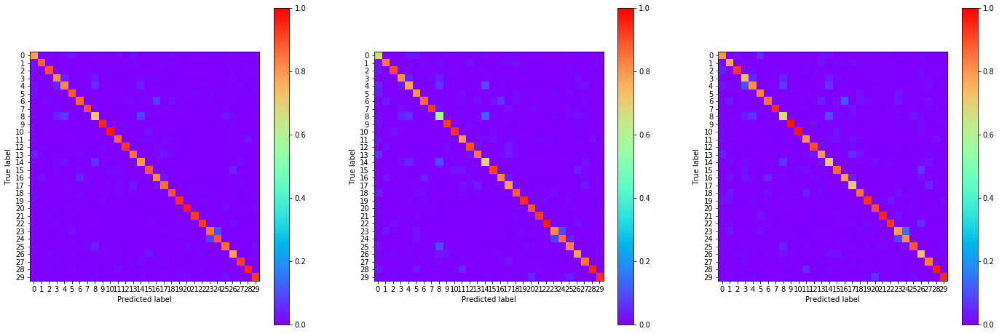

15:18:02.301261
#113 [Train: 0.426] [Test: 0.527] [Valid: 0.515]
#113 [Train: 0.875] [Test: 0.848] [Valid: 0.847]


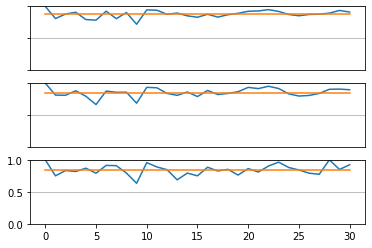

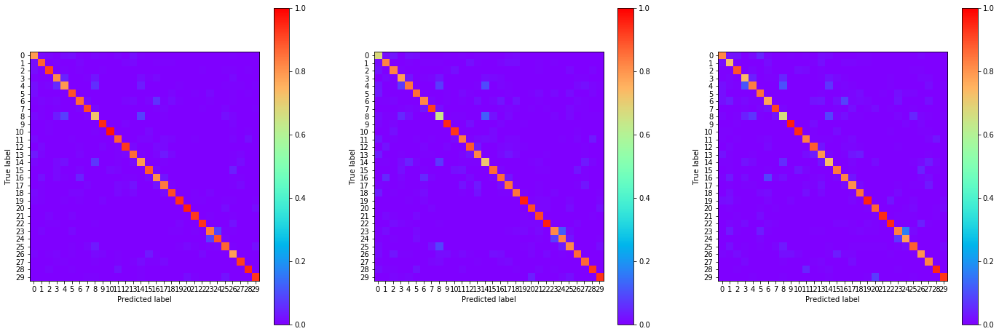

15:19:10.748546
#114 [Train: 0.422] [Test: 0.536] [Valid: 0.518]
#114 [Train: 0.877] [Test: 0.847] [Valid: 0.843]


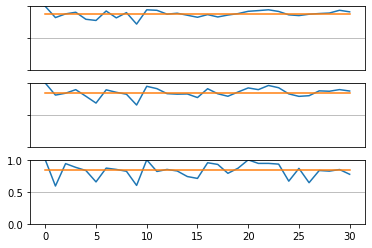

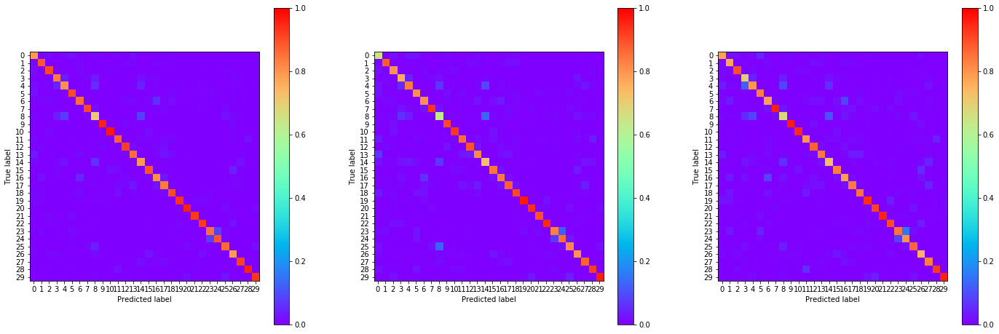

15:20:19.521561
#115 [Train: 0.418] [Test: 0.514] [Valid: 0.507]
#115 [Train: 0.878] [Test: 0.850] [Valid: 0.853]


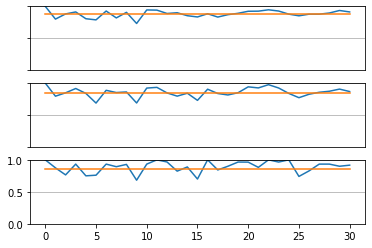

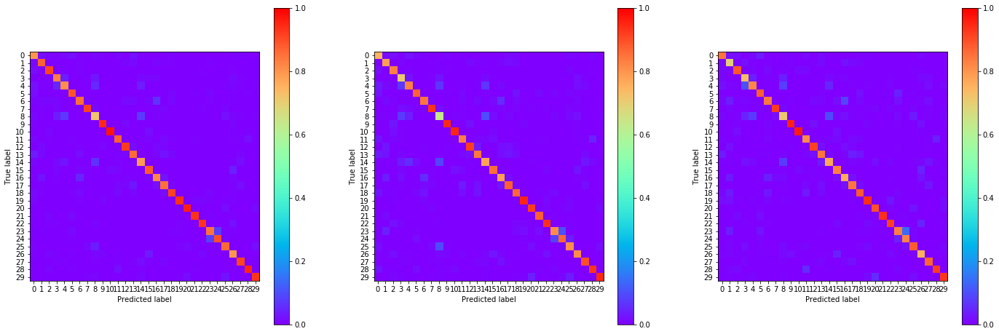

15:21:28.200110
#116 [Train: 0.410] [Test: 0.519] [Valid: 0.499]
#116 [Train: 0.880] [Test: 0.851] [Valid: 0.850]


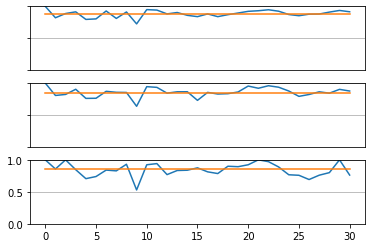

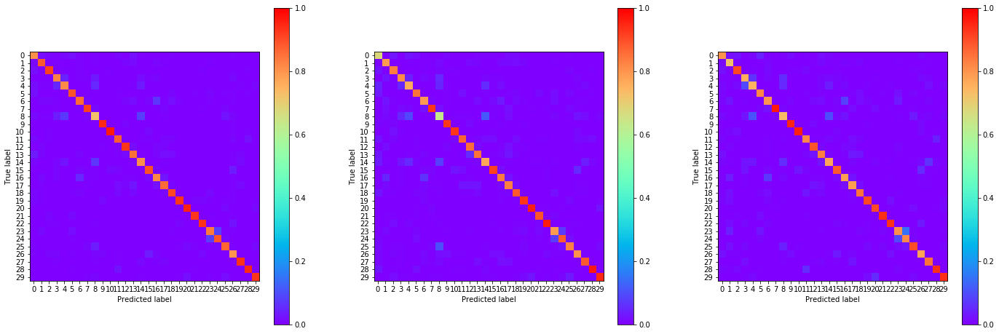

15:22:37.997100
#117 [Train: 0.409] [Test: 0.527] [Valid: 0.506]
#117 [Train: 0.881] [Test: 0.847] [Valid: 0.847]


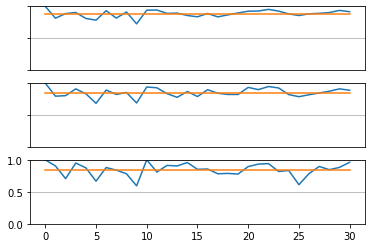

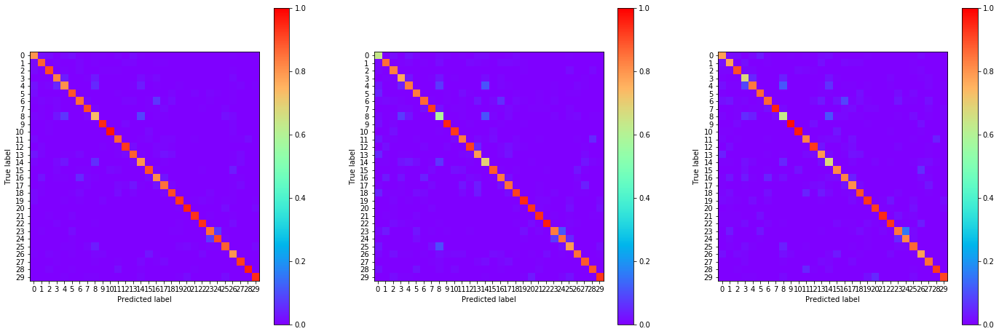

15:23:45.841113
#118 [Train: 0.406] [Test: 0.525] [Valid: 0.502]
#118 [Train: 0.882] [Test: 0.844] [Valid: 0.848]


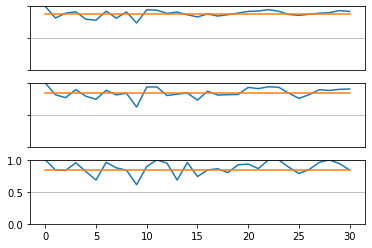

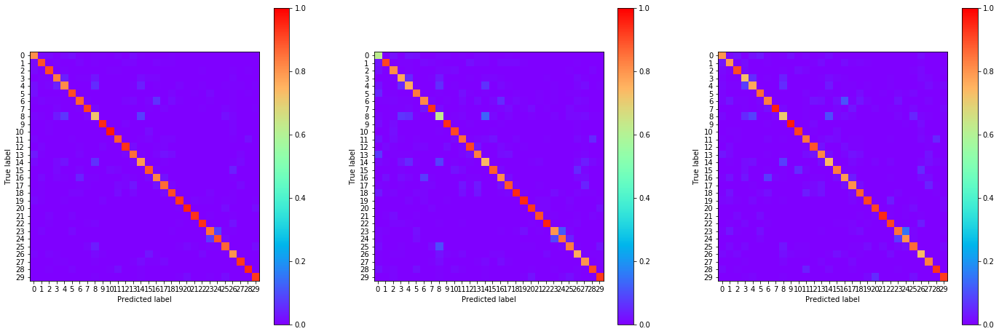

15:24:55.053831
#119 [Train: 0.404] [Test: 0.510] [Valid: 0.510]
#119 [Train: 0.882] [Test: 0.851] [Valid: 0.851]


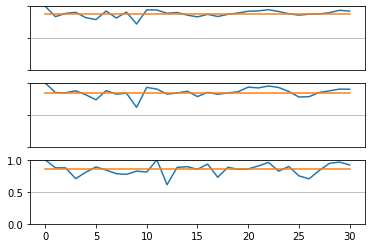

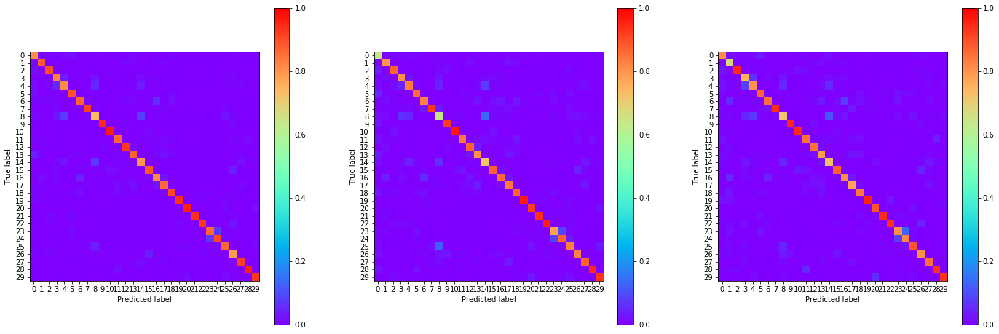

15:26:04.934589
#120 [Train: 0.399] [Test: 0.513] [Valid: 0.490]
#120 [Train: 0.884] [Test: 0.851] [Valid: 0.853]


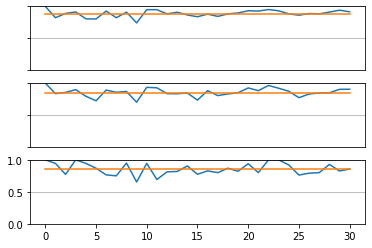

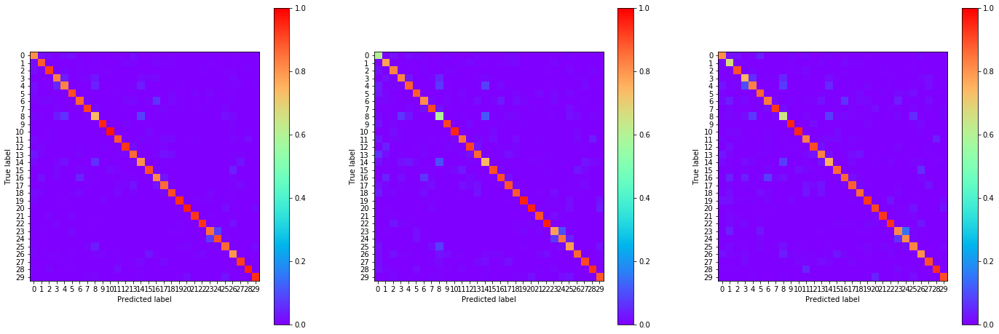

15:27:13.897353
#121 [Train: 0.395] [Test: 0.502] [Valid: 0.487]
#121 [Train: 0.884] [Test: 0.855] [Valid: 0.857]


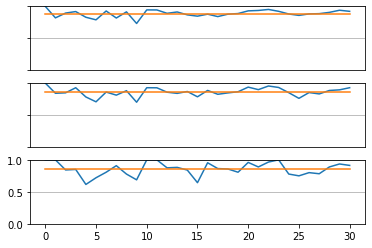

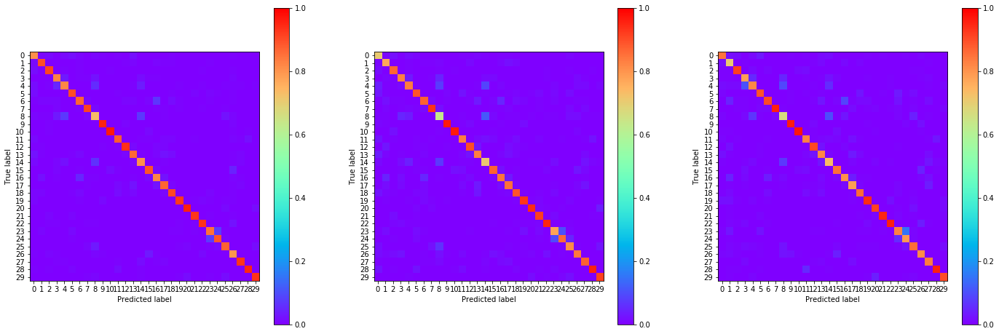

15:28:23.616198
#122 [Train: 0.388] [Test: 0.503] [Valid: 0.490]
#122 [Train: 0.887] [Test: 0.852] [Valid: 0.853]


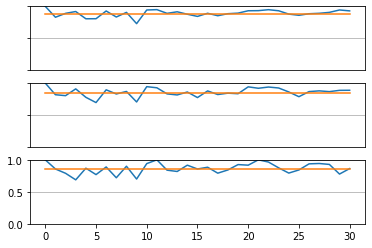

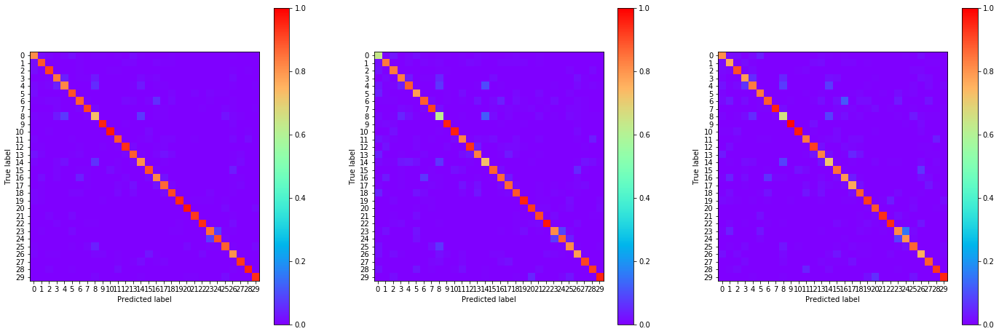

15:29:31.098964
#123 [Train: 0.390] [Test: 0.513] [Valid: 0.486]
#123 [Train: 0.886] [Test: 0.848] [Valid: 0.855]


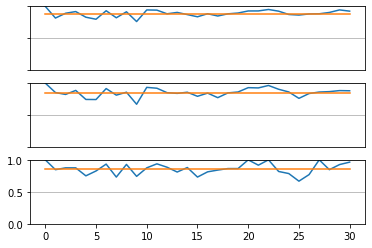

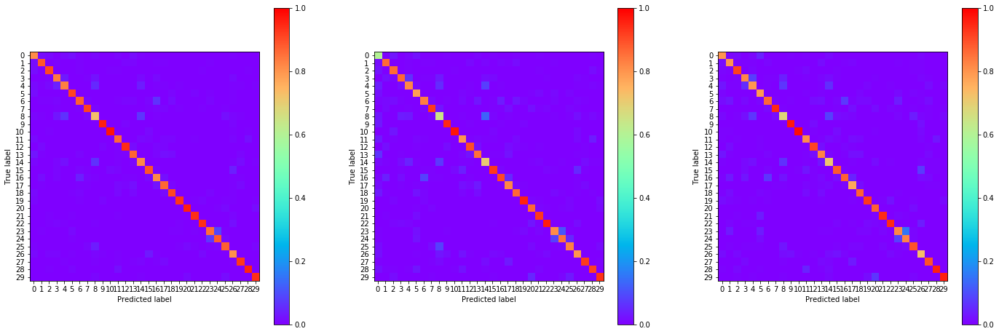

15:30:40.308099
#124 [Train: 0.383] [Test: 0.503] [Valid: 0.493]
#124 [Train: 0.889] [Test: 0.851] [Valid: 0.852]


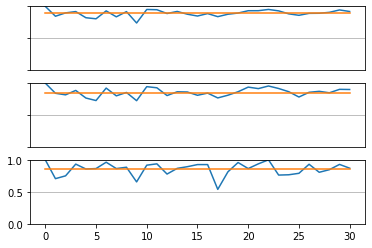

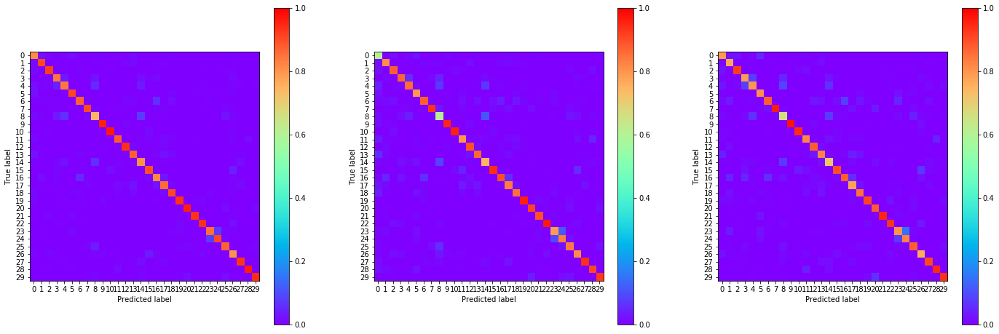

15:31:50.265586
#125 [Train: 0.384] [Test: 0.495] [Valid: 0.484]
#125 [Train: 0.887] [Test: 0.859] [Valid: 0.856]


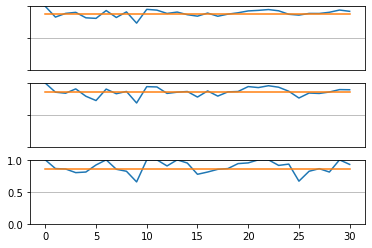

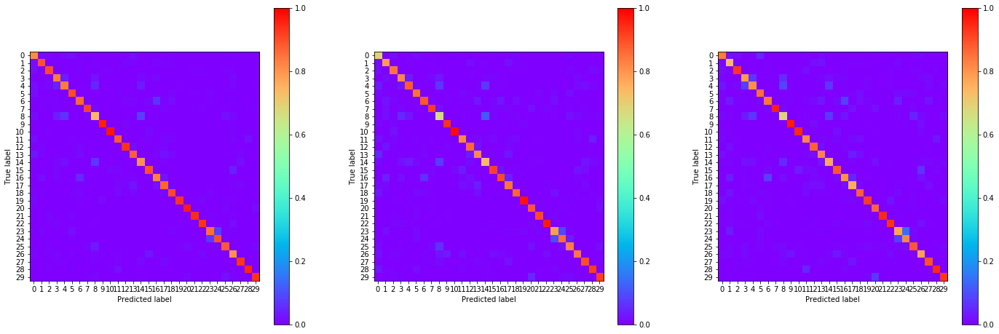

15:32:58.611645
#126 [Train: 0.377] [Test: 0.492] [Valid: 0.489]
#126 [Train: 0.889] [Test: 0.856] [Valid: 0.859]


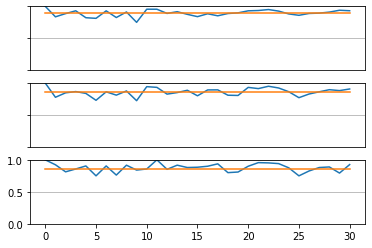

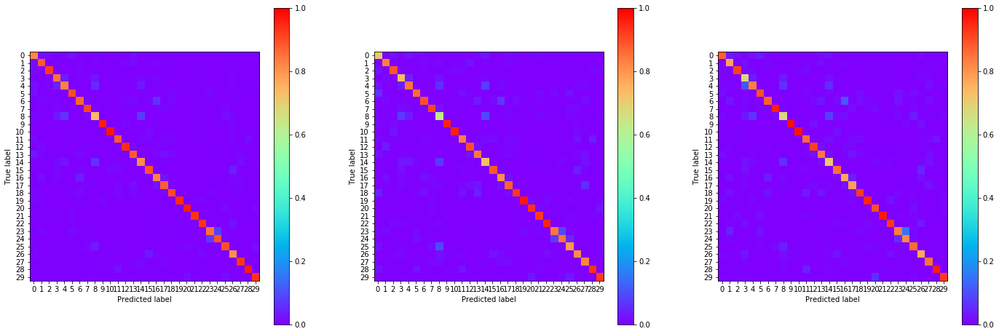

15:34:09.051990
#127 [Train: 0.375] [Test: 0.485] [Valid: 0.480]
#127 [Train: 0.889] [Test: 0.860] [Valid: 0.857]


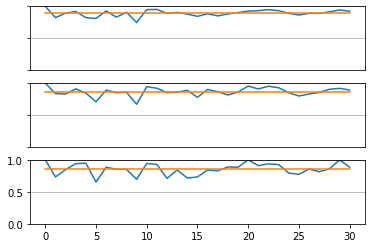

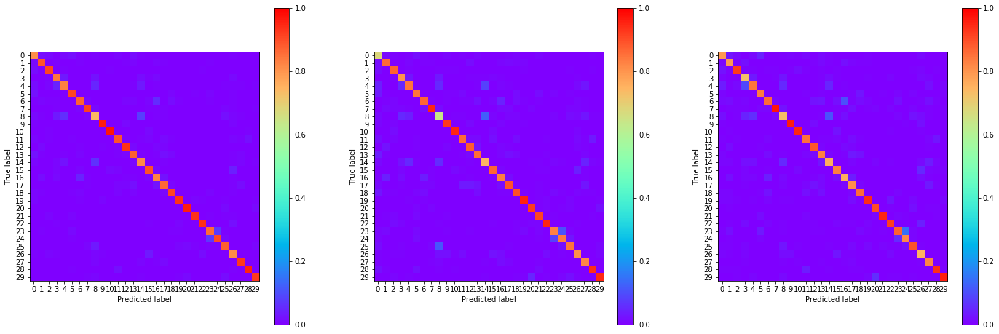

15:35:17.028401
#128 [Train: 0.368] [Test: 0.485] [Valid: 0.470]
#128 [Train: 0.891] [Test: 0.858] [Valid: 0.863]


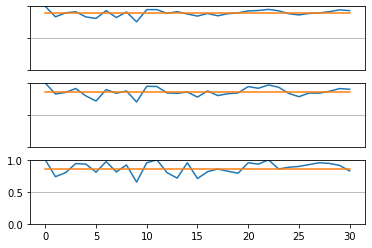

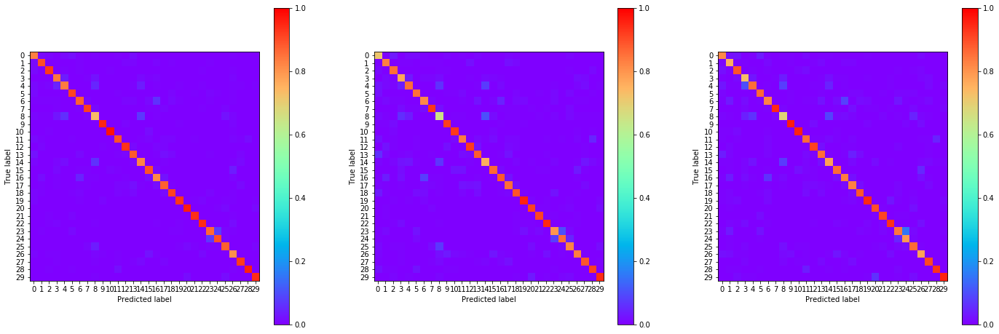

15:36:26.301155
#129 [Train: 0.366] [Test: 0.477] [Valid: 0.474]
#129 [Train: 0.893] [Test: 0.862] [Valid: 0.860]


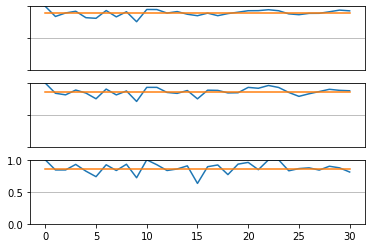

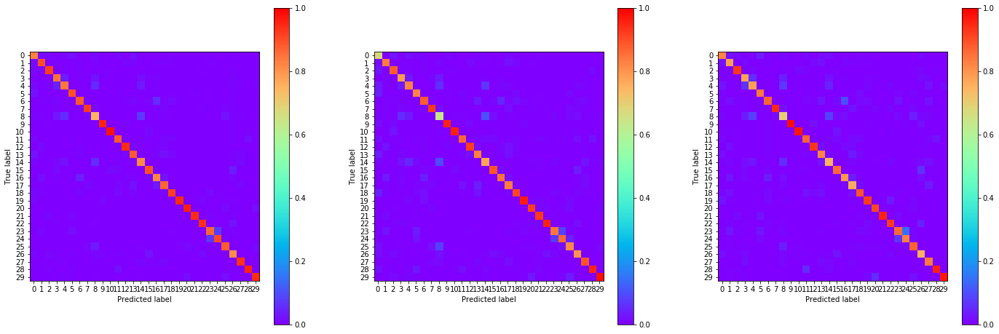

15:37:34.803566
#130 [Train: 0.364] [Test: 0.502] [Valid: 0.480]
#130 [Train: 0.894] [Test: 0.851] [Valid: 0.856]


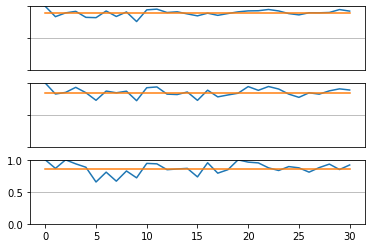

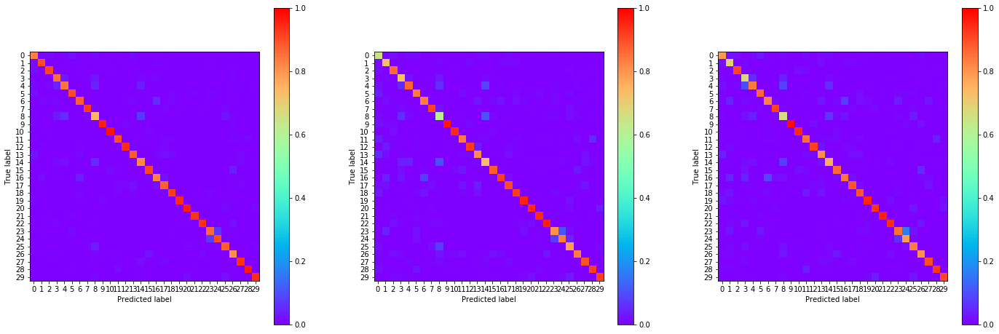

15:38:43.822200
#131 [Train: 0.365] [Test: 0.472] [Valid: 0.470]
#131 [Train: 0.893] [Test: 0.864] [Valid: 0.863]


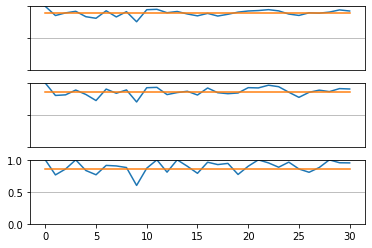

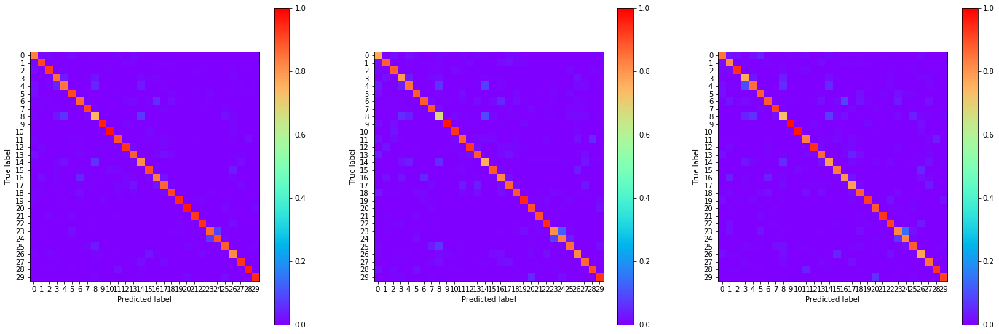

15:39:54.480447
#132 [Train: 0.357] [Test: 0.486] [Valid: 0.467]
#132 [Train: 0.895] [Test: 0.862] [Valid: 0.862]


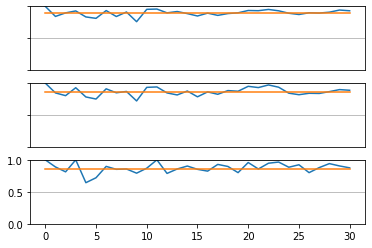

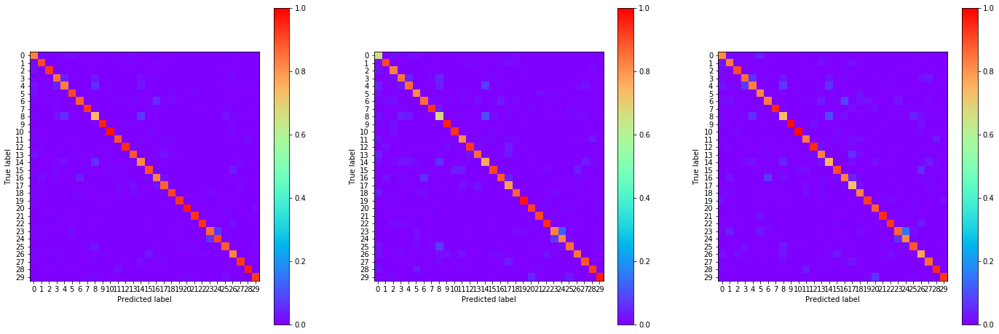

15:41:02.521544
#133 [Train: 0.355] [Test: 0.479] [Valid: 0.465]
#133 [Train: 0.895] [Test: 0.865] [Valid: 0.861]


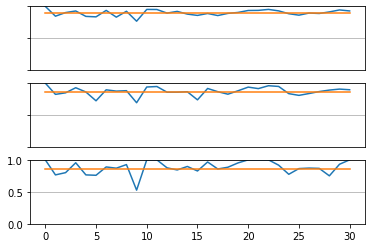

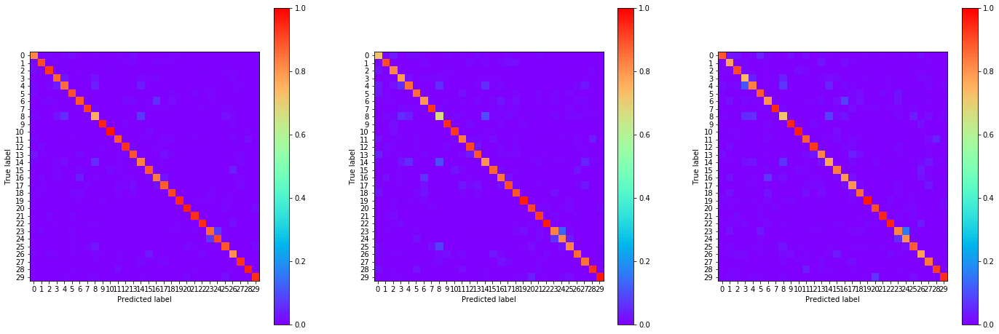

15:42:12.773466
#134 [Train: 0.349] [Test: 0.474] [Valid: 0.463]
#134 [Train: 0.897] [Test: 0.865] [Valid: 0.864]


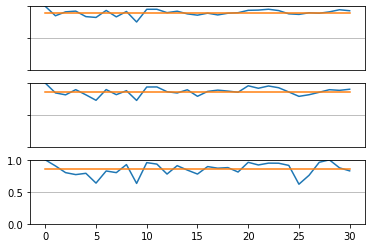

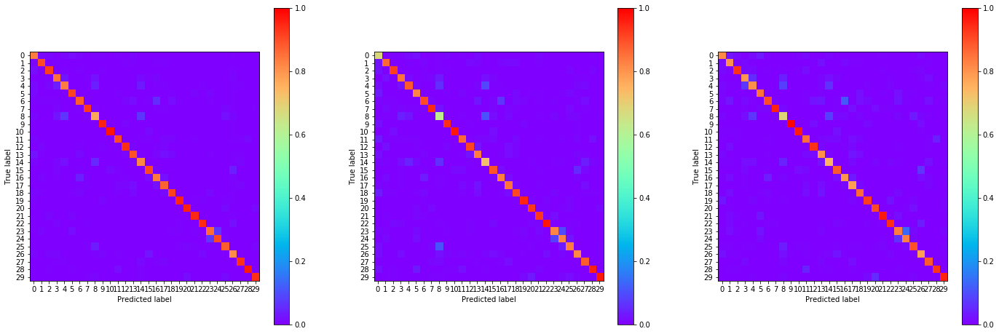

15:43:20.986796
#135 [Train: 0.352] [Test: 0.463] [Valid: 0.459]
#135 [Train: 0.896] [Test: 0.869] [Valid: 0.865]


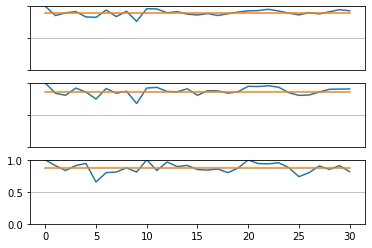

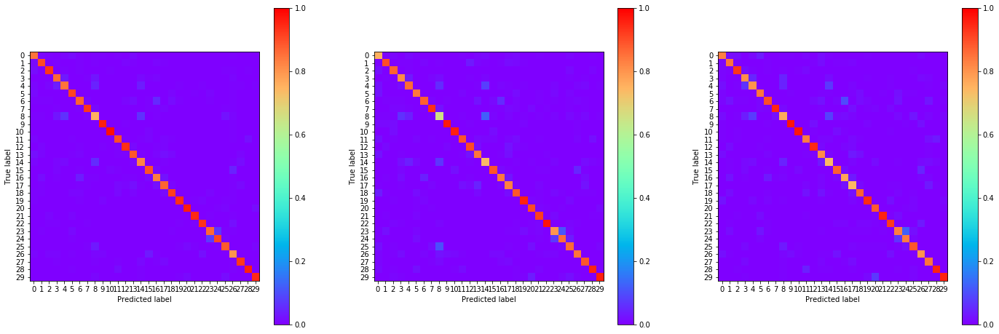

15:44:30.239972
#136 [Train: 0.347] [Test: 0.467] [Valid: 0.449]
#136 [Train: 0.899] [Test: 0.867] [Valid: 0.868]


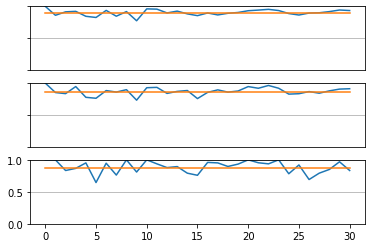

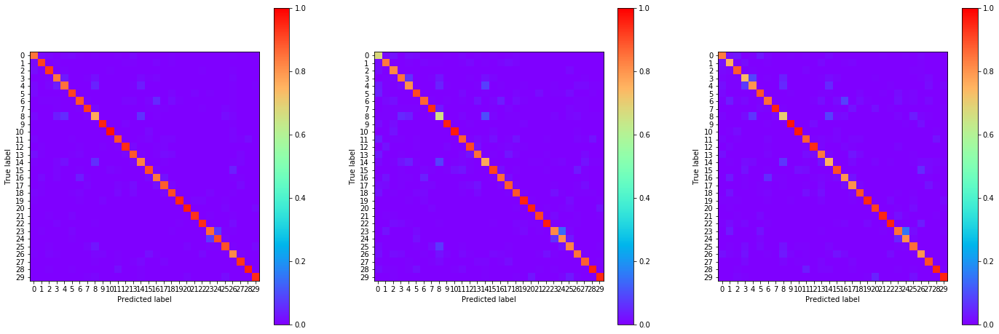

15:45:38.704574
#137 [Train: 0.347] [Test: 0.459] [Valid: 0.454]
#137 [Train: 0.898] [Test: 0.868] [Valid: 0.864]


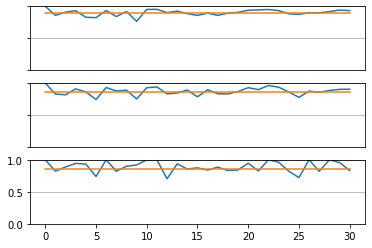

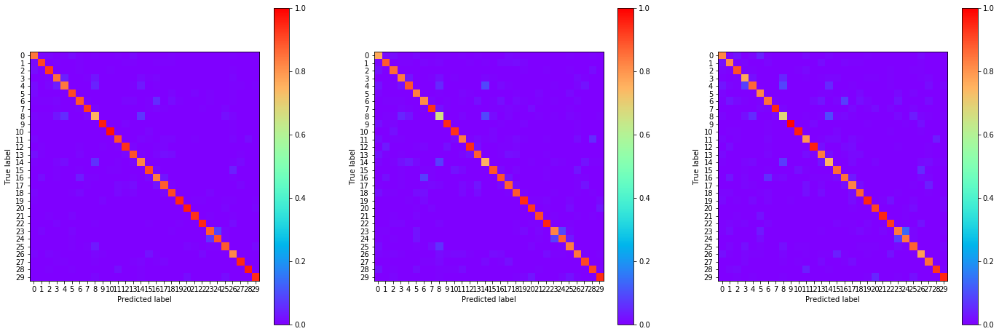

15:46:49.198527
#138 [Train: 0.344] [Test: 0.469] [Valid: 0.449]
#138 [Train: 0.900] [Test: 0.867] [Valid: 0.863]


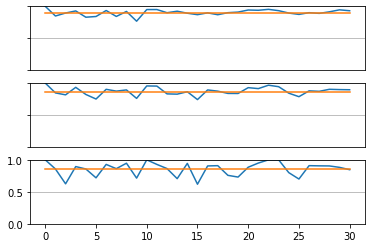

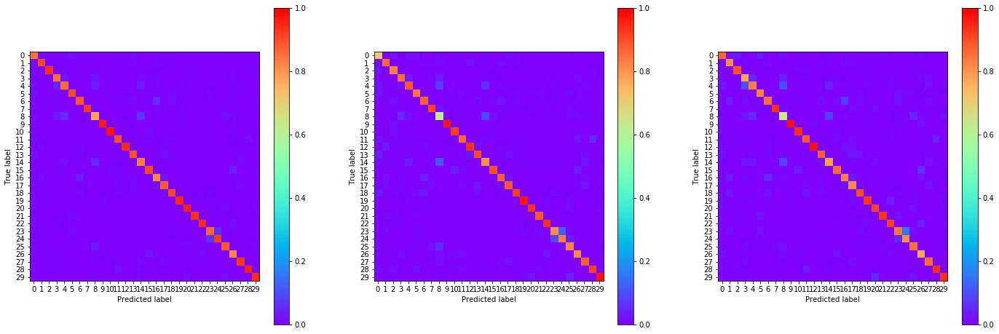

15:47:58.512840
#139 [Train: 0.337] [Test: 0.469] [Valid: 0.456]
#139 [Train: 0.901] [Test: 0.860] [Valid: 0.862]


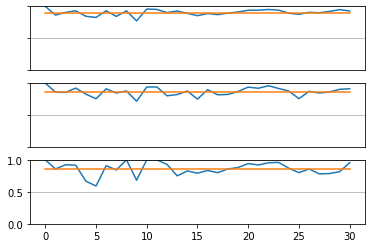

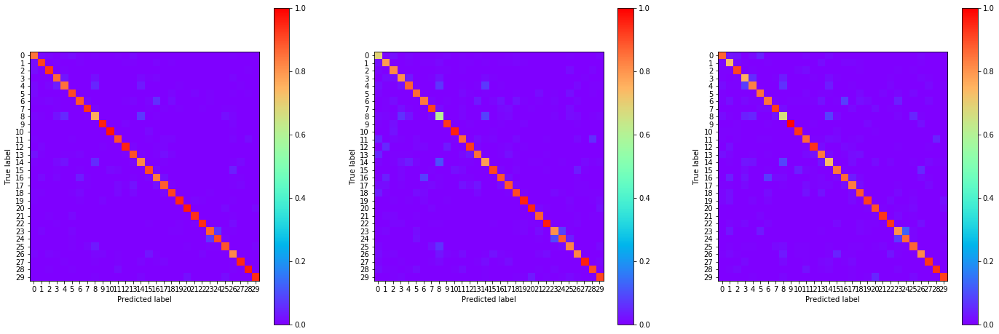

15:49:08.439317
#140 [Train: 0.338] [Test: 0.476] [Valid: 0.460]
#140 [Train: 0.901] [Test: 0.859] [Valid: 0.860]


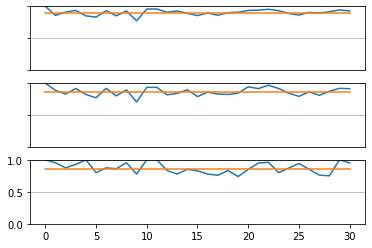

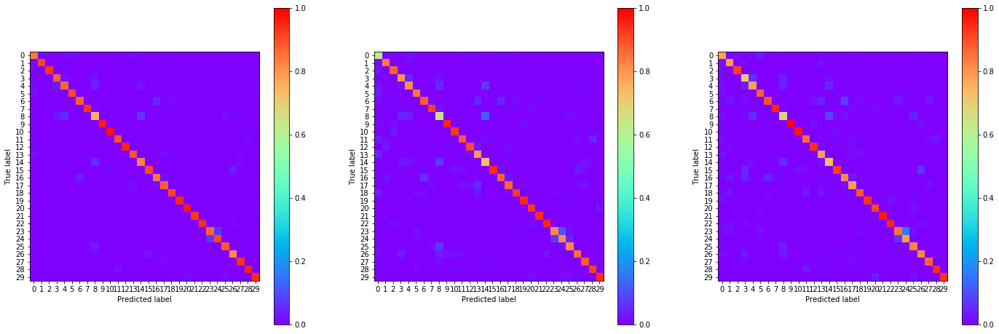

15:50:19.551964
#141 [Train: 0.339] [Test: 0.456] [Valid: 0.456]
#141 [Train: 0.900] [Test: 0.866] [Valid: 0.864]


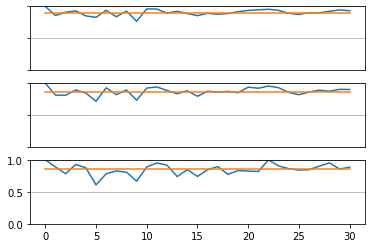

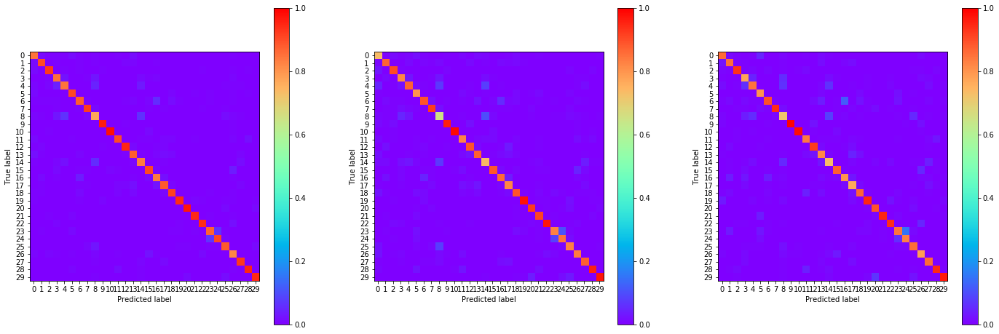

15:51:27.868592
#142 [Train: 0.332] [Test: 0.460] [Valid: 0.445]
#142 [Train: 0.902] [Test: 0.866] [Valid: 0.865]


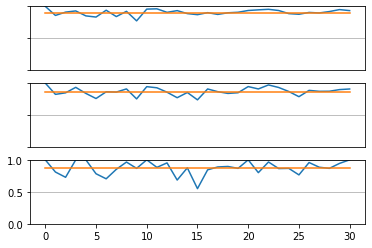

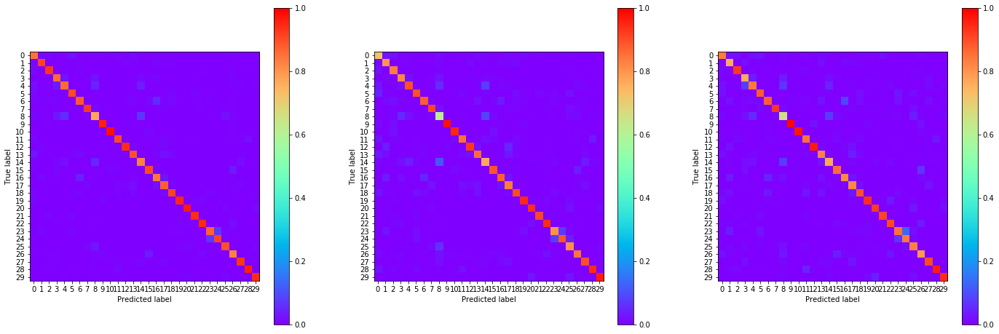

15:52:38.137935
#143 [Train: 0.331] [Test: 0.449] [Valid: 0.439]
#143 [Train: 0.904] [Test: 0.869] [Valid: 0.866]


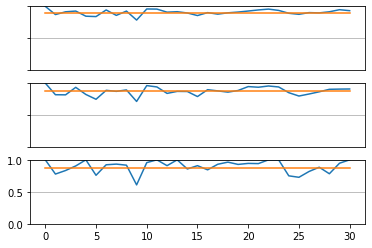

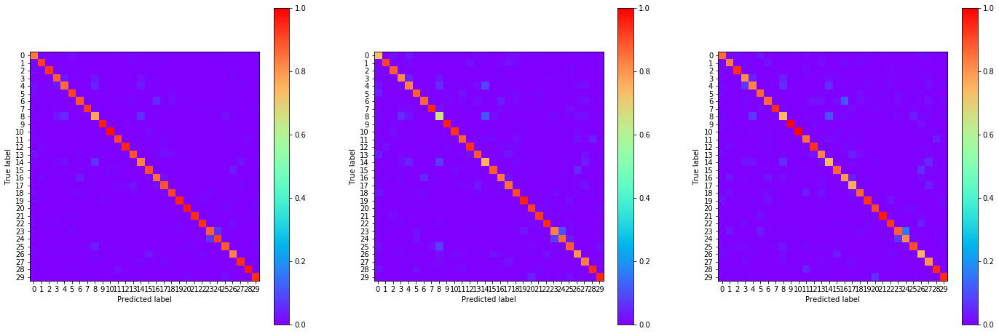

15:53:46.946281
#144 [Train: 0.328] [Test: 0.459] [Valid: 0.436]
#144 [Train: 0.904] [Test: 0.869] [Valid: 0.870]


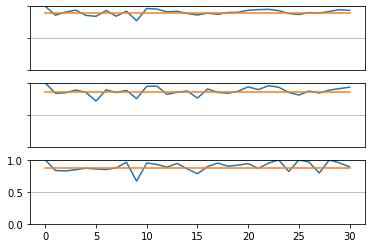

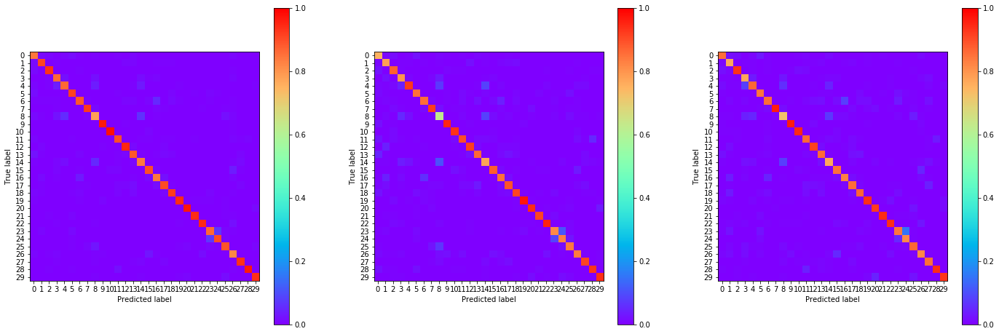

15:54:56.226501
#145 [Train: 0.325] [Test: 0.439] [Valid: 0.430]
#145 [Train: 0.905] [Test: 0.872] [Valid: 0.871]


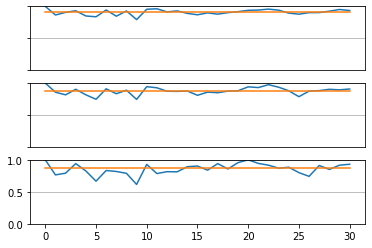

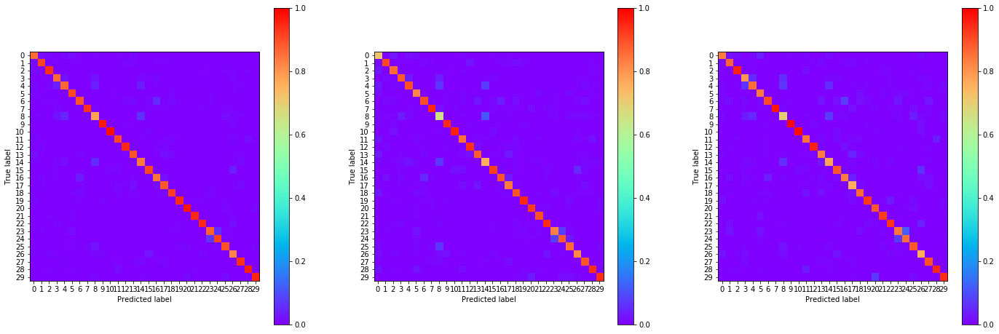

15:56:07.687282
#146 [Train: 0.324] [Test: 0.435] [Valid: 0.426]
#146 [Train: 0.905] [Test: 0.877] [Valid: 0.872]


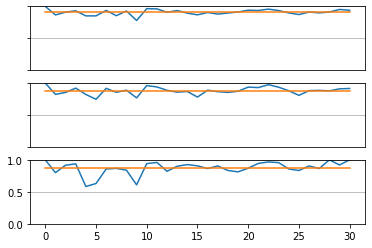

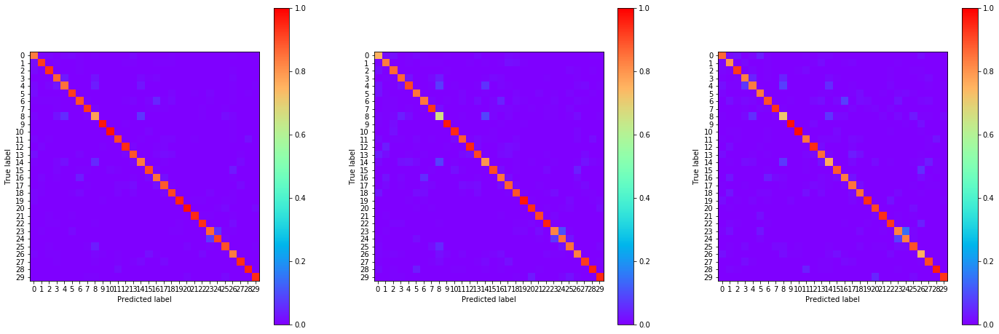

15:57:15.485296
#147 [Train: 0.322] [Test: 0.448] [Valid: 0.428]
#147 [Train: 0.906] [Test: 0.871] [Valid: 0.872]


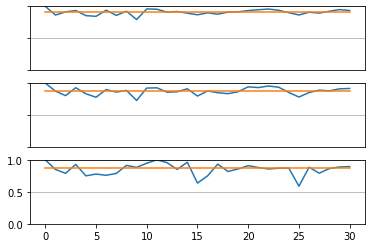

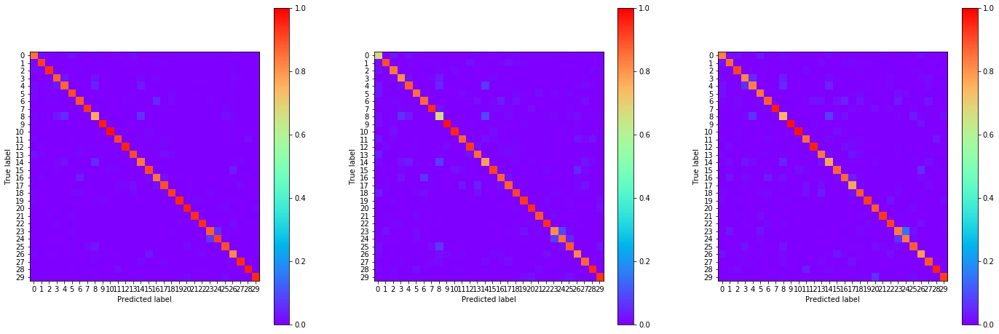

15:58:24.579498
#148 [Train: 0.317] [Test: 0.434] [Valid: 0.427]
#148 [Train: 0.907] [Test: 0.876] [Valid: 0.871]


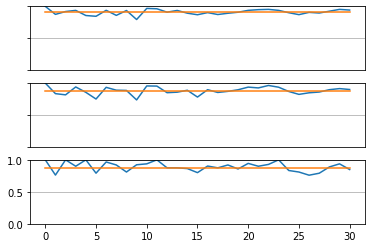

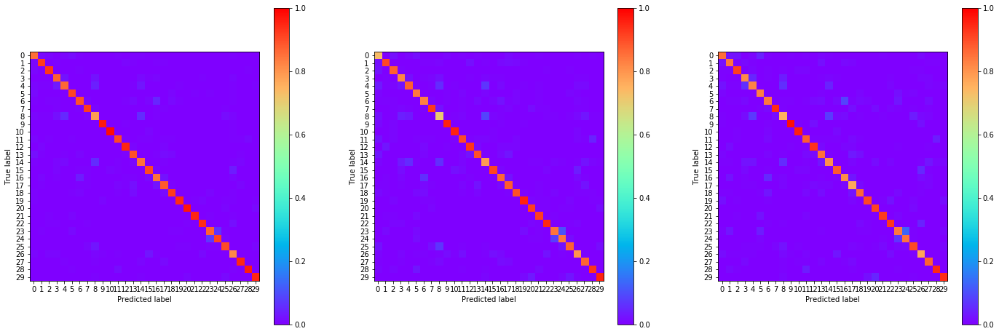

15:59:33.884494
#149 [Train: 0.322] [Test: 0.446] [Valid: 0.445]
#149 [Train: 0.905] [Test: 0.873] [Valid: 0.866]


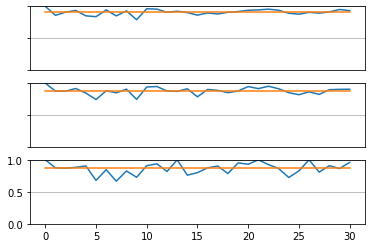

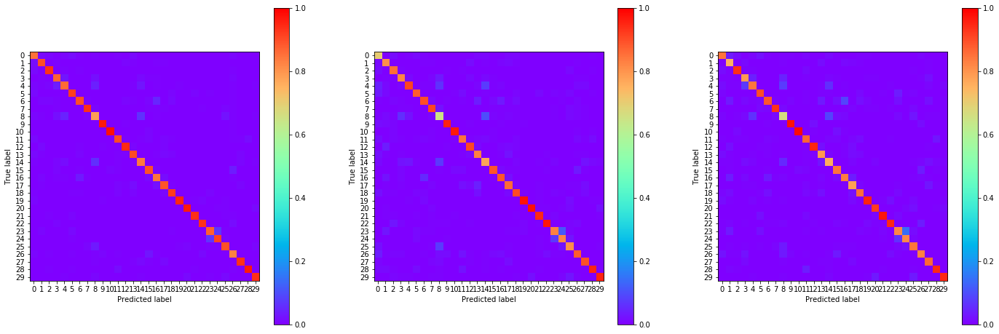

16:00:43.162339
#150 [Train: 0.313] [Test: 0.438] [Valid: 0.431]
#150 [Train: 0.908] [Test: 0.873] [Valid: 0.871]


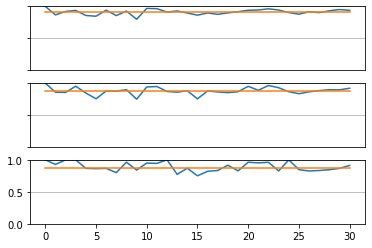

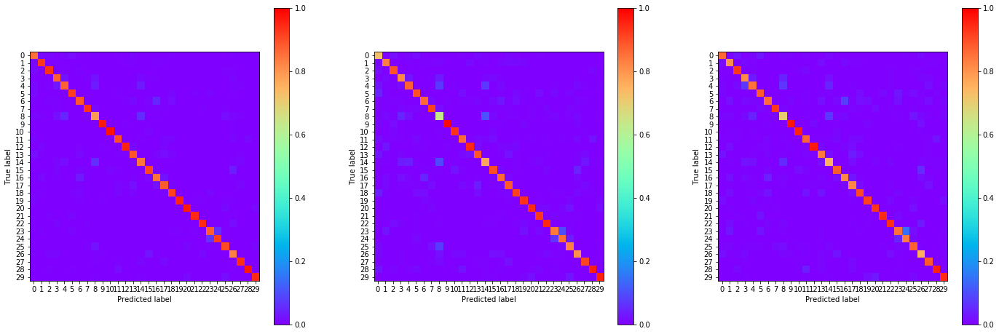

16:01:53.570845
#151 [Train: 0.310] [Test: 0.430] [Valid: 0.430]
#151 [Train: 0.908] [Test: 0.875] [Valid: 0.872]


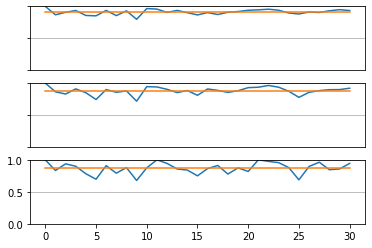

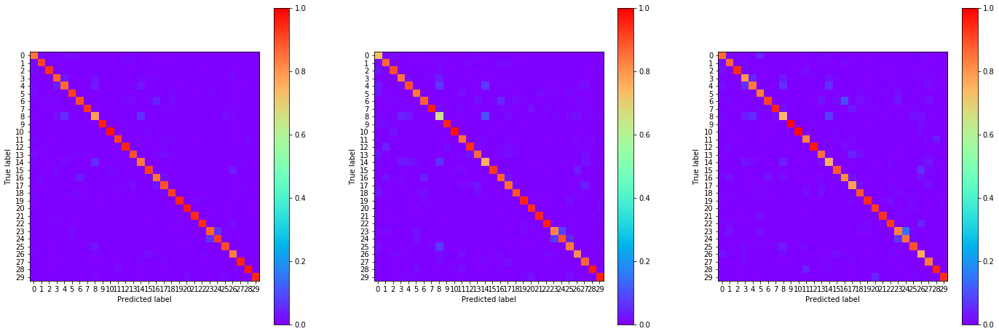

16:03:02.249308
#152 [Train: 0.312] [Test: 0.430] [Valid: 0.425]
#152 [Train: 0.908] [Test: 0.877] [Valid: 0.875]


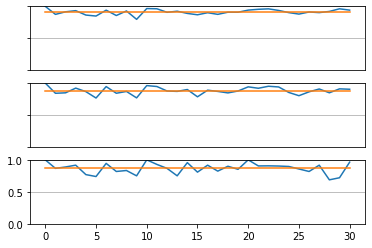

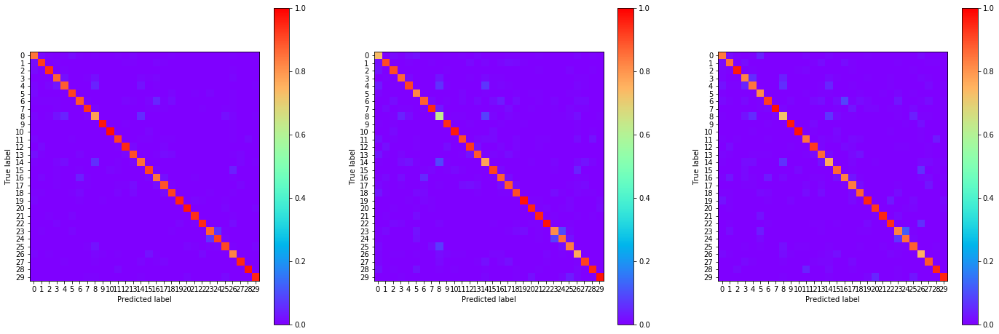

16:04:11.946371
#153 [Train: 0.308] [Test: 0.460] [Valid: 0.451]
#153 [Train: 0.910] [Test: 0.869] [Valid: 0.868]


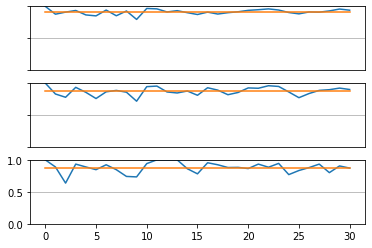

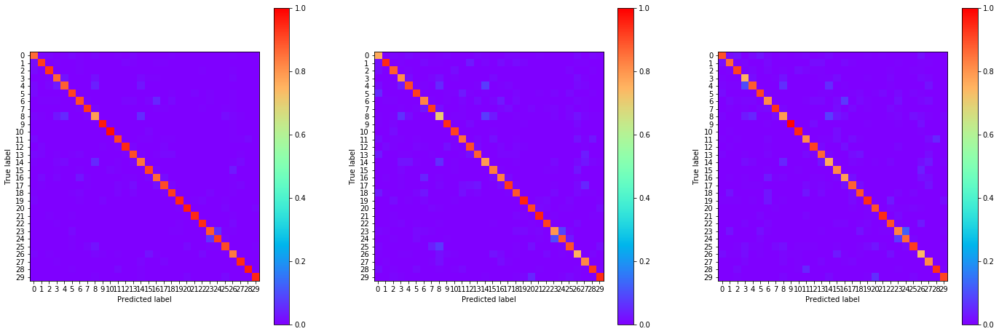

16:05:24.354920
#154 [Train: 0.307] [Test: 0.429] [Valid: 0.430]
#154 [Train: 0.909] [Test: 0.879] [Valid: 0.871]


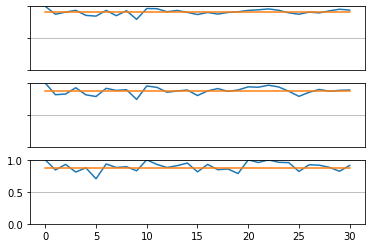

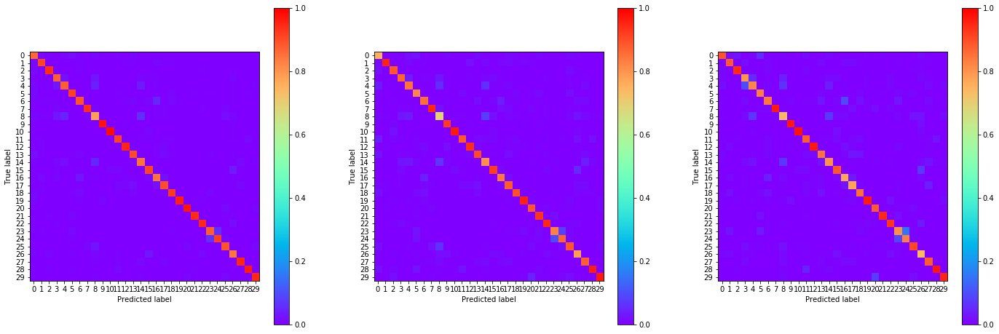

16:06:35.230924
#155 [Train: 0.303] [Test: 0.427] [Valid: 0.423]
#155 [Train: 0.911] [Test: 0.879] [Valid: 0.875]


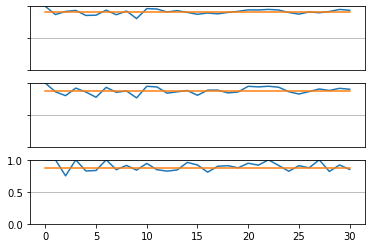

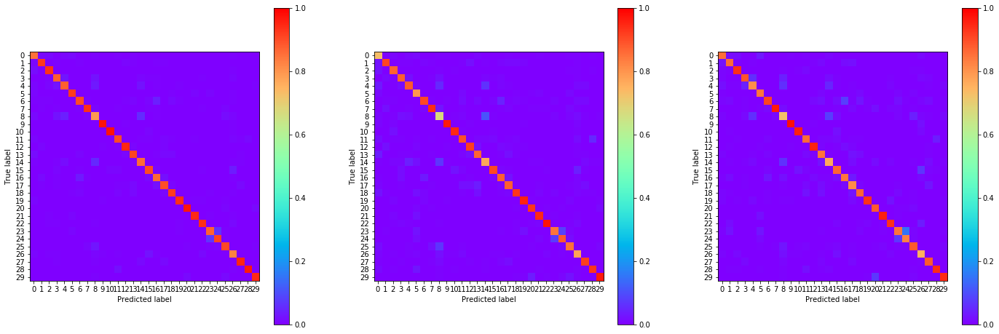

16:07:43.844522
#156 [Train: 0.305] [Test: 0.435] [Valid: 0.430]
#156 [Train: 0.911] [Test: 0.875] [Valid: 0.871]


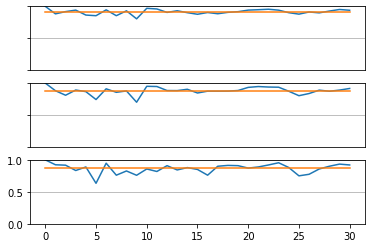

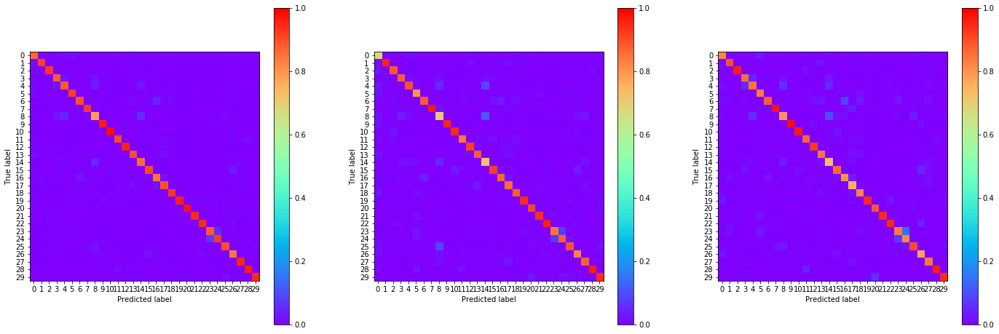

16:08:51.073185
#157 [Train: 0.299] [Test: 0.430] [Valid: 0.424]
#157 [Train: 0.912] [Test: 0.877] [Valid: 0.871]


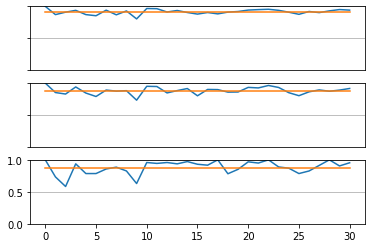

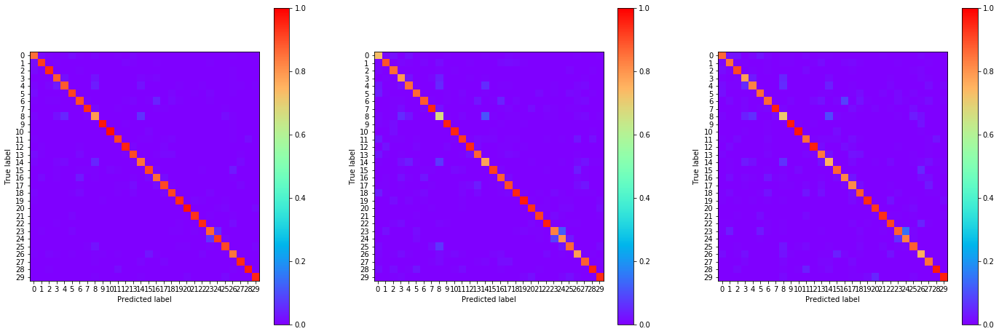

16:10:01.103471
#158 [Train: 0.300] [Test: 0.439] [Valid: 0.420]
#158 [Train: 0.912] [Test: 0.873] [Valid: 0.873]


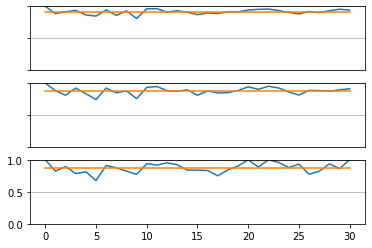

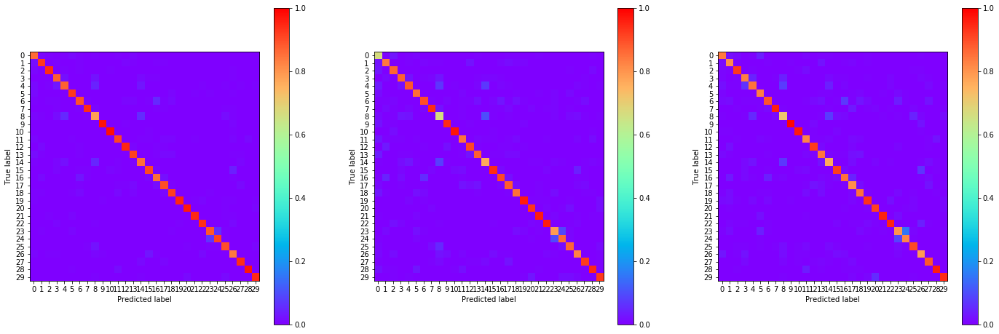

16:11:13.736735
#159 [Train: 0.296] [Test: 0.429] [Valid: 0.419]
#159 [Train: 0.914] [Test: 0.878] [Valid: 0.874]


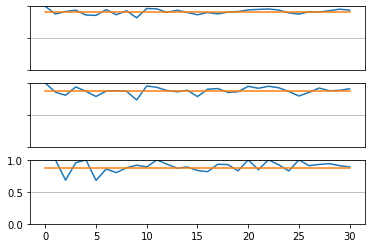

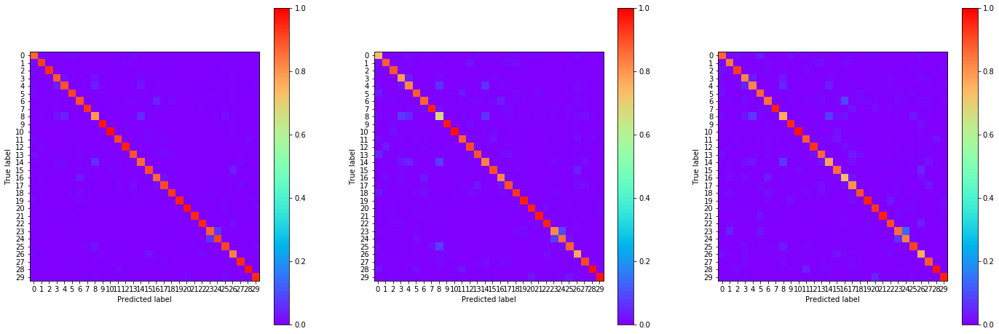

16:12:25.712979
#160 [Train: 0.294] [Test: 0.423] [Valid: 0.414]
#160 [Train: 0.913] [Test: 0.882] [Valid: 0.877]


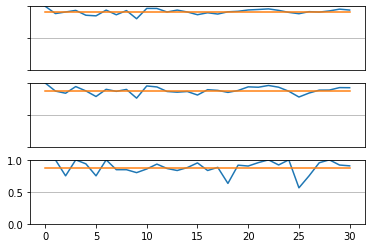

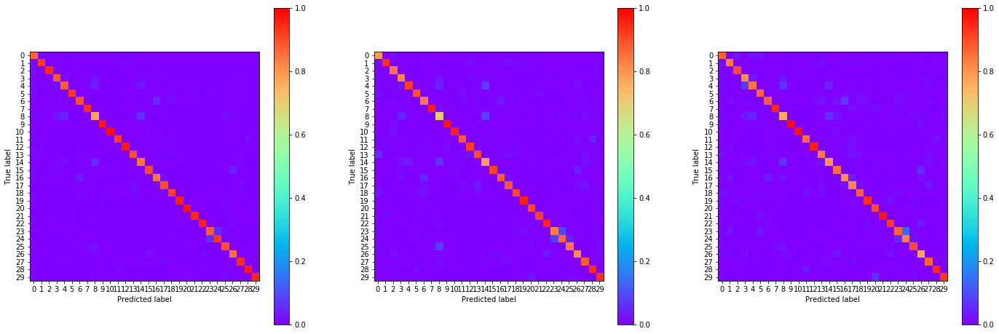

16:13:37.287876
#161 [Train: 0.292] [Test: 0.428] [Valid: 0.424]
#161 [Train: 0.915] [Test: 0.879] [Valid: 0.873]


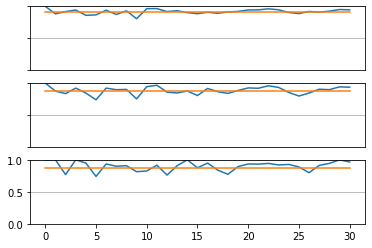

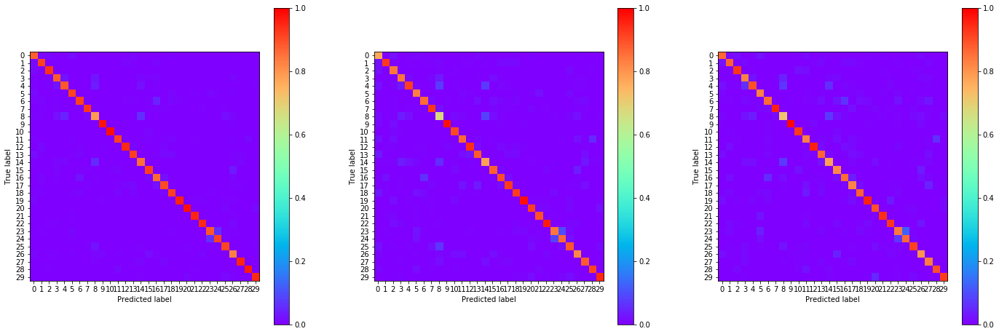

16:14:48.557802
#162 [Train: 0.289] [Test: 0.418] [Valid: 0.413]
#162 [Train: 0.915] [Test: 0.877] [Valid: 0.876]


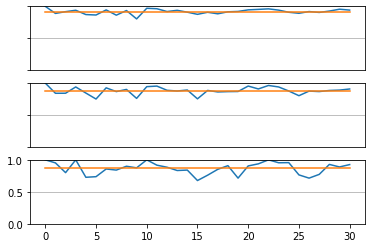

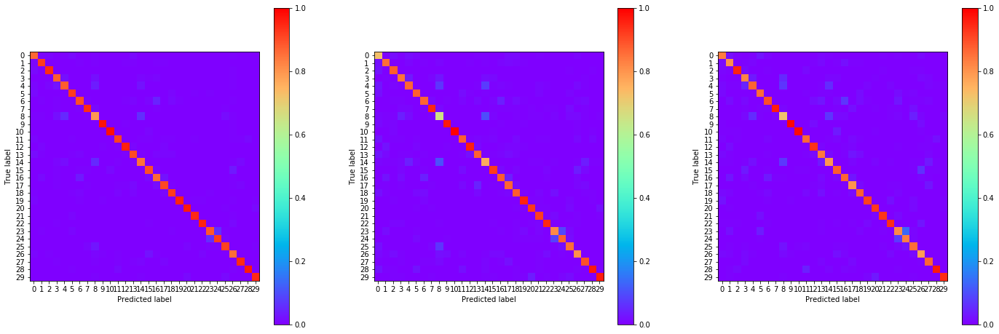

16:15:57.091941
#163 [Train: 0.290] [Test: 0.418] [Valid: 0.415]
#163 [Train: 0.914] [Test: 0.879] [Valid: 0.878]


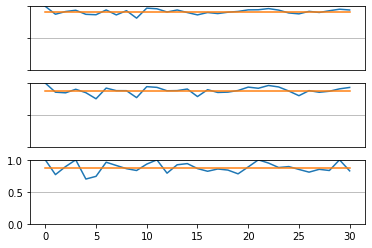

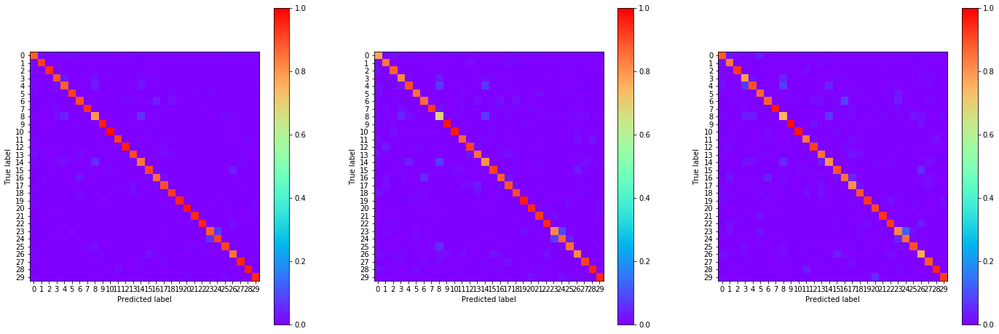

16:17:06.261142
#164 [Train: 0.287] [Test: 0.422] [Valid: 0.412]
#164 [Train: 0.916] [Test: 0.881] [Valid: 0.879]


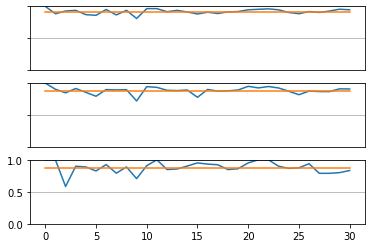

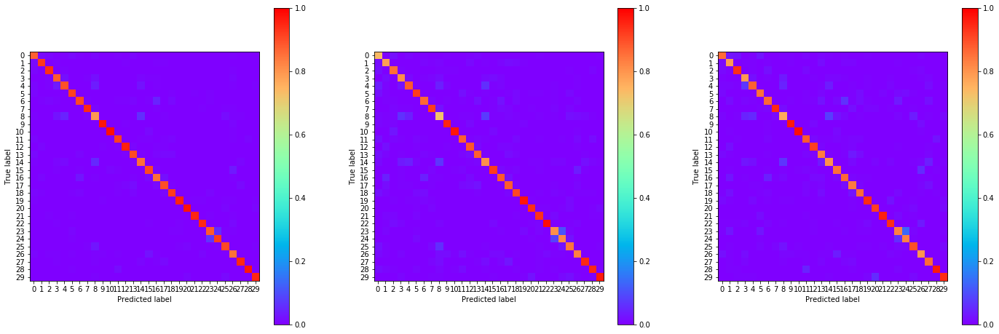

16:18:20.306640
#165 [Train: 0.283] [Test: 0.420] [Valid: 0.408]
#165 [Train: 0.917] [Test: 0.878] [Valid: 0.880]


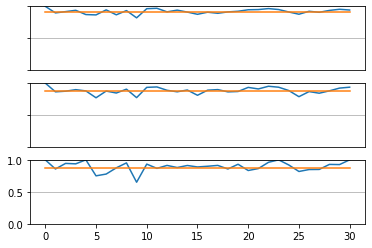

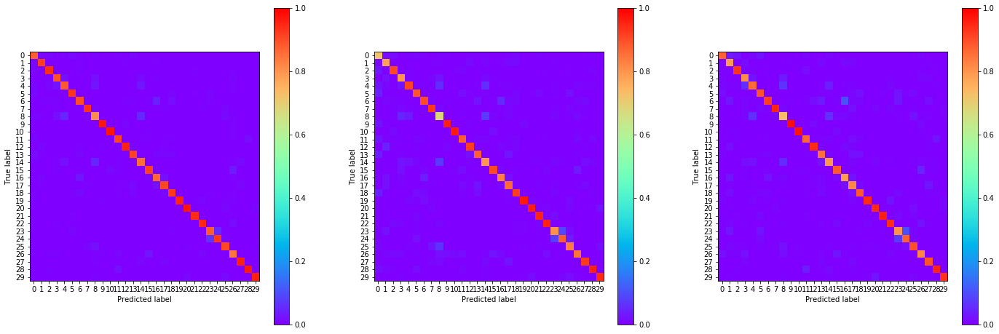

16:19:34.467705
#166 [Train: 0.281] [Test: 0.406] [Valid: 0.409]
#166 [Train: 0.916] [Test: 0.885] [Valid: 0.881]


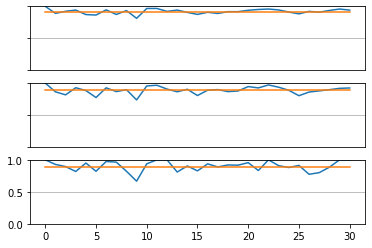

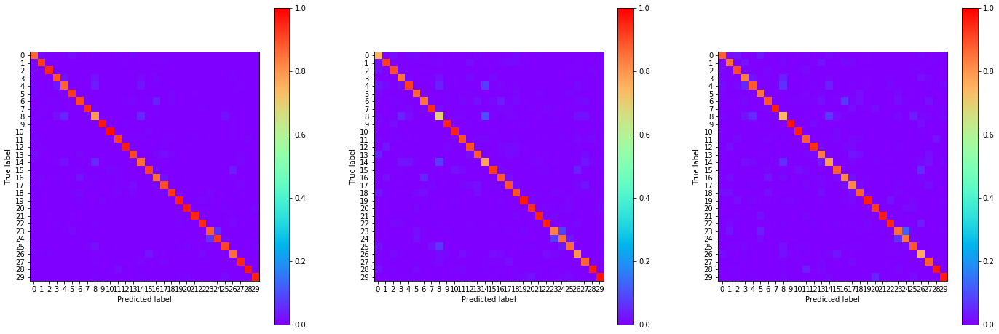

16:20:42.674055
#167 [Train: 0.283] [Test: 0.411] [Valid: 0.408]
#167 [Train: 0.917] [Test: 0.883] [Valid: 0.880]


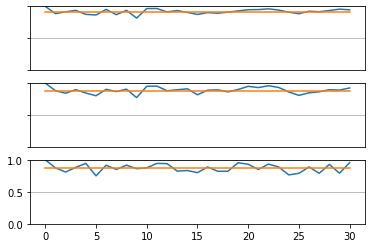

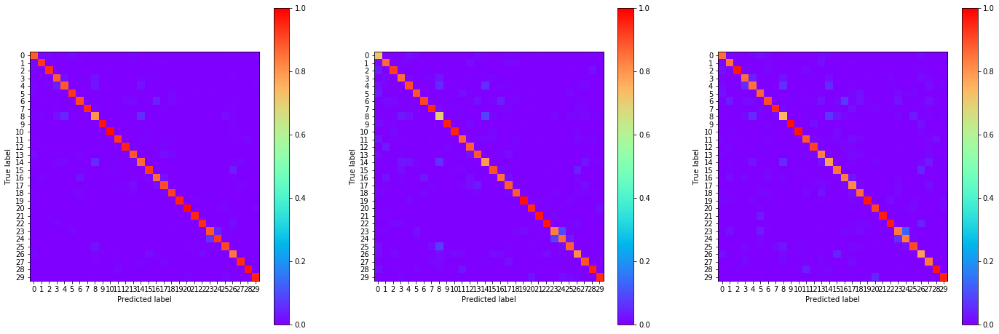

16:21:52.415396
#168 [Train: 0.277] [Test: 0.409] [Valid: 0.413]
#168 [Train: 0.919] [Test: 0.883] [Valid: 0.876]


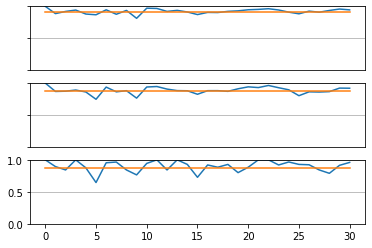

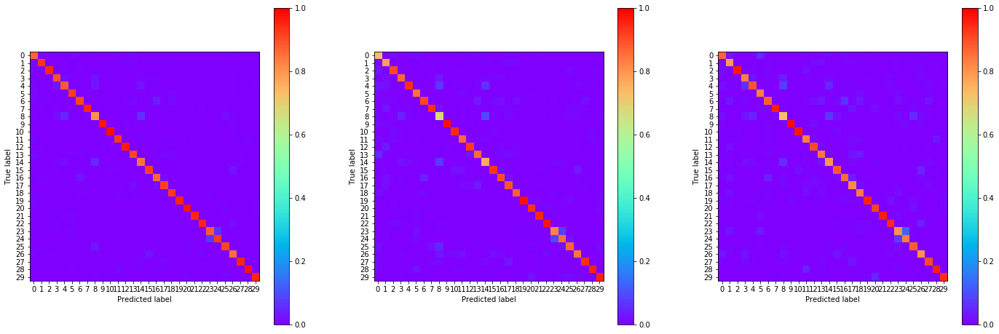

16:23:00.288440
#169 [Train: 0.274] [Test: 0.417] [Valid: 0.408]
#169 [Train: 0.919] [Test: 0.884] [Valid: 0.877]


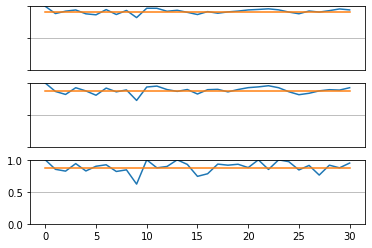

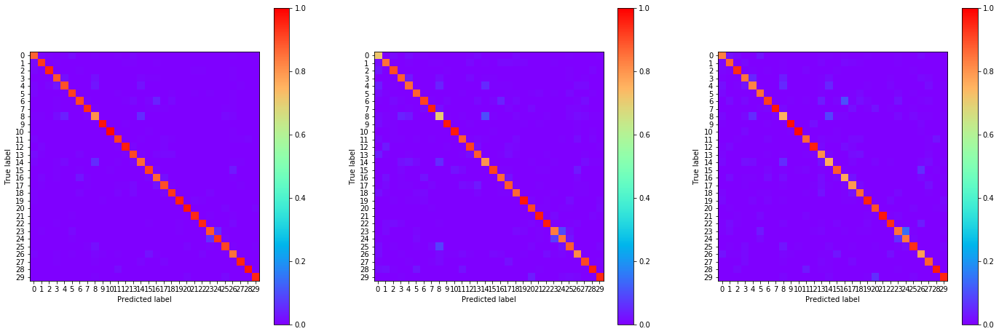

16:24:08.576705
#170 [Train: 0.277] [Test: 0.424] [Valid: 0.415]
#170 [Train: 0.918] [Test: 0.873] [Valid: 0.879]


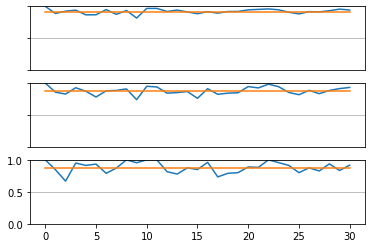

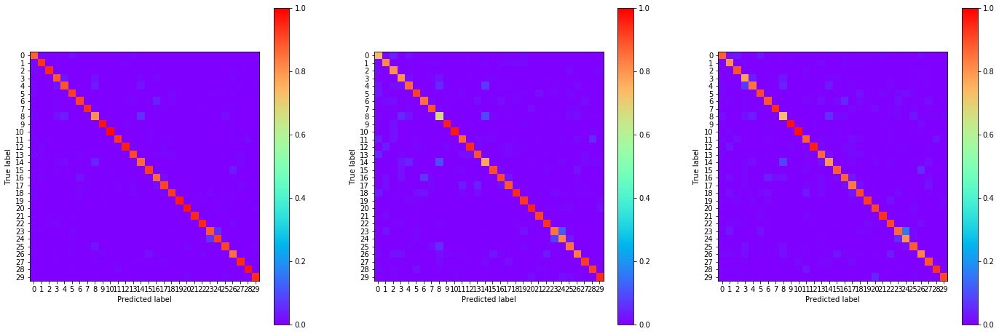

16:25:16.200246
#171 [Train: 0.279] [Test: 0.429] [Valid: 0.421]
#171 [Train: 0.918] [Test: 0.876] [Valid: 0.875]


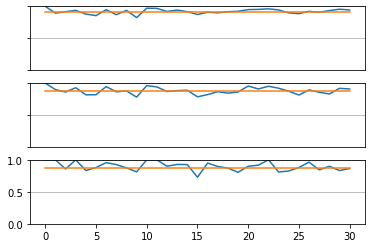

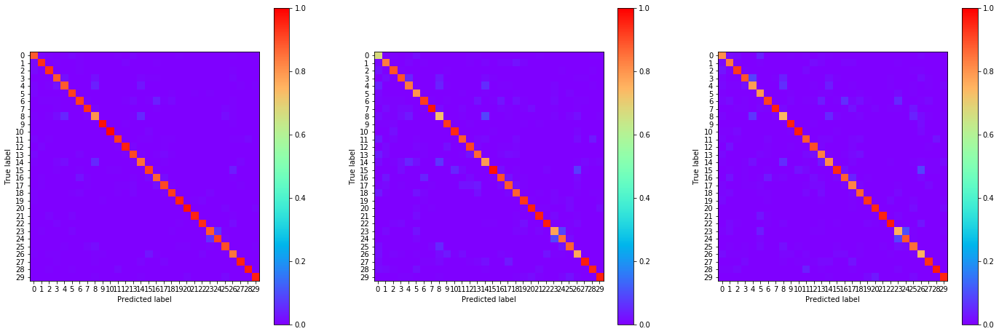

16:26:25.414122
#172 [Train: 0.273] [Test: 0.411] [Valid: 0.409]
#172 [Train: 0.919] [Test: 0.886] [Valid: 0.880]


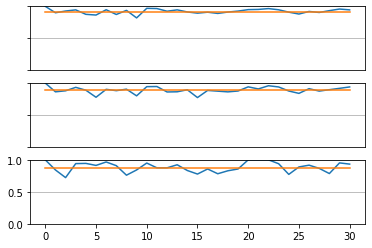

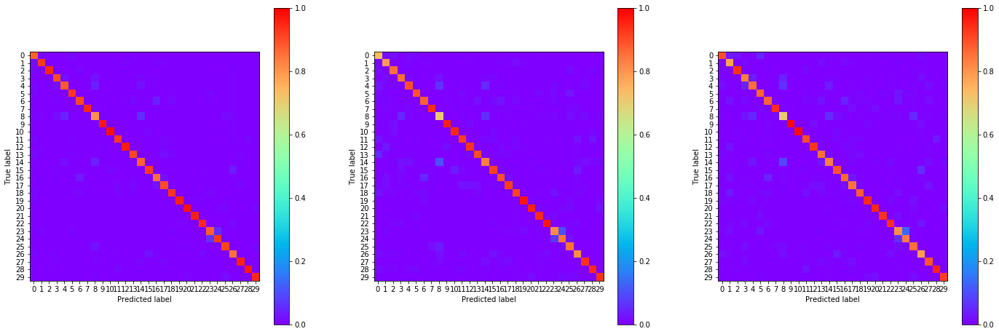

16:27:35.349839
#173 [Train: 0.269] [Test: 0.406] [Valid: 0.399]
#173 [Train: 0.920] [Test: 0.885] [Valid: 0.881]


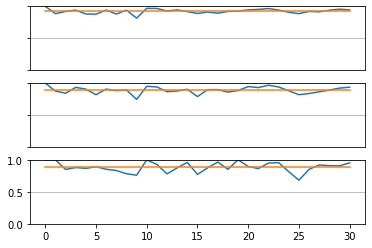

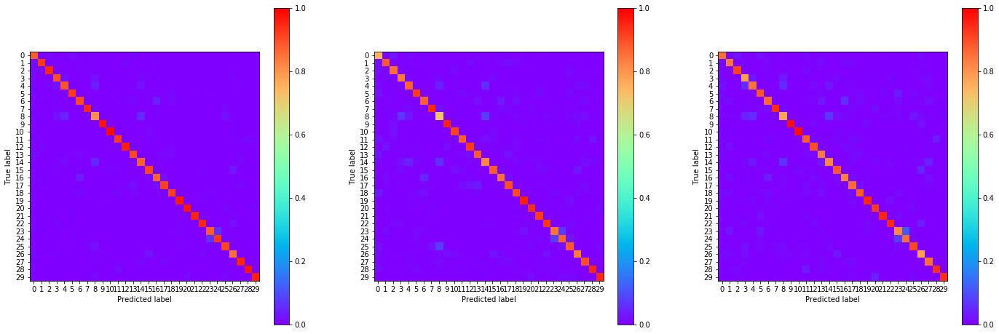

16:28:45.299732
#174 [Train: 0.268] [Test: 0.416] [Valid: 0.406]
#174 [Train: 0.920] [Test: 0.880] [Valid: 0.879]


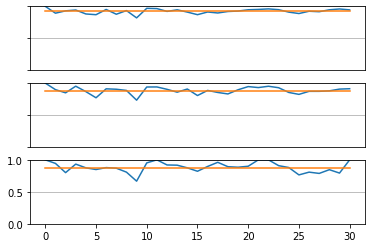

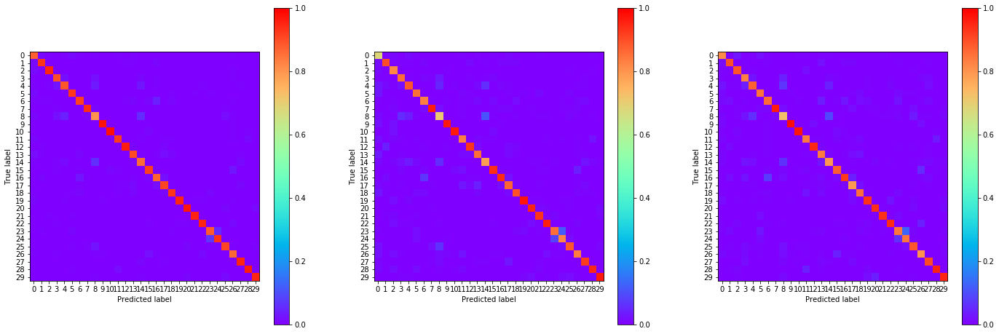

16:29:57.158771
#175 [Train: 0.267] [Test: 0.413] [Valid: 0.397]
#175 [Train: 0.922] [Test: 0.881] [Valid: 0.880]


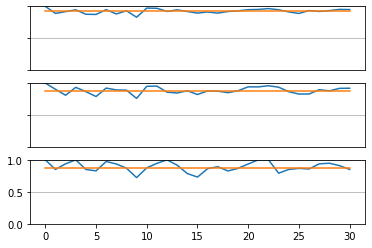

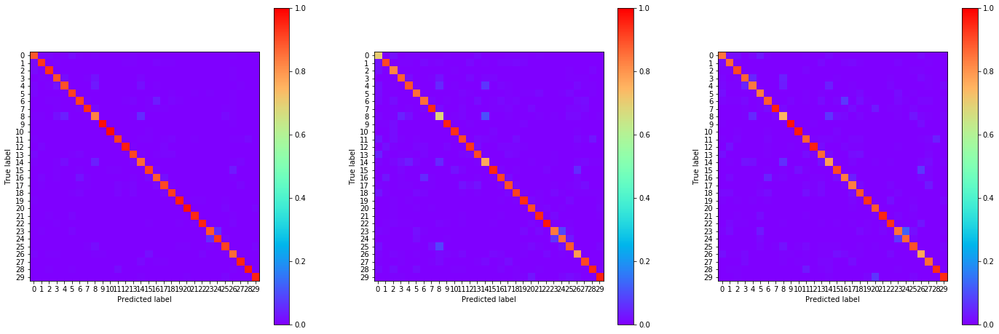

16:31:11.209747
#176 [Train: 0.264] [Test: 0.436] [Valid: 0.419]
#176 [Train: 0.922] [Test: 0.880] [Valid: 0.880]


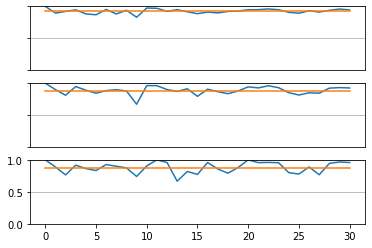

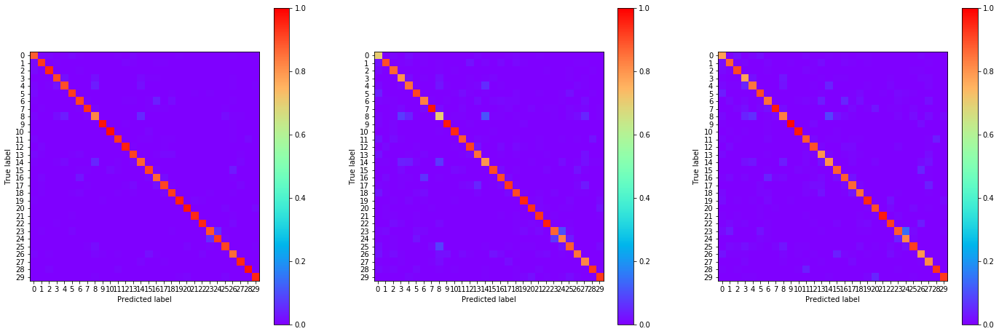

16:32:29.082923
#177 [Train: 0.267] [Test: 0.404] [Valid: 0.400]
#177 [Train: 0.922] [Test: 0.883] [Valid: 0.885]


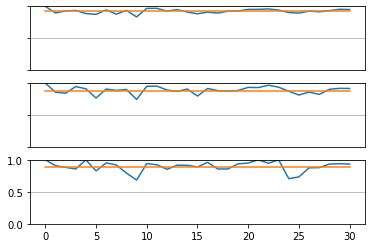

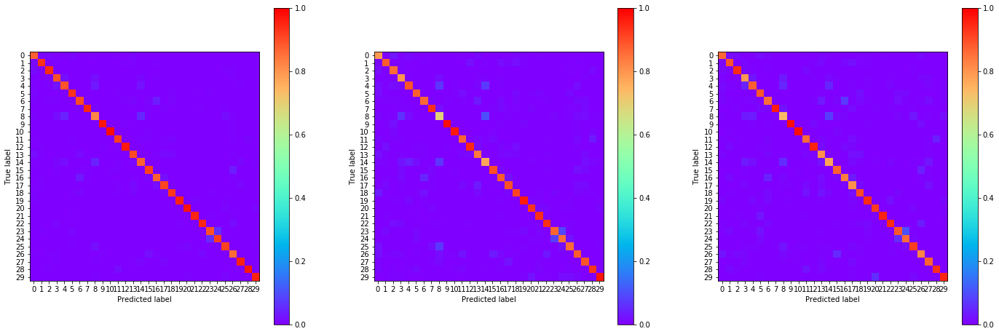

16:33:38.758475
#178 [Train: 0.260] [Test: 0.406] [Valid: 0.397]
#178 [Train: 0.924] [Test: 0.882] [Valid: 0.882]


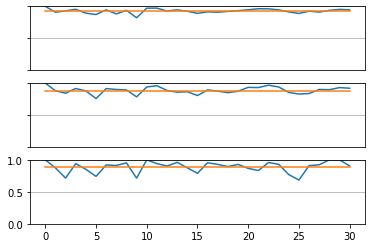

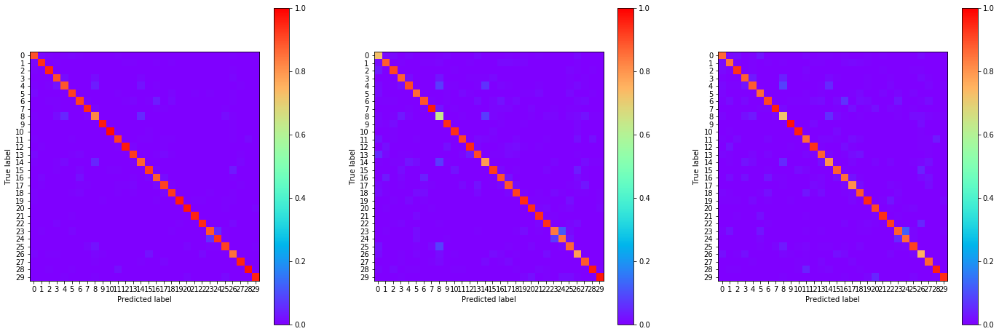

16:34:47.457467
#179 [Train: 0.259] [Test: 0.403] [Valid: 0.395]
#179 [Train: 0.924] [Test: 0.883] [Valid: 0.882]


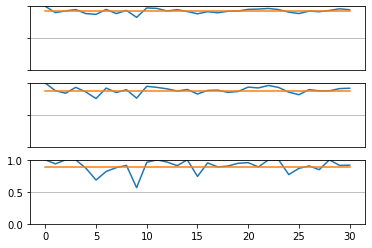

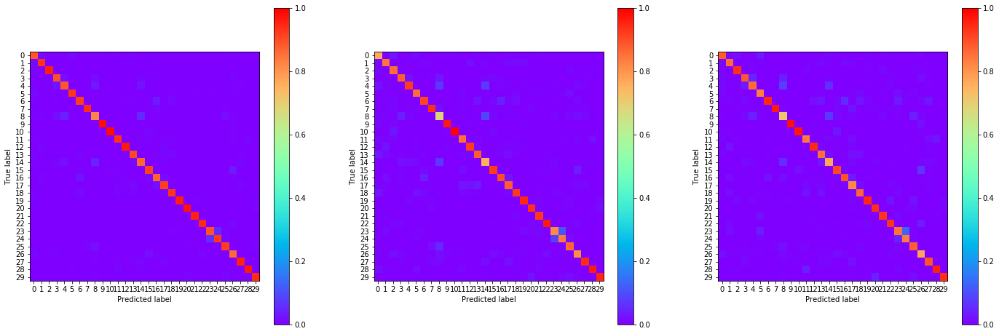

16:35:56.628532
#180 [Train: 0.258] [Test: 0.408] [Valid: 0.401]
#180 [Train: 0.923] [Test: 0.885] [Valid: 0.883]


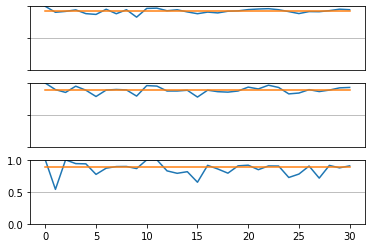

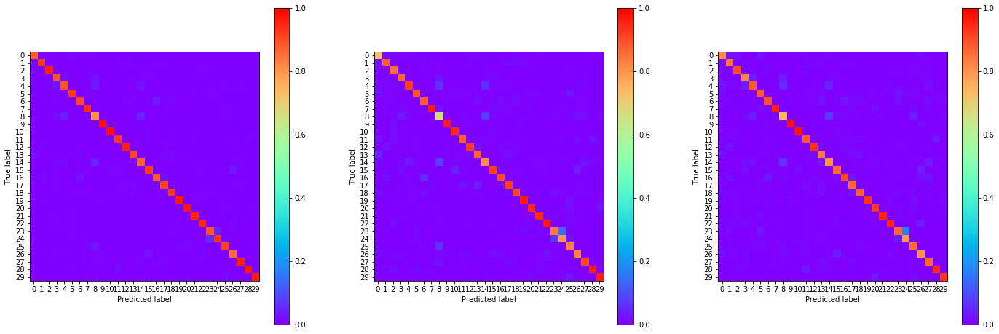

16:37:06.703462
#181 [Train: 0.257] [Test: 0.403] [Valid: 0.400]
#181 [Train: 0.925] [Test: 0.889] [Valid: 0.883]


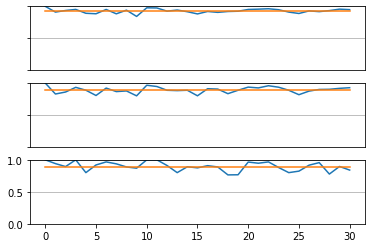

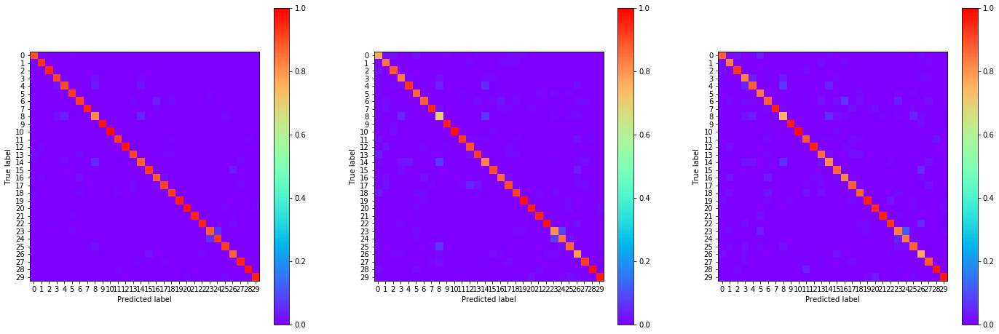

16:38:18.375397
#182 [Train: 0.257] [Test: 0.388] [Valid: 0.396]
#182 [Train: 0.925] [Test: 0.888] [Valid: 0.884]


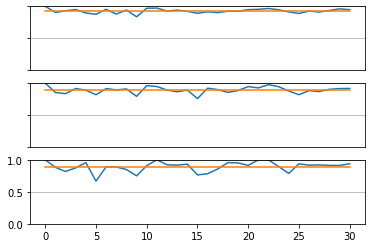

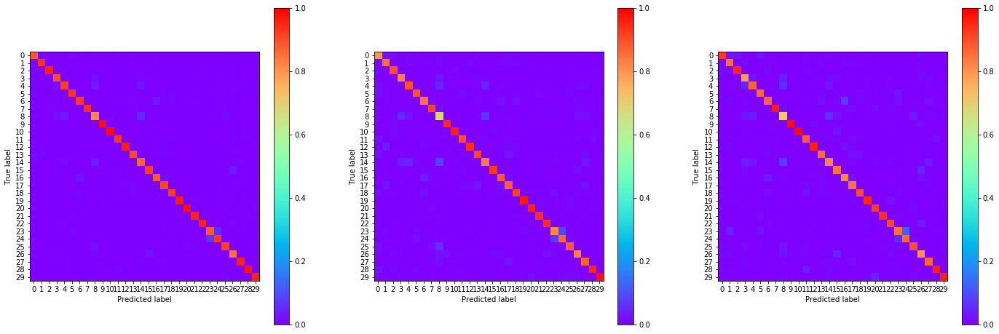

16:39:30.989765
#183 [Train: 0.253] [Test: 0.400] [Valid: 0.398]
#183 [Train: 0.926] [Test: 0.887] [Valid: 0.881]


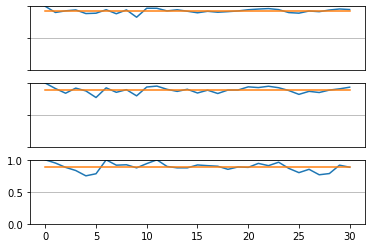

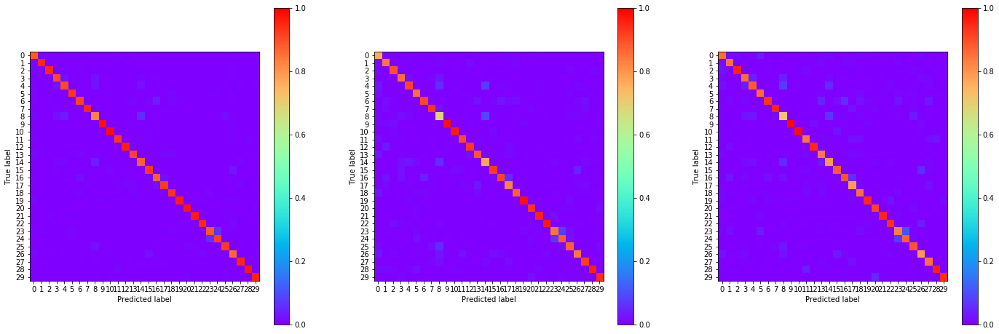

16:40:39.864415
#184 [Train: 0.251] [Test: 0.405] [Valid: 0.405]
#184 [Train: 0.927] [Test: 0.884] [Valid: 0.880]


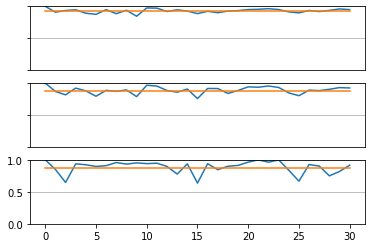

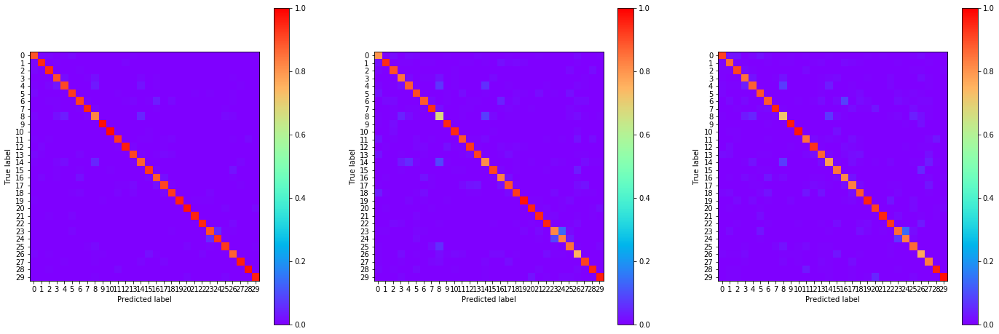

16:41:53.241204
#185 [Train: 0.252] [Test: 0.414] [Valid: 0.402]
#185 [Train: 0.926] [Test: 0.884] [Valid: 0.882]


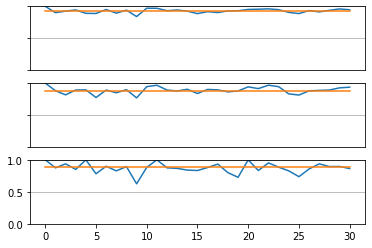

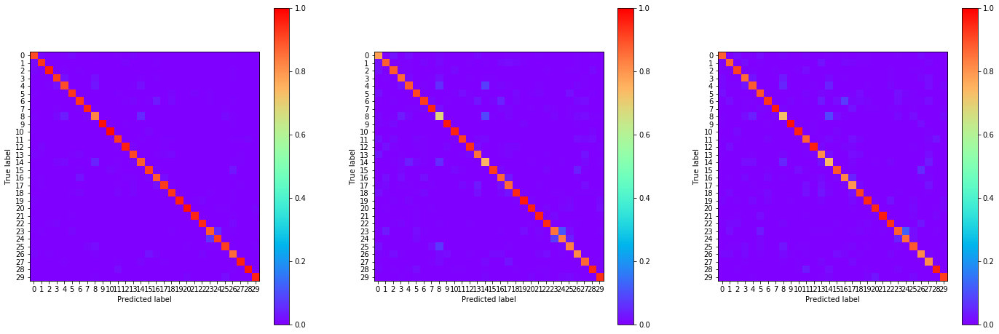

16:43:09.889190
#186 [Train: 0.248] [Test: 0.400] [Valid: 0.404]
#186 [Train: 0.928] [Test: 0.885] [Valid: 0.882]


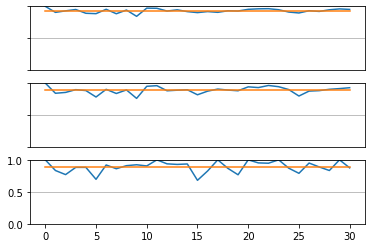

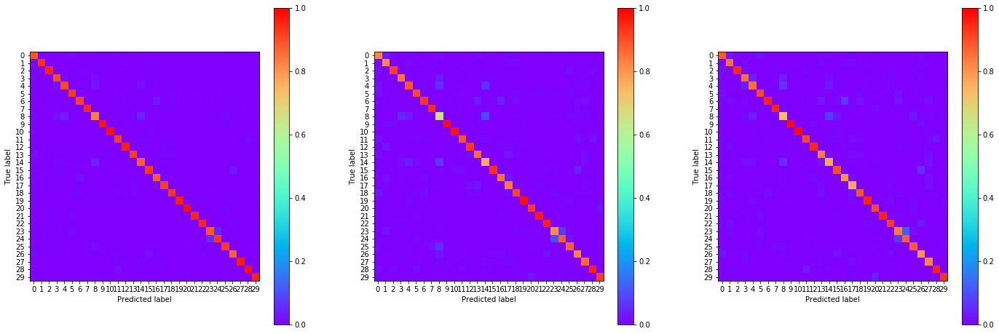

16:44:23.836203
#187 [Train: 0.247] [Test: 0.398] [Valid: 0.399]
#187 [Train: 0.927] [Test: 0.892] [Valid: 0.885]


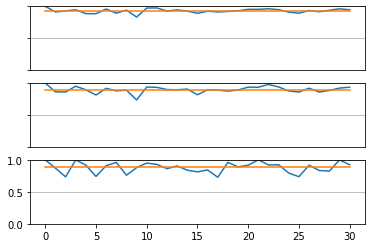

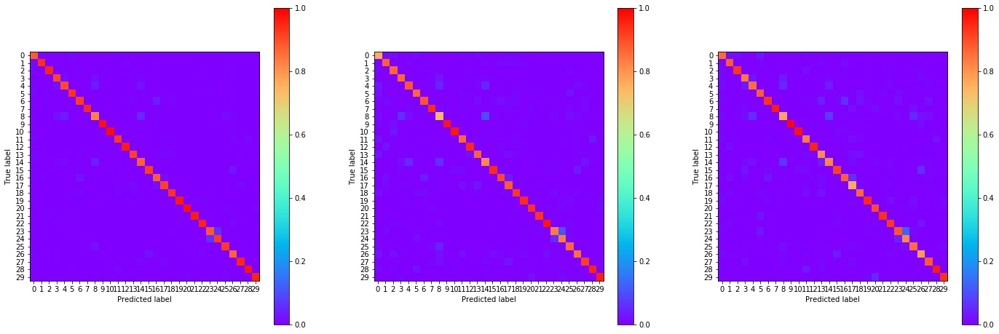

16:45:32.420575
#188 [Train: 0.247] [Test: 0.398] [Valid: 0.396]
#188 [Train: 0.927] [Test: 0.886] [Valid: 0.887]


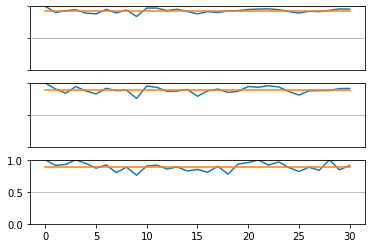

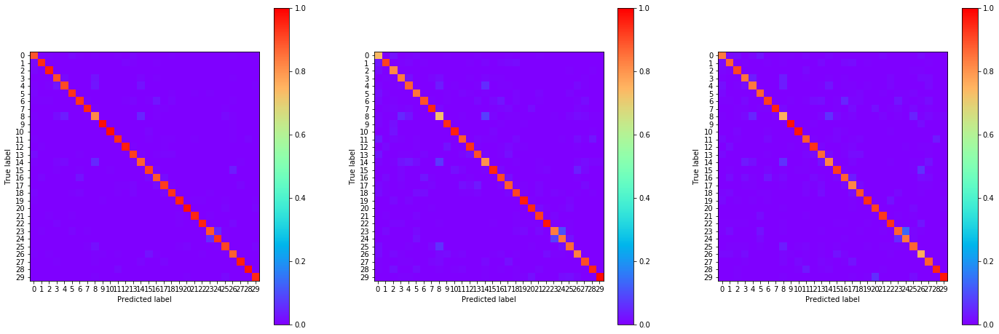

16:46:41.172448
#189 [Train: 0.243] [Test: 0.396] [Valid: 0.389]
#189 [Train: 0.928] [Test: 0.885] [Valid: 0.887]


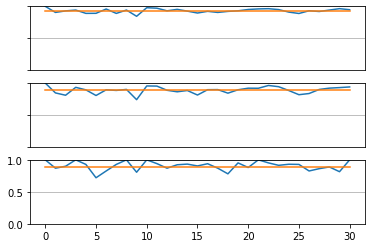

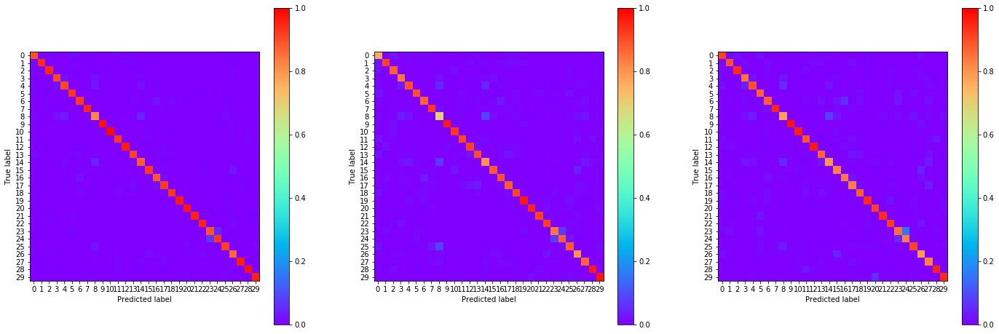

16:47:49.893658
#190 [Train: 0.241] [Test: 0.392] [Valid: 0.390]
#190 [Train: 0.929] [Test: 0.888] [Valid: 0.888]


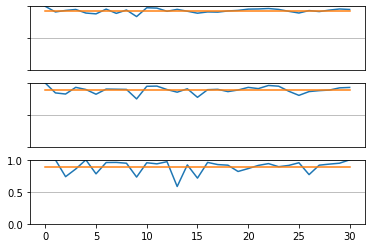

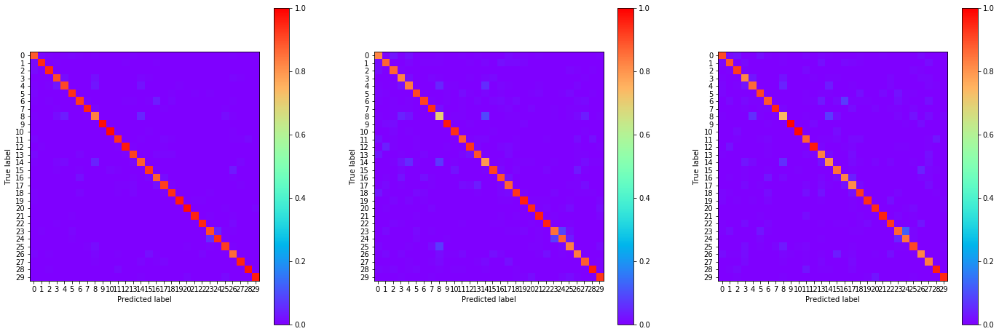

16:48:57.477211
#191 [Train: 0.239] [Test: 0.386] [Valid: 0.399]
#191 [Train: 0.930] [Test: 0.890] [Valid: 0.884]


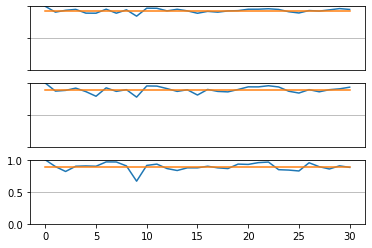

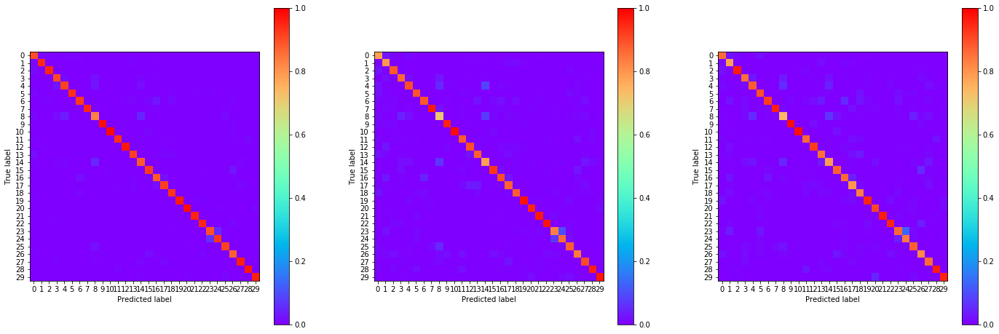

16:50:06.493581
#192 [Train: 0.238] [Test: 0.392] [Valid: 0.386]
#192 [Train: 0.930] [Test: 0.888] [Valid: 0.889]


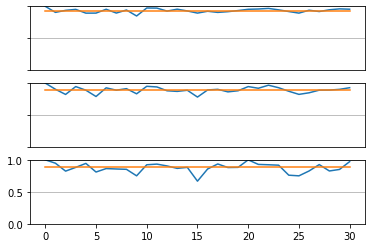

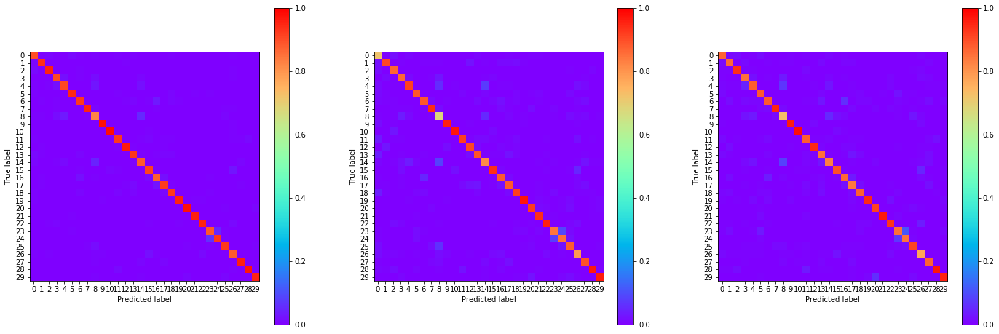

16:51:17.235046
#193 [Train: 0.242] [Test: 0.381] [Valid: 0.396]
#193 [Train: 0.928] [Test: 0.891] [Valid: 0.885]


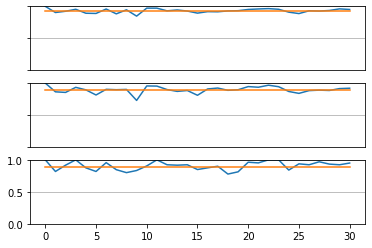

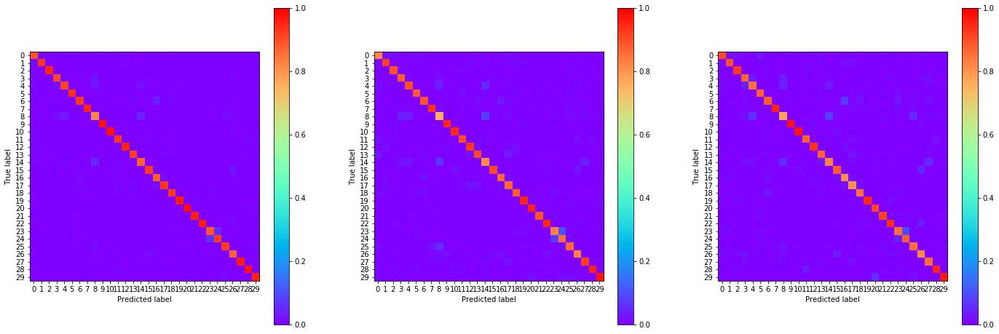

16:52:32.235981
#194 [Train: 0.238] [Test: 0.393] [Valid: 0.400]
#194 [Train: 0.930] [Test: 0.890] [Valid: 0.886]


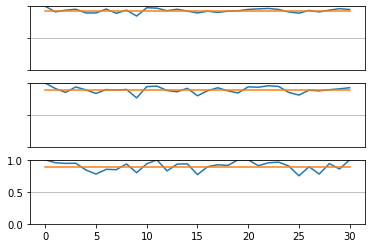

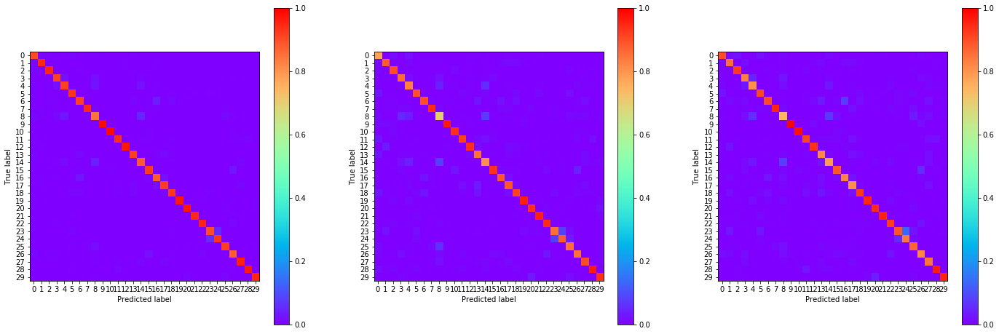

16:53:42.648540
#195 [Train: 0.235] [Test: 0.392] [Valid: 0.390]
#195 [Train: 0.931] [Test: 0.889] [Valid: 0.887]


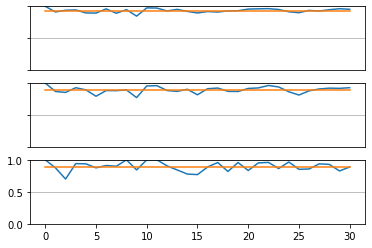

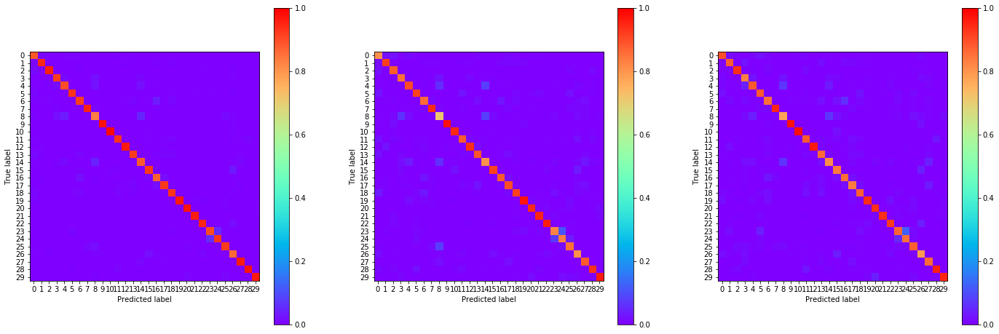

16:54:50.136109
#196 [Train: 0.236] [Test: 0.388] [Valid: 0.387]
#196 [Train: 0.931] [Test: 0.887] [Valid: 0.884]


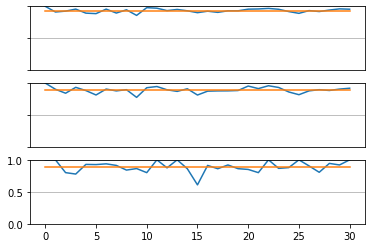

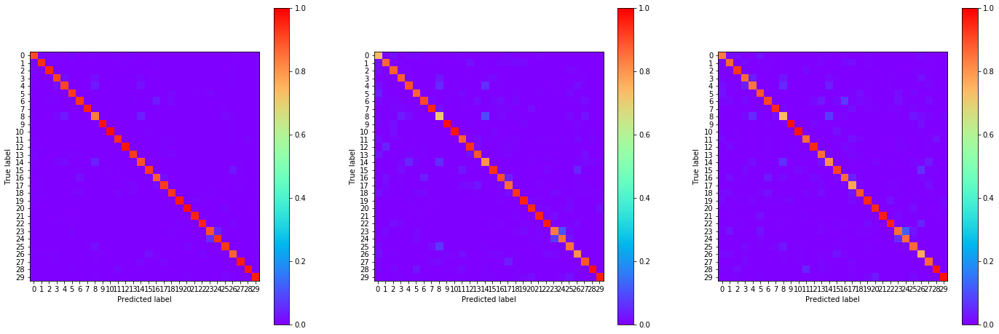

16:55:57.912169
#197 [Train: 0.235] [Test: 0.388] [Valid: 0.385]
#197 [Train: 0.932] [Test: 0.886] [Valid: 0.891]


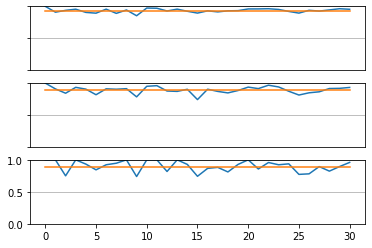

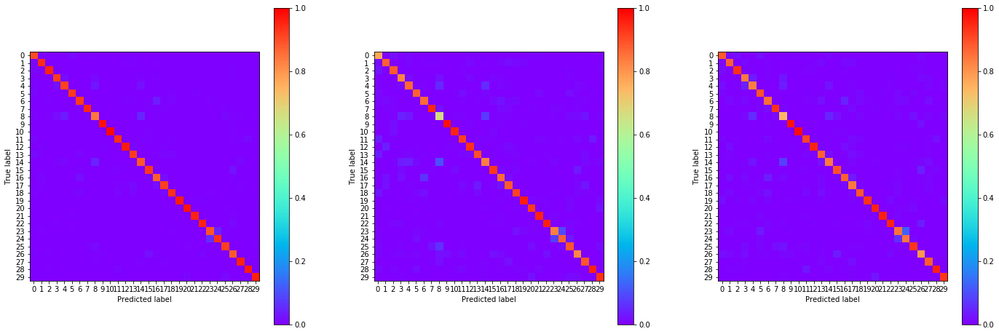

16:57:06.220564
#198 [Train: 0.234] [Test: 0.389] [Valid: 0.393]
#198 [Train: 0.931] [Test: 0.887] [Valid: 0.885]


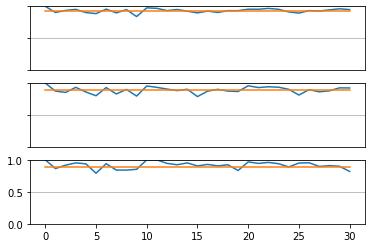

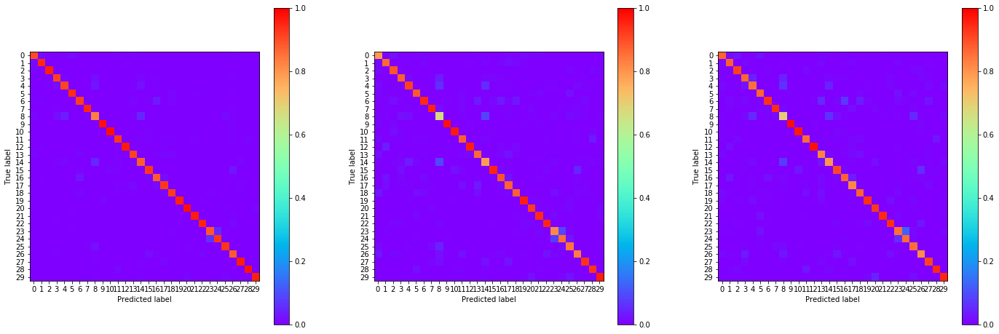

16:58:14.096202
#199 [Train: 0.234] [Test: 0.384] [Valid: 0.398]
#199 [Train: 0.931] [Test: 0.894] [Valid: 0.884]


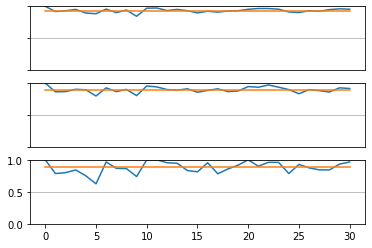

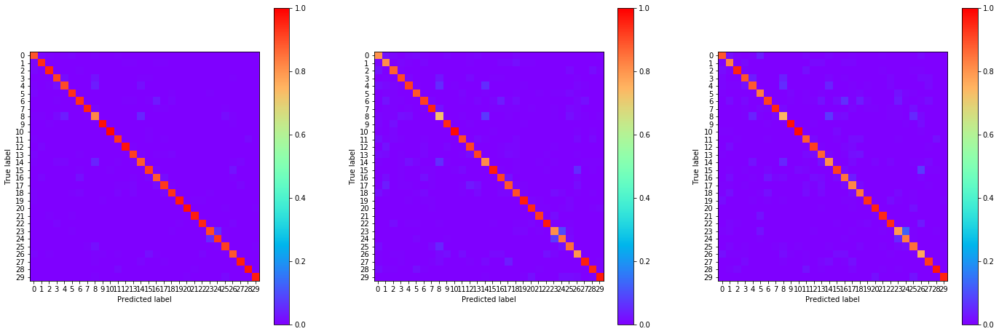

16:59:21.416055
#200 [Train: 0.231] [Test: 0.384] [Valid: 0.386]
#200 [Train: 0.933] [Test: 0.890] [Valid: 0.890]


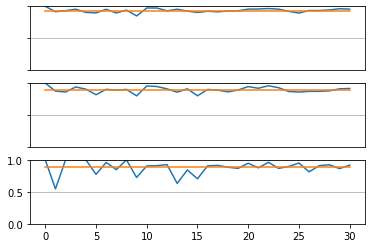

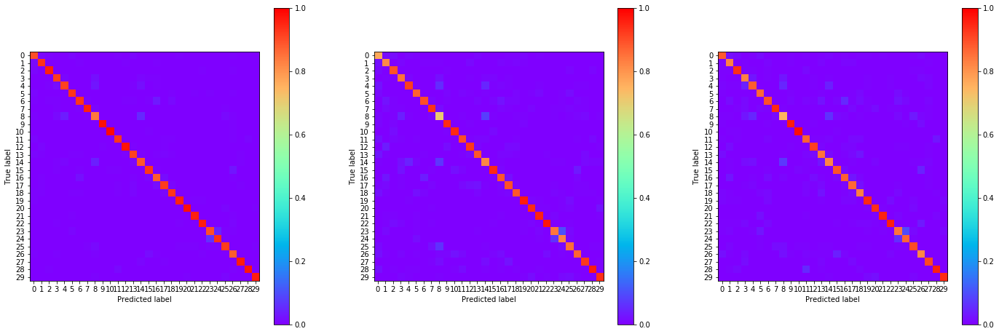

17:00:29.499984
#201 [Train: 0.227] [Test: 0.381] [Valid: 0.380]
#201 [Train: 0.934] [Test: 0.889] [Valid: 0.888]


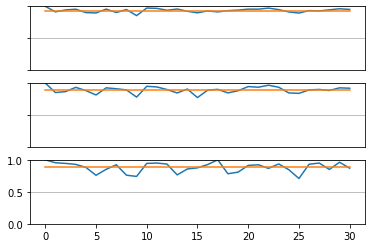

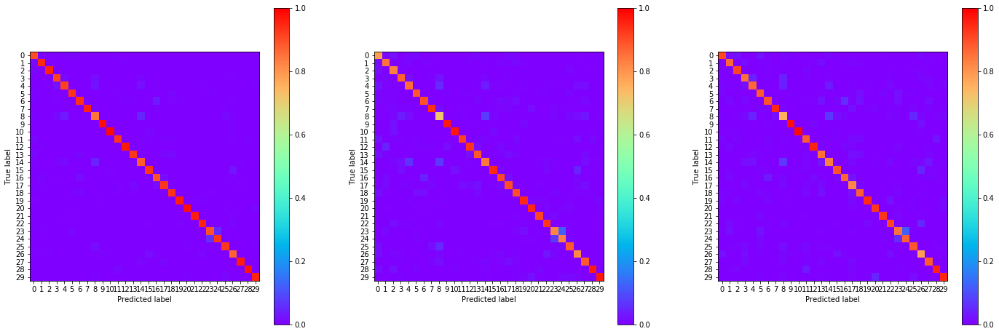

17:01:38.346980
#202 [Train: 0.227] [Test: 0.391] [Valid: 0.389]
#202 [Train: 0.933] [Test: 0.889] [Valid: 0.887]


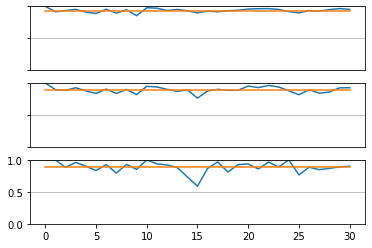

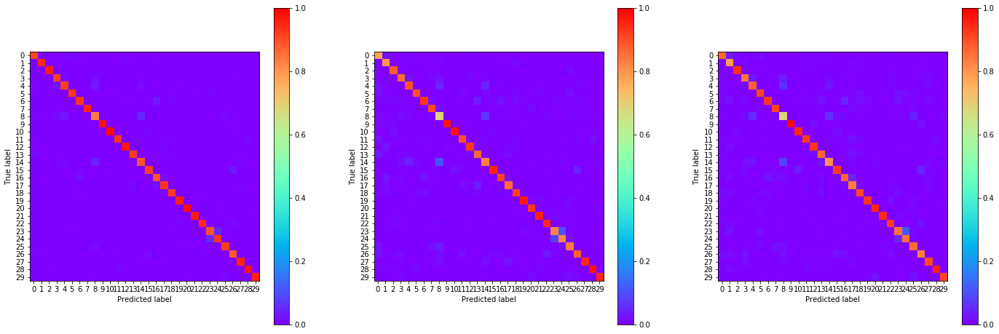

17:02:47.223956
#203 [Train: 0.230] [Test: 0.391] [Valid: 0.388]
#203 [Train: 0.932] [Test: 0.888] [Valid: 0.890]


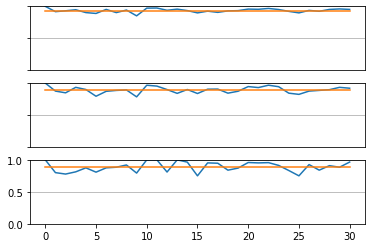

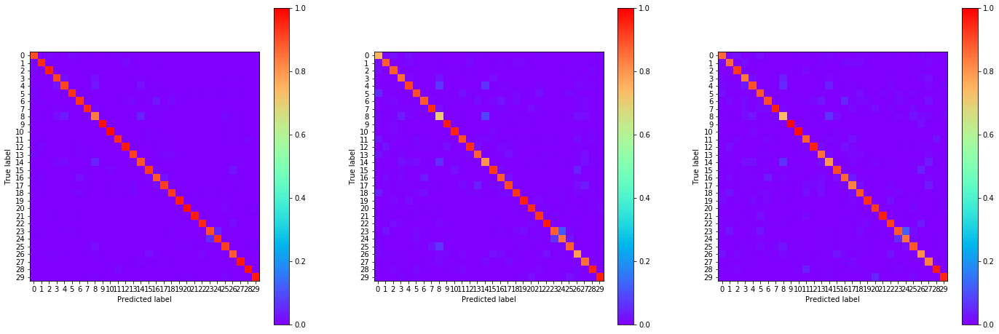

17:03:55.106225
#204 [Train: 0.227] [Test: 0.377] [Valid: 0.388]
#204 [Train: 0.933] [Test: 0.894] [Valid: 0.890]


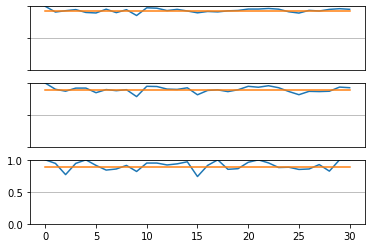

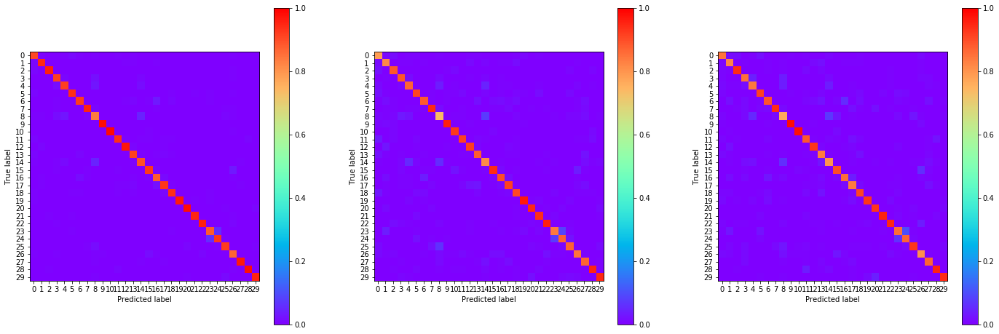

17:05:03.491099
#205 [Train: 0.228] [Test: 0.394] [Valid: 0.395]
#205 [Train: 0.933] [Test: 0.885] [Valid: 0.885]


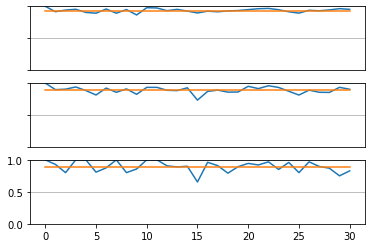

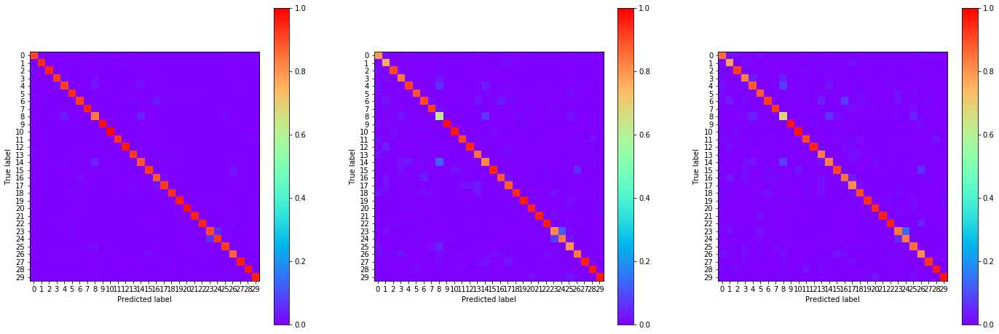

17:06:14.100608
#206 [Train: 0.221] [Test: 0.372] [Valid: 0.377]
#206 [Train: 0.935] [Test: 0.891] [Valid: 0.890]


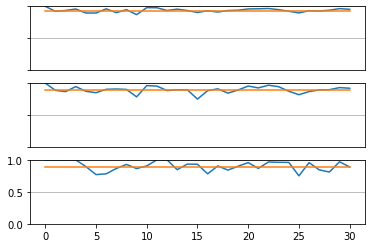

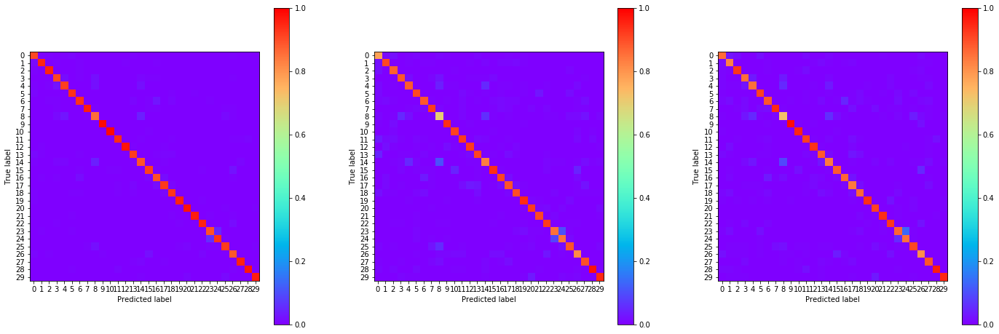

17:07:23.536871
#207 [Train: 0.222] [Test: 0.384] [Valid: 0.385]
#207 [Train: 0.934] [Test: 0.888] [Valid: 0.889]


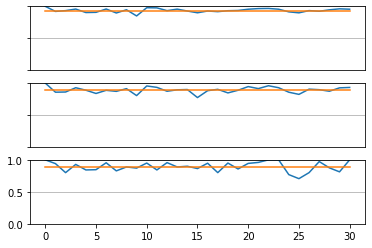

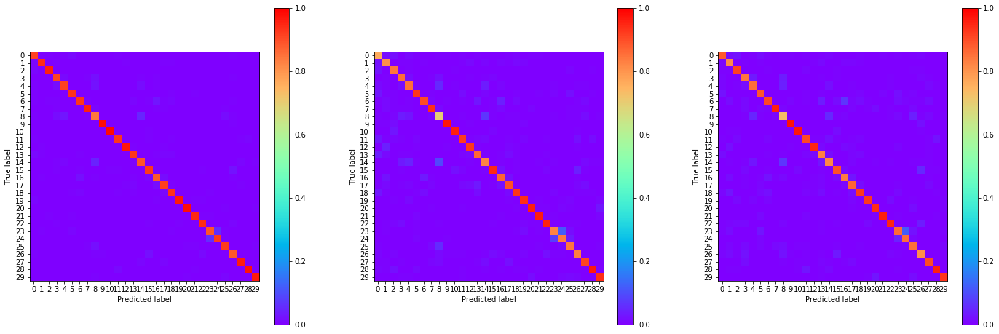

17:08:32.936153
#208 [Train: 0.221] [Test: 0.379] [Valid: 0.377]
#208 [Train: 0.936] [Test: 0.894] [Valid: 0.890]


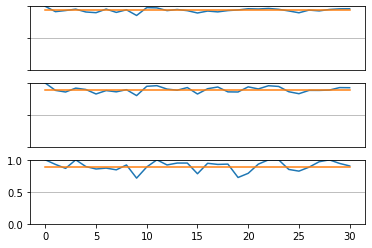

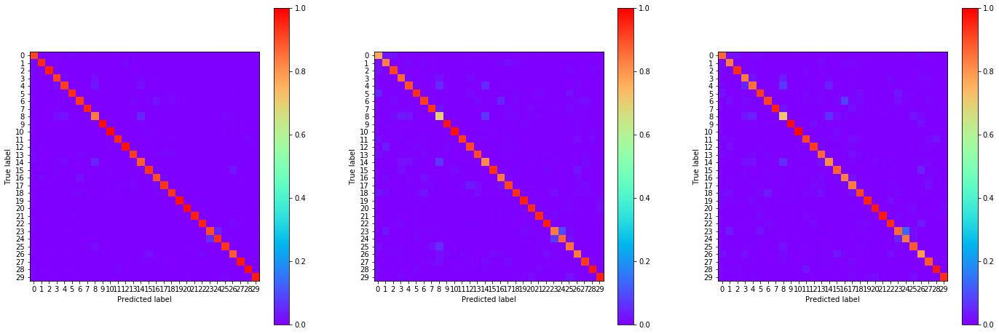

17:09:42.686217
#209 [Train: 0.219] [Test: 0.383] [Valid: 0.391]
#209 [Train: 0.936] [Test: 0.893] [Valid: 0.890]


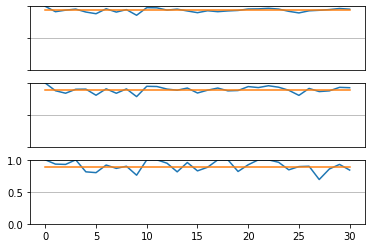

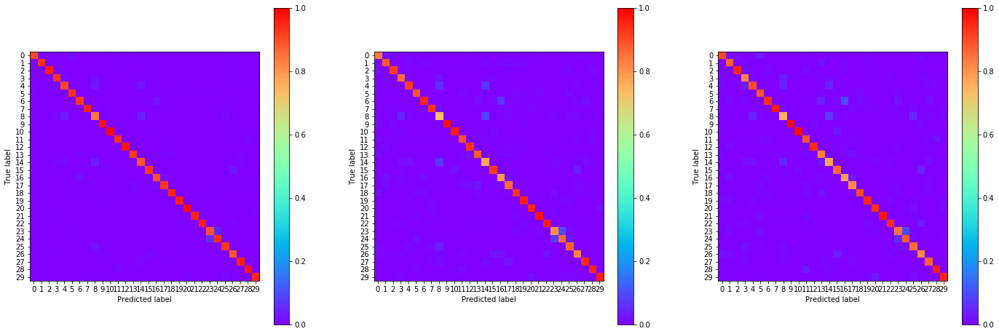

17:10:53.290422
#210 [Train: 0.218] [Test: 0.369] [Valid: 0.374]
#210 [Train: 0.936] [Test: 0.898] [Valid: 0.888]


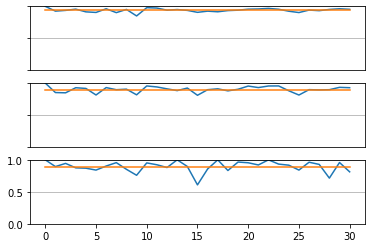

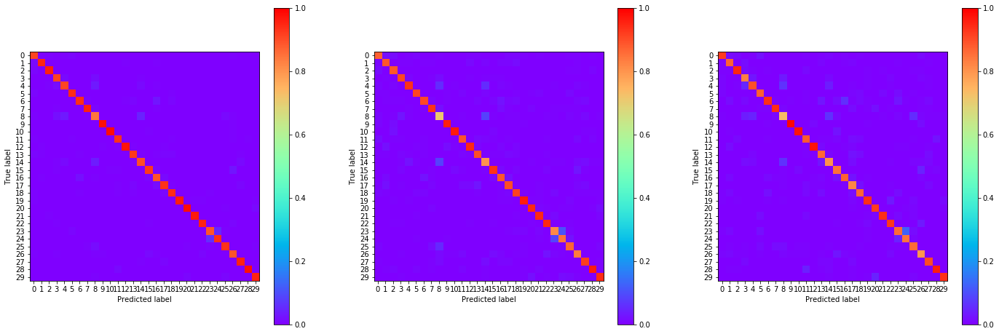

17:12:01.930890
#211 [Train: 0.215] [Test: 0.373] [Valid: 0.369]
#211 [Train: 0.936] [Test: 0.893] [Valid: 0.893]


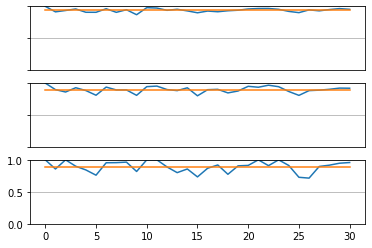

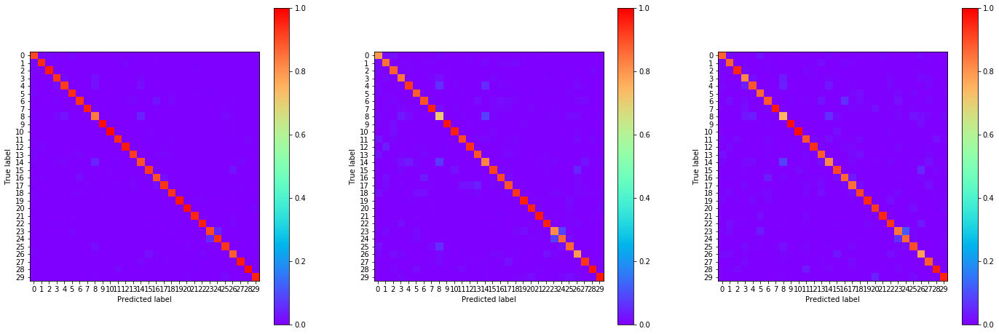

17:13:11.092694
#212 [Train: 0.212] [Test: 0.391] [Valid: 0.385]
#212 [Train: 0.937] [Test: 0.889] [Valid: 0.890]


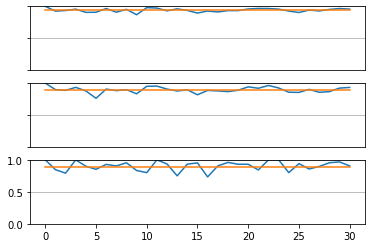

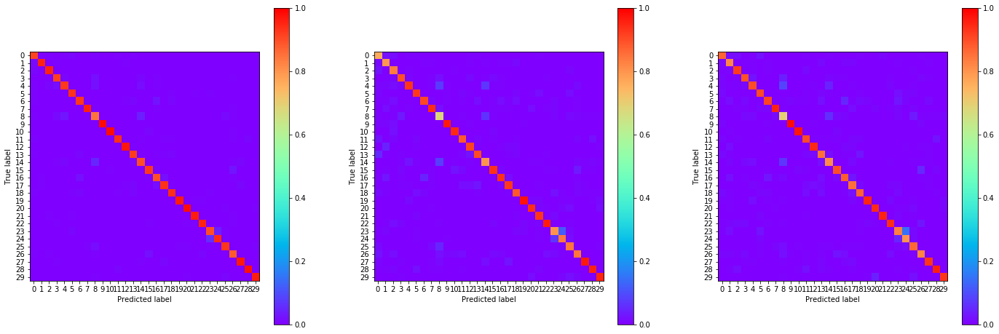

17:14:19.299408
#213 [Train: 0.213] [Test: 0.381] [Valid: 0.379]
#213 [Train: 0.937] [Test: 0.891] [Valid: 0.891]


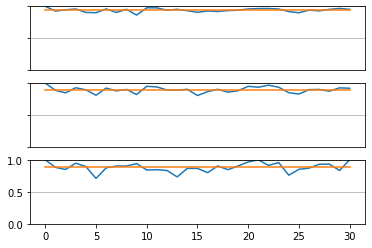

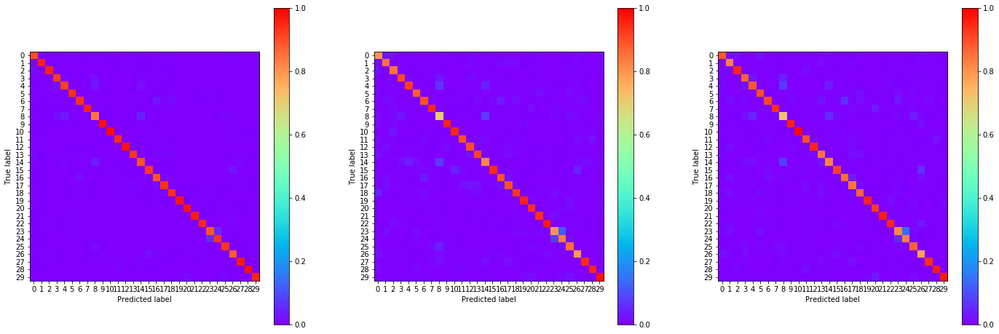

17:15:27.142890
#214 [Train: 0.211] [Test: 0.378] [Valid: 0.379]
#214 [Train: 0.938] [Test: 0.891] [Valid: 0.890]


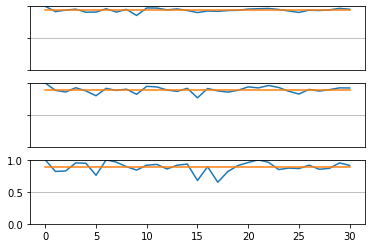

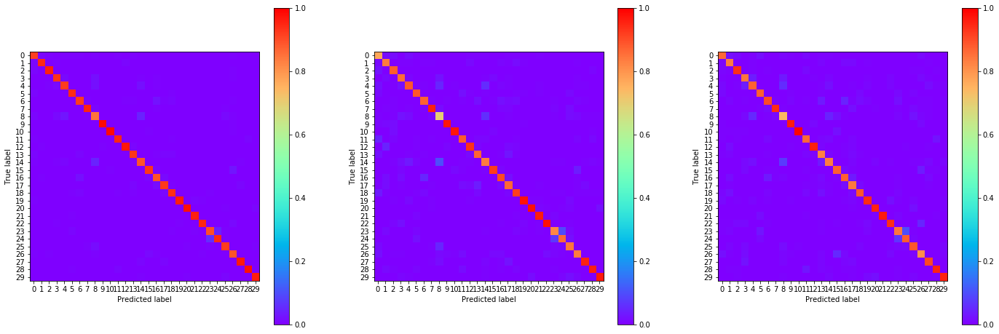

17:16:35.618951
#215 [Train: 0.215] [Test: 0.373] [Valid: 0.373]
#215 [Train: 0.936] [Test: 0.891] [Valid: 0.892]


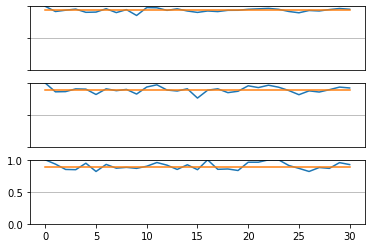

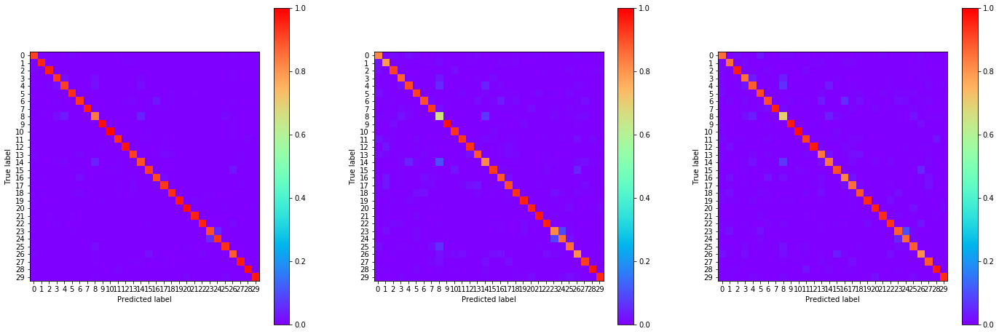

17:17:43.724130
#216 [Train: 0.209] [Test: 0.375] [Valid: 0.381]
#216 [Train: 0.938] [Test: 0.895] [Valid: 0.892]


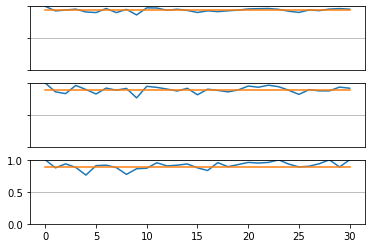

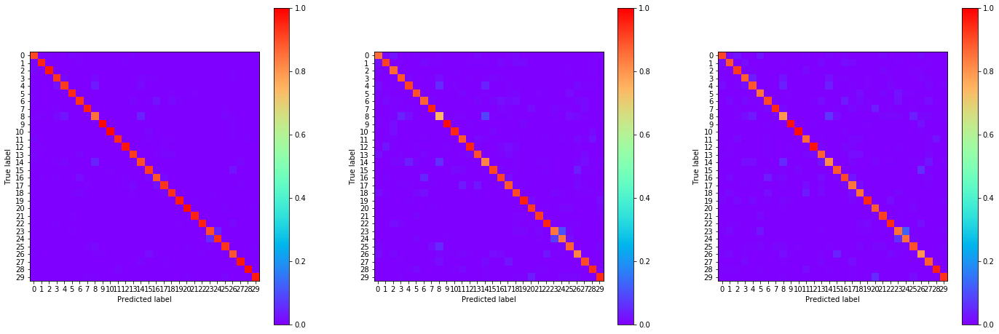

17:18:52.166824
#217 [Train: 0.210] [Test: 0.389] [Valid: 0.391]
#217 [Train: 0.938] [Test: 0.890] [Valid: 0.888]


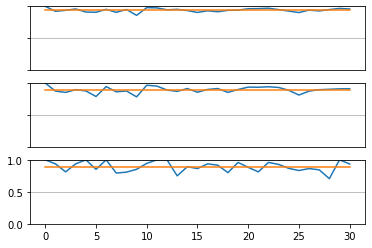

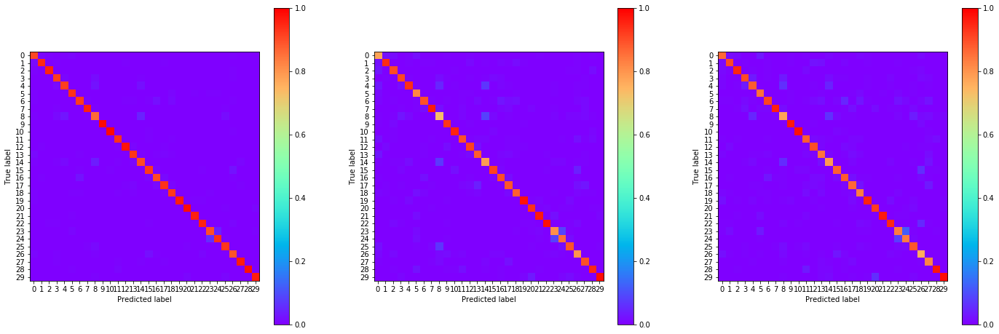

17:20:01.901050
#218 [Train: 0.209] [Test: 0.374] [Valid: 0.378]
#218 [Train: 0.938] [Test: 0.895] [Valid: 0.893]


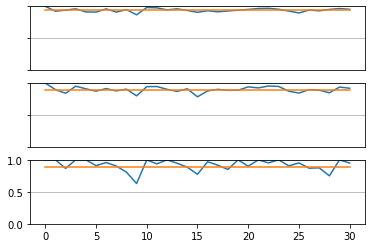

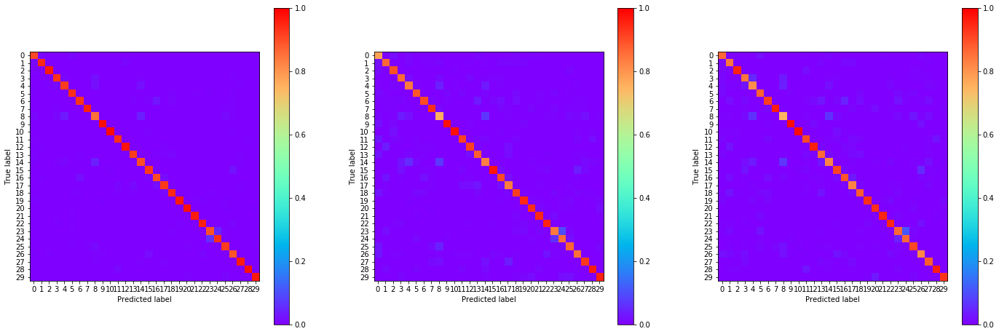

17:21:11.207599
#219 [Train: 0.204] [Test: 0.378] [Valid: 0.375]
#219 [Train: 0.940] [Test: 0.893] [Valid: 0.890]


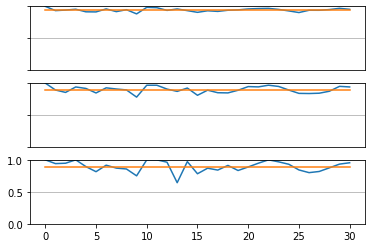

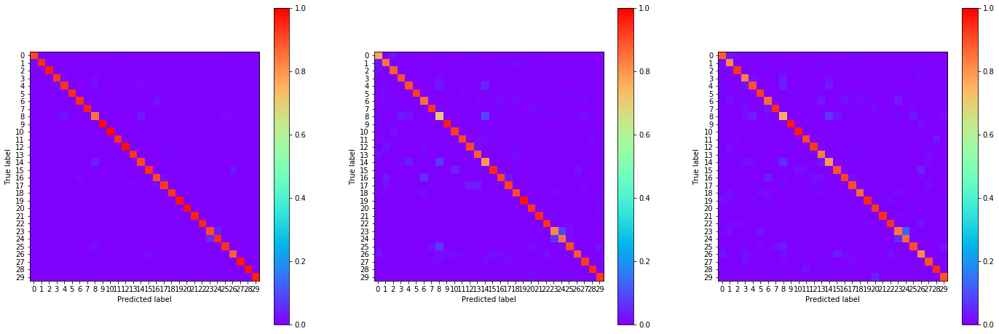

17:22:22.769710
#220 [Train: 0.208] [Test: 0.371] [Valid: 0.375]
#220 [Train: 0.939] [Test: 0.892] [Valid: 0.892]


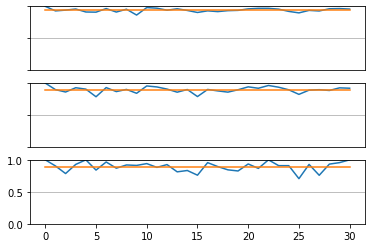

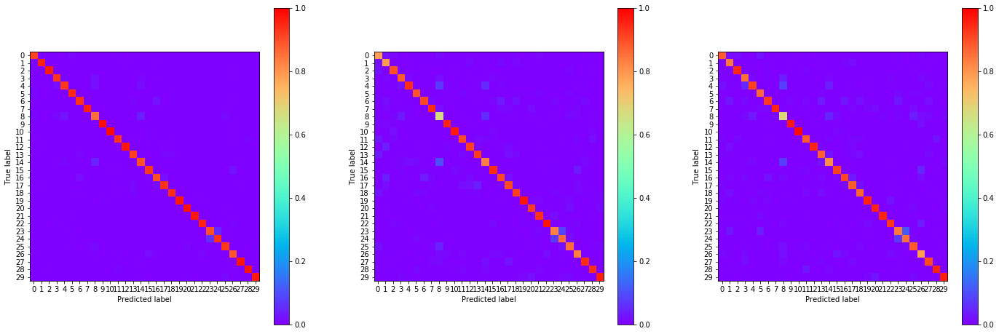

17:23:31.400076
#221 [Train: 0.204] [Test: 0.381] [Valid: 0.382]
#221 [Train: 0.940] [Test: 0.891] [Valid: 0.892]


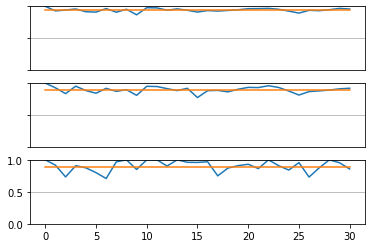

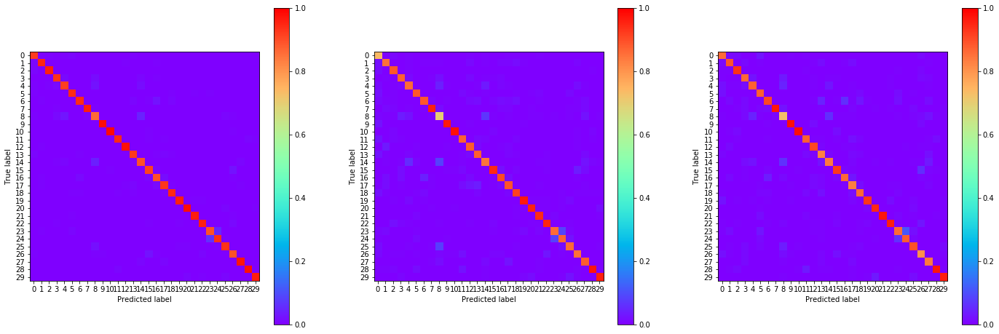

17:24:48.277405
#222 [Train: 0.204] [Test: 0.372] [Valid: 0.380]
#222 [Train: 0.940] [Test: 0.898] [Valid: 0.893]


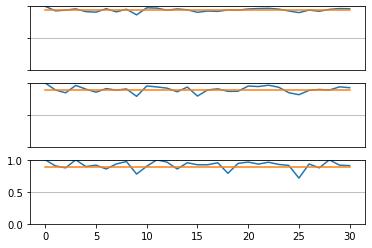

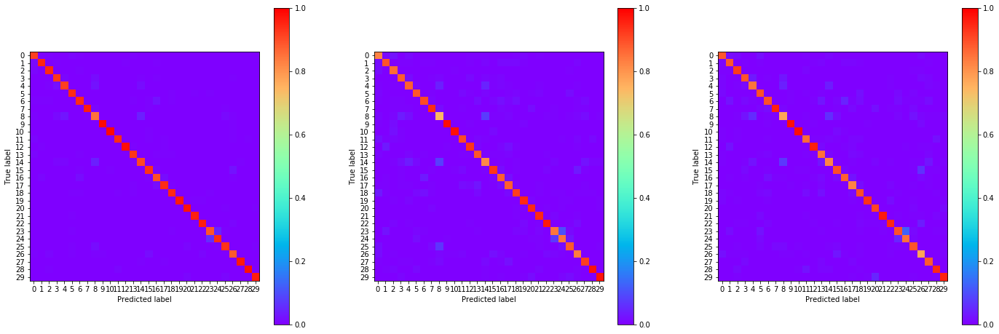

17:25:56.787929
#223 [Train: 0.206] [Test: 0.371] [Valid: 0.384]
#223 [Train: 0.939] [Test: 0.898] [Valid: 0.889]


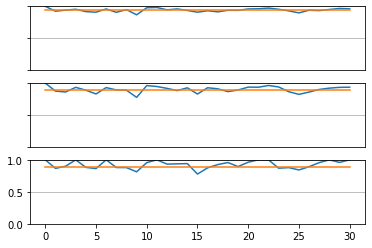

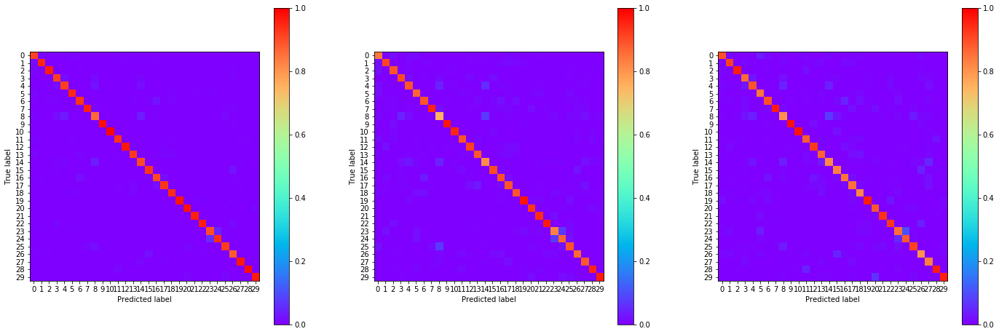

17:27:05.030577
#224 [Train: 0.208] [Test: 0.368] [Valid: 0.368]
#224 [Train: 0.940] [Test: 0.897] [Valid: 0.895]


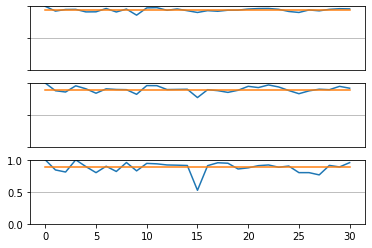

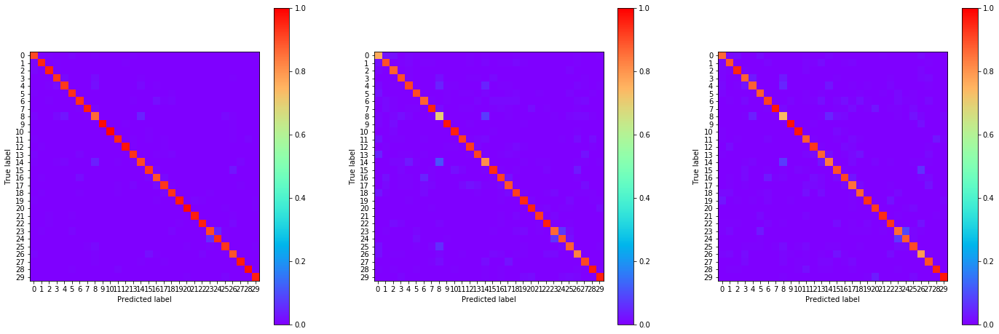

17:28:14.046849
#225 [Train: 0.202] [Test: 0.378] [Valid: 0.370]
#225 [Train: 0.941] [Test: 0.894] [Valid: 0.894]


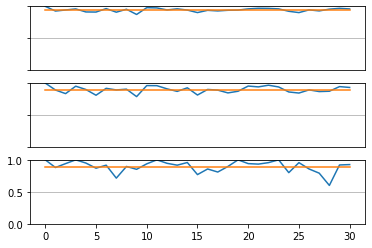

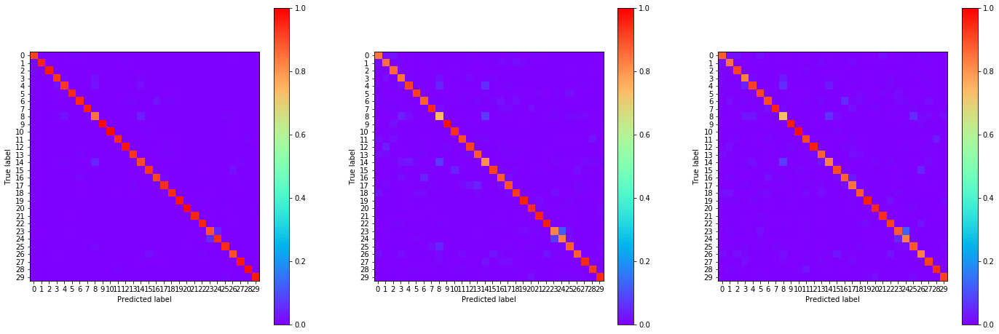

17:29:22.287387
#226 [Train: 0.199] [Test: 0.368] [Valid: 0.382]
#226 [Train: 0.942] [Test: 0.896] [Valid: 0.892]


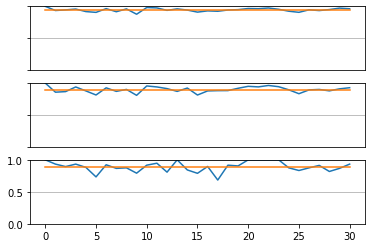

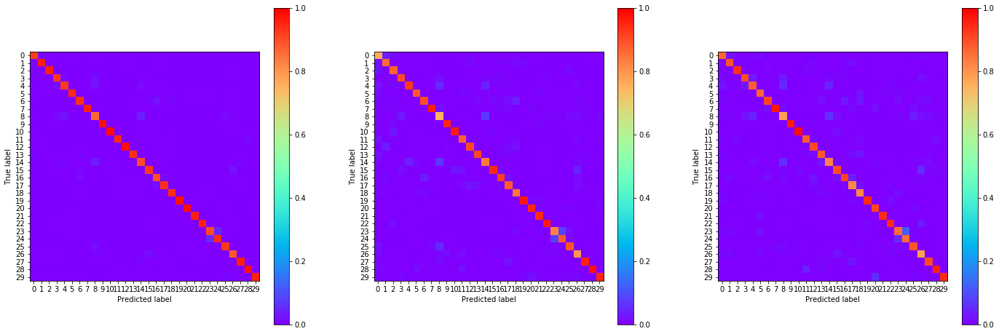

17:30:30.356763
#227 [Train: 0.200] [Test: 0.366] [Valid: 0.373]
#227 [Train: 0.941] [Test: 0.897] [Valid: 0.895]


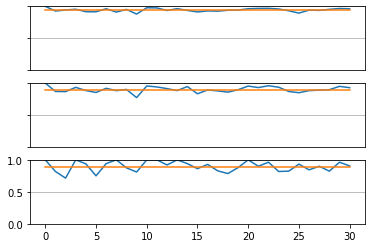

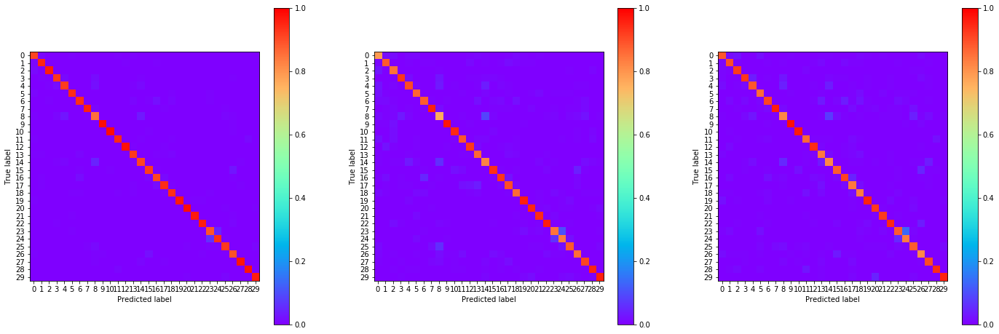

17:31:40.728474
#228 [Train: 0.197] [Test: 0.372] [Valid: 0.379]
#228 [Train: 0.942] [Test: 0.894] [Valid: 0.891]


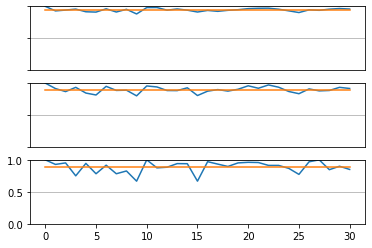

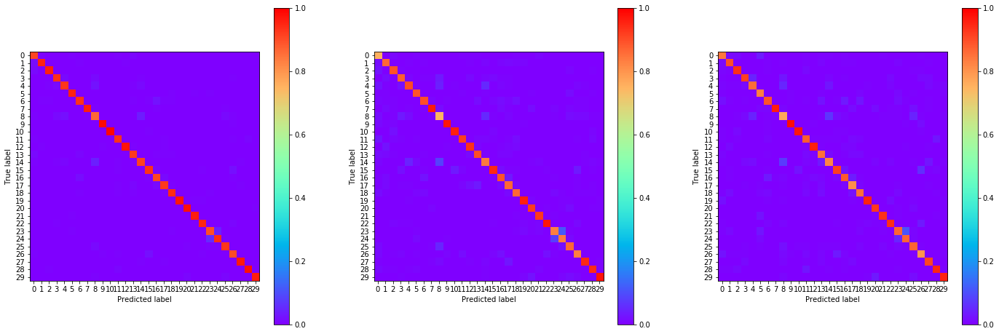

17:32:49.145806
#229 [Train: 0.195] [Test: 0.380] [Valid: 0.384]
#229 [Train: 0.942] [Test: 0.892] [Valid: 0.891]


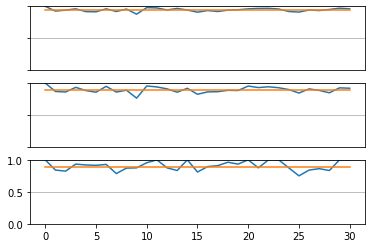

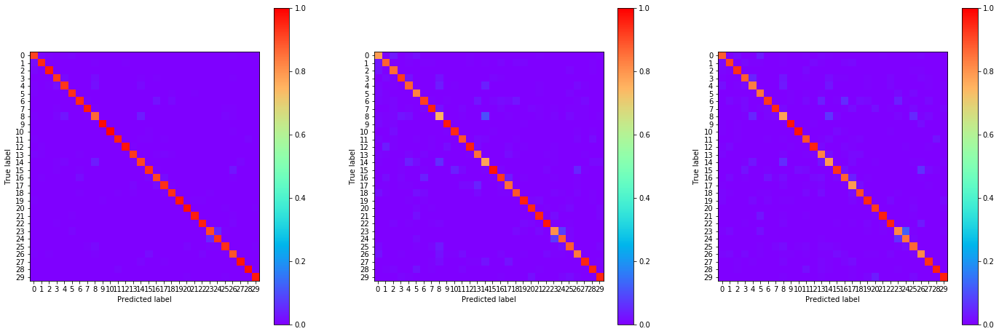

17:33:58.269436
#230 [Train: 0.197] [Test: 0.373] [Valid: 0.376]
#230 [Train: 0.942] [Test: 0.896] [Valid: 0.894]


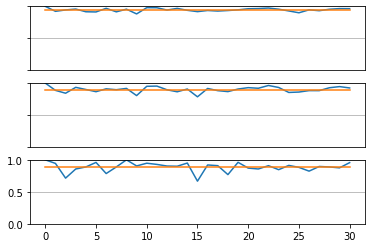

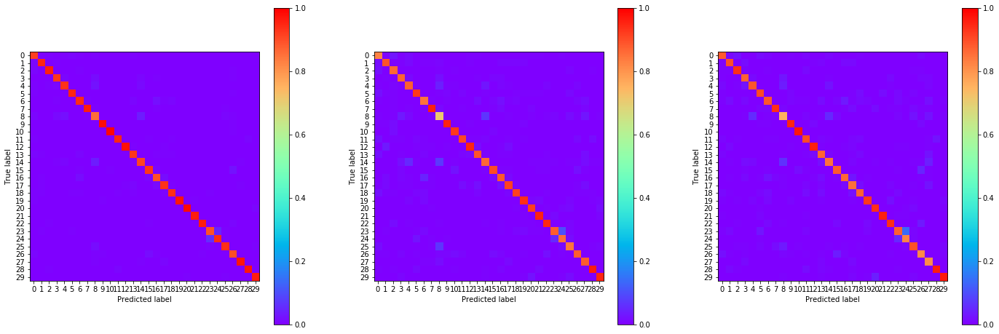

17:35:07.316016
#231 [Train: 0.194] [Test: 0.364] [Valid: 0.367]
#231 [Train: 0.943] [Test: 0.899] [Valid: 0.893]


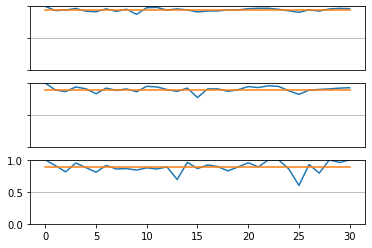

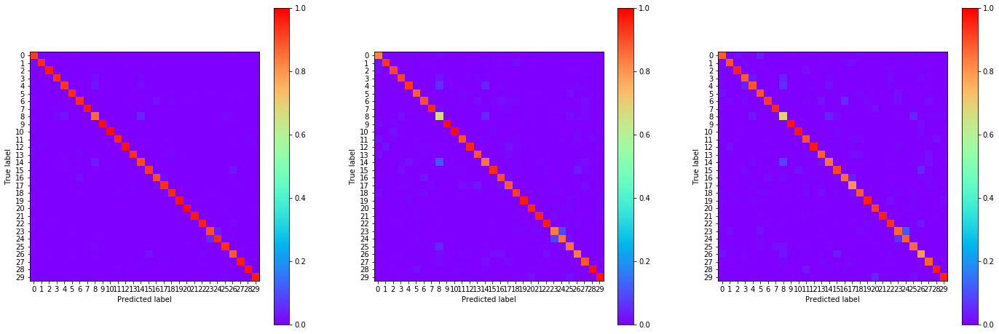

17:36:17.517855
#232 [Train: 0.197] [Test: 0.368] [Valid: 0.376]
#232 [Train: 0.942] [Test: 0.897] [Valid: 0.892]


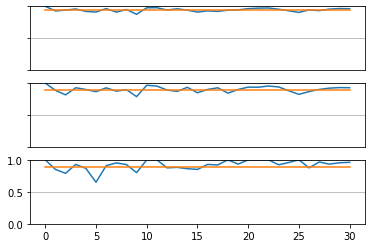

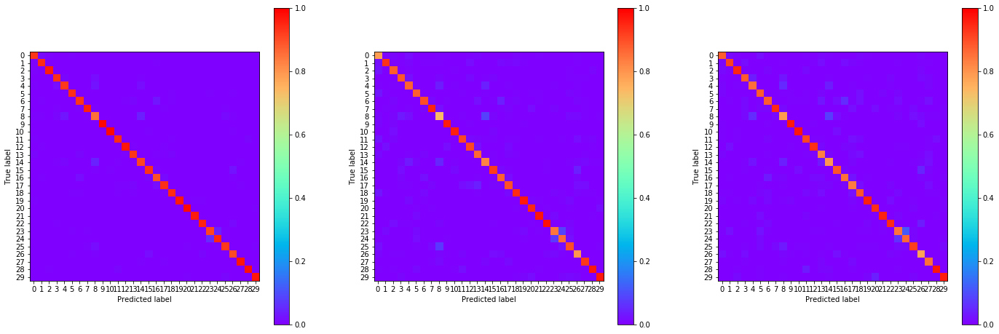

17:37:25.638673
#233 [Train: 0.192] [Test: 0.371] [Valid: 0.375]
#233 [Train: 0.944] [Test: 0.894] [Valid: 0.898]


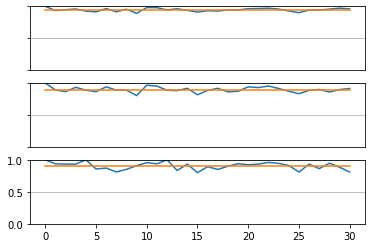

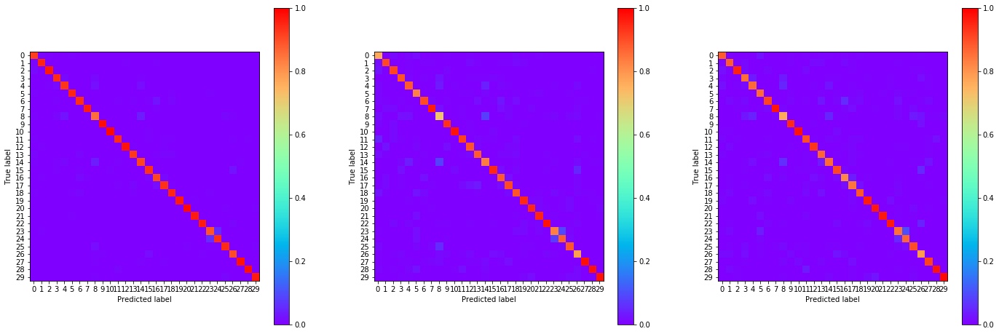

17:38:33.943778
#234 [Train: 0.188] [Test: 0.381] [Valid: 0.371]
#234 [Train: 0.946] [Test: 0.894] [Valid: 0.895]


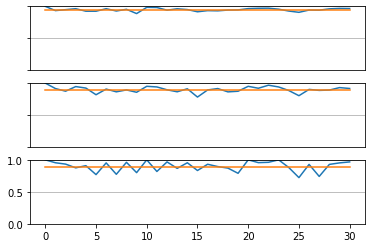

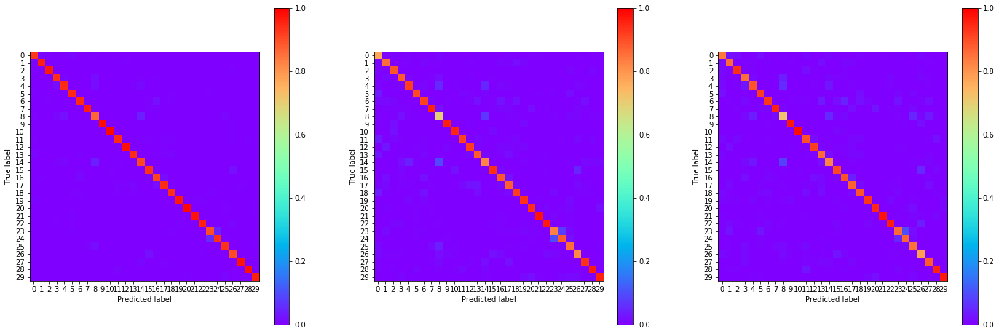

17:39:42.266397
#235 [Train: 0.191] [Test: 0.370] [Valid: 0.377]
#235 [Train: 0.944] [Test: 0.897] [Valid: 0.896]


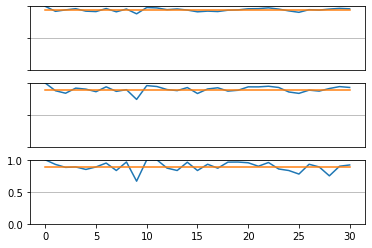

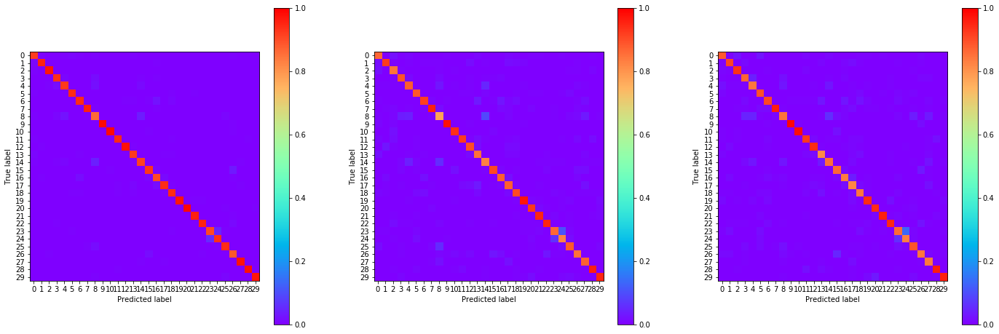

17:40:50.734292
#236 [Train: 0.191] [Test: 0.362] [Valid: 0.364]
#236 [Train: 0.943] [Test: 0.899] [Valid: 0.895]


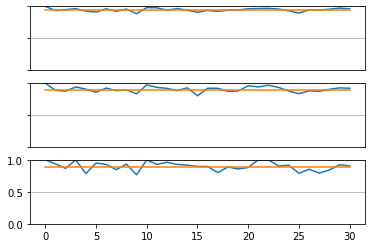

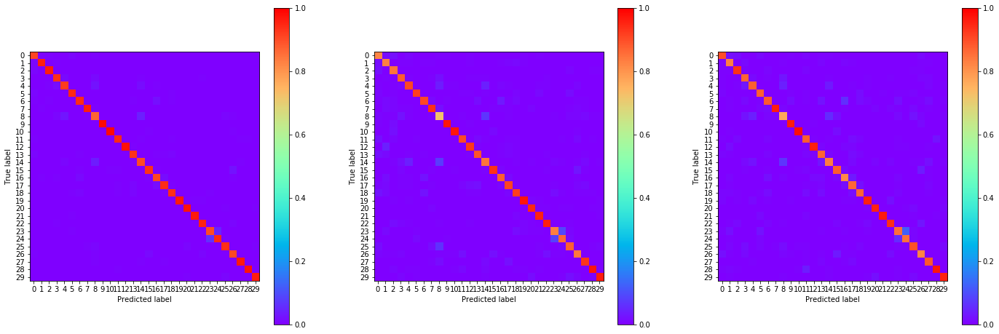

17:42:00.177574
#237 [Train: 0.189] [Test: 0.368] [Valid: 0.381]
#237 [Train: 0.944] [Test: 0.901] [Valid: 0.892]


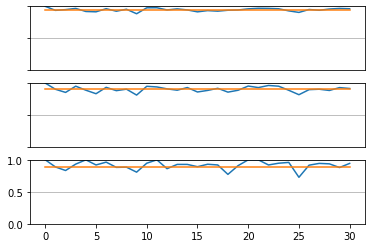

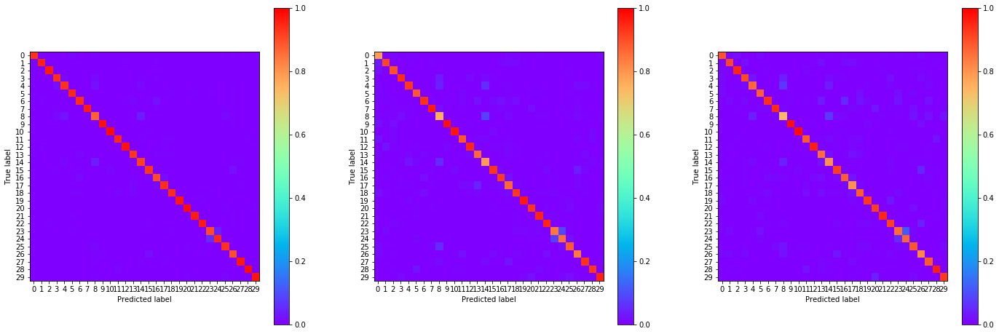

17:43:08.965772
#238 [Train: 0.191] [Test: 0.366] [Valid: 0.365]
#238 [Train: 0.944] [Test: 0.897] [Valid: 0.894]


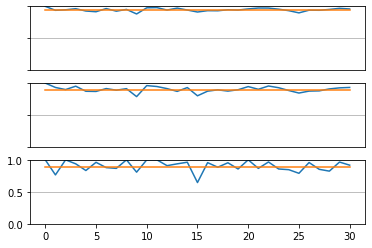

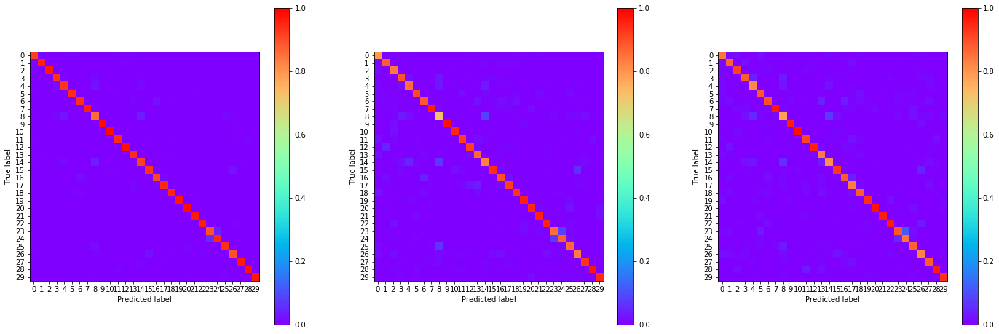

17:44:16.395211
#239 [Train: 0.189] [Test: 0.366] [Valid: 0.373]
#239 [Train: 0.944] [Test: 0.897] [Valid: 0.895]


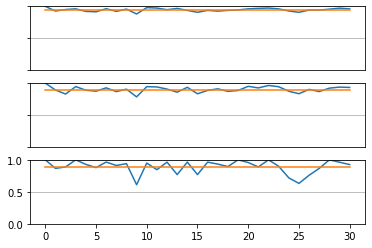

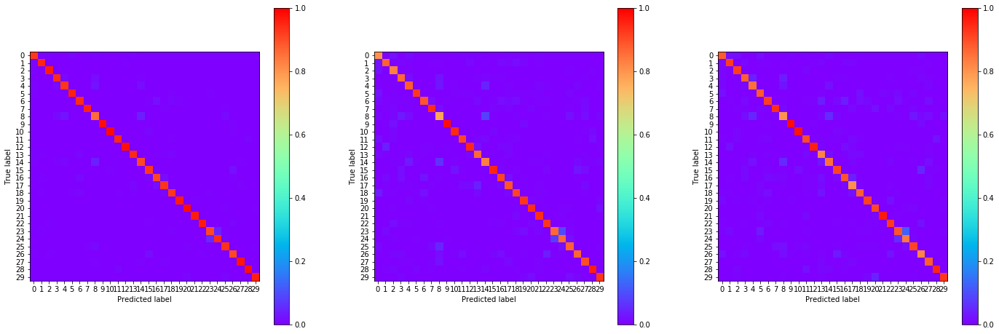

17:45:27.708034
#240 [Train: 0.183] [Test: 0.372] [Valid: 0.374]
#240 [Train: 0.947] [Test: 0.895] [Valid: 0.893]


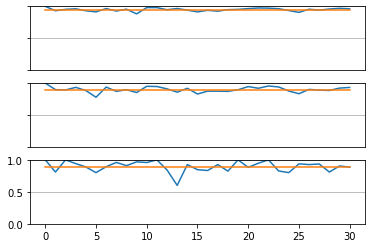

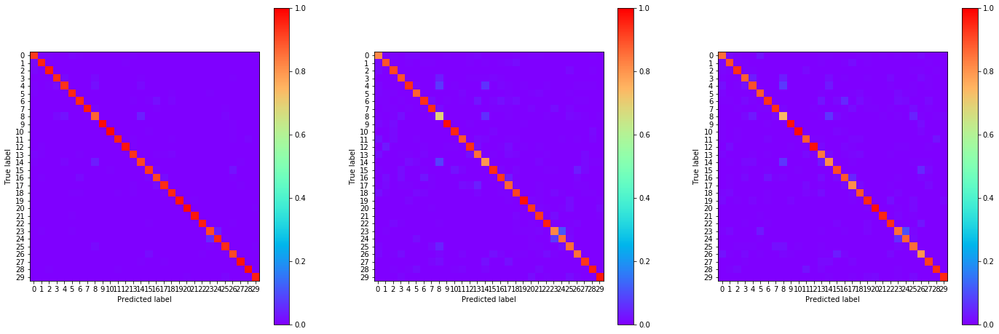

17:46:44.389598
#241 [Train: 0.183] [Test: 0.361] [Valid: 0.366]
#241 [Train: 0.945] [Test: 0.899] [Valid: 0.898]


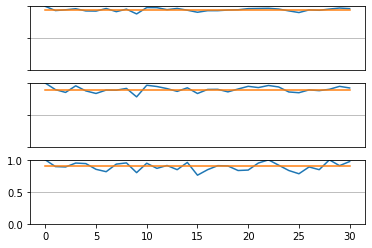

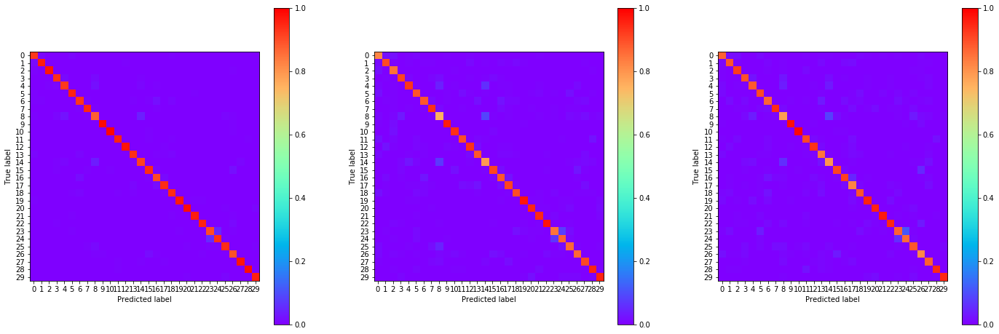

17:48:08.749010
#242 [Train: 0.187] [Test: 0.373] [Valid: 0.368]
#242 [Train: 0.945] [Test: 0.896] [Valid: 0.897]


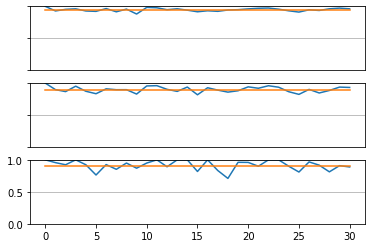

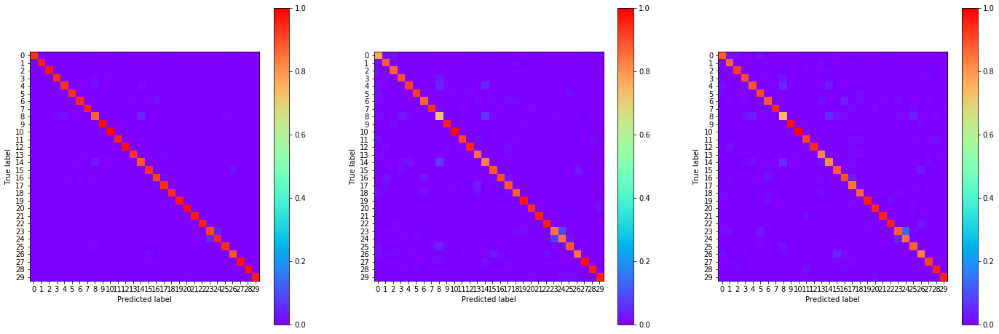

17:49:33.473147
#243 [Train: 0.183] [Test: 0.374] [Valid: 0.371]
#243 [Train: 0.947] [Test: 0.895] [Valid: 0.895]


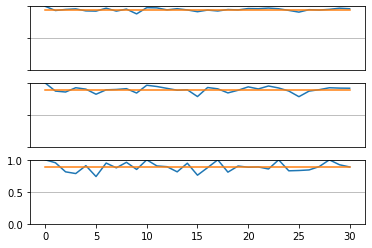

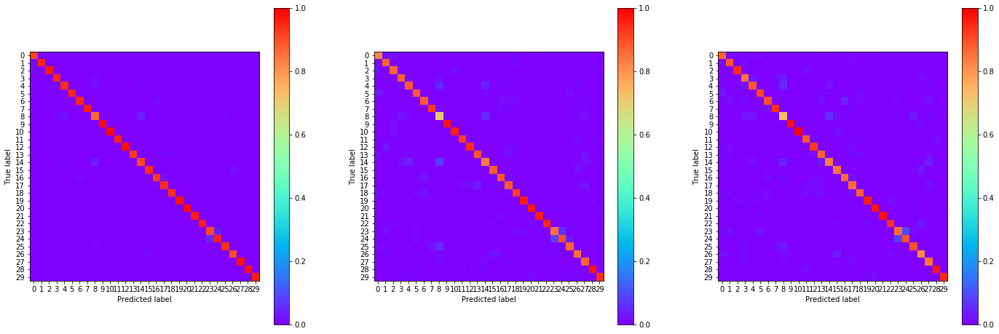

17:50:56.170121
#244 [Train: 0.184] [Test: 0.358] [Valid: 0.377]
#244 [Train: 0.946] [Test: 0.900] [Valid: 0.893]


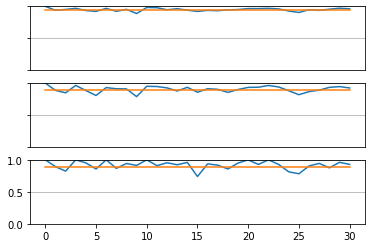

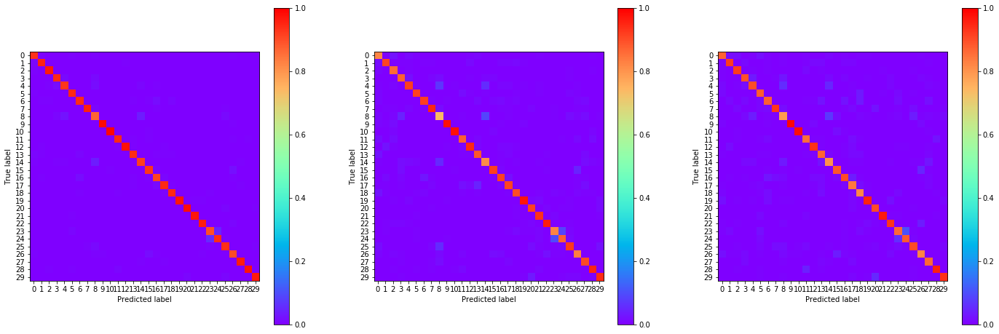

17:52:06.509579
#245 [Train: 0.182] [Test: 0.379] [Valid: 0.387]
#245 [Train: 0.946] [Test: 0.899] [Valid: 0.893]


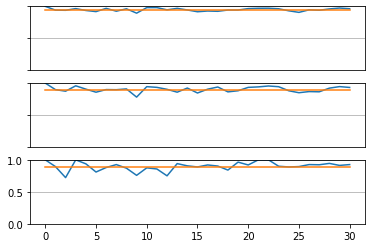

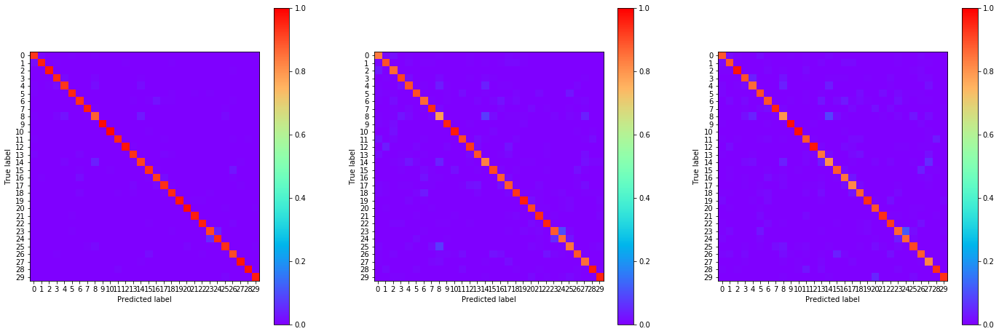

17:53:15.319638
#246 [Train: 0.183] [Test: 0.365] [Valid: 0.370]
#246 [Train: 0.947] [Test: 0.900] [Valid: 0.895]


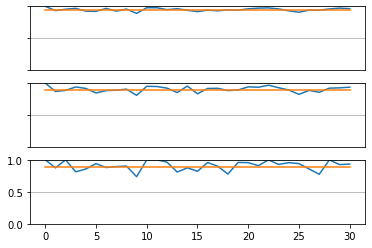

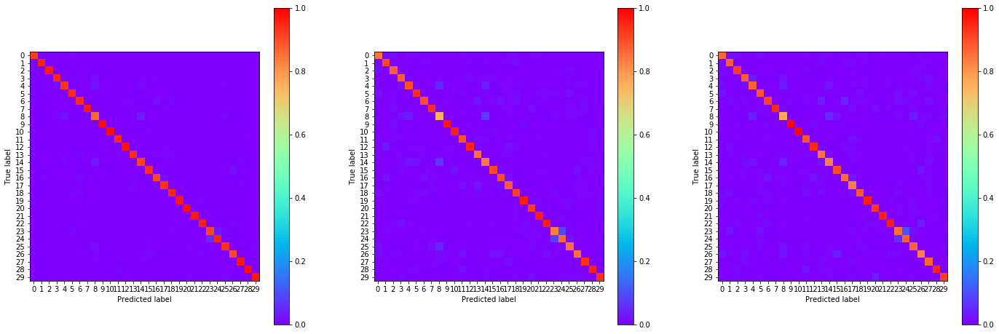

17:54:24.658768
#247 [Train: 0.178] [Test: 0.367] [Valid: 0.363]
#247 [Train: 0.948] [Test: 0.899] [Valid: 0.898]


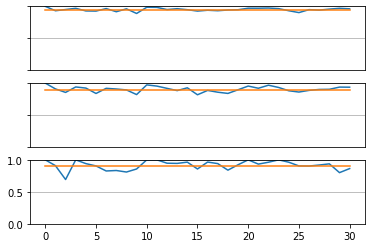

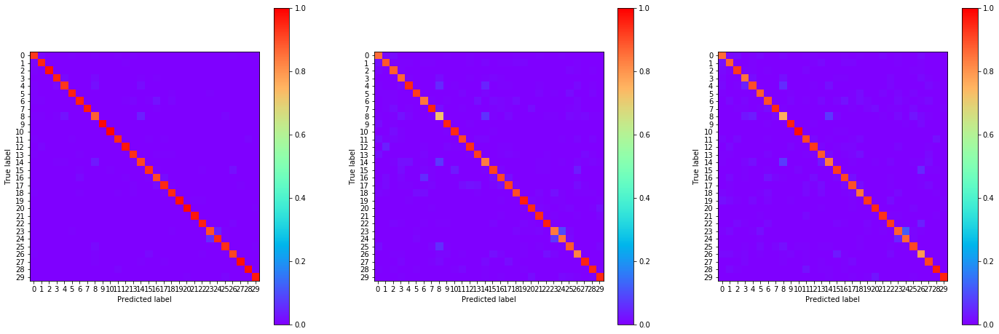

17:55:33.744334
#248 [Train: 0.177] [Test: 0.362] [Valid: 0.368]
#248 [Train: 0.948] [Test: 0.899] [Valid: 0.898]


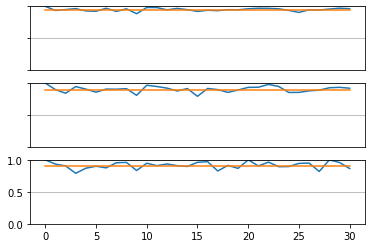

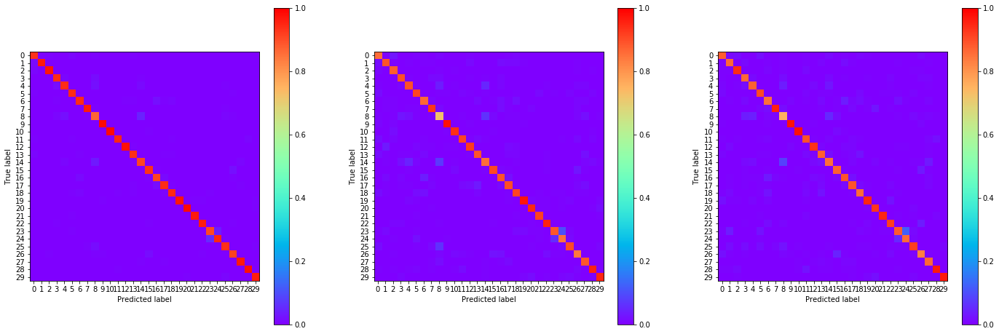

17:56:44.422617
#249 [Train: 0.180] [Test: 0.362] [Valid: 0.379]
#249 [Train: 0.947] [Test: 0.898] [Valid: 0.895]


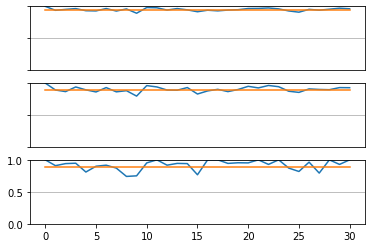

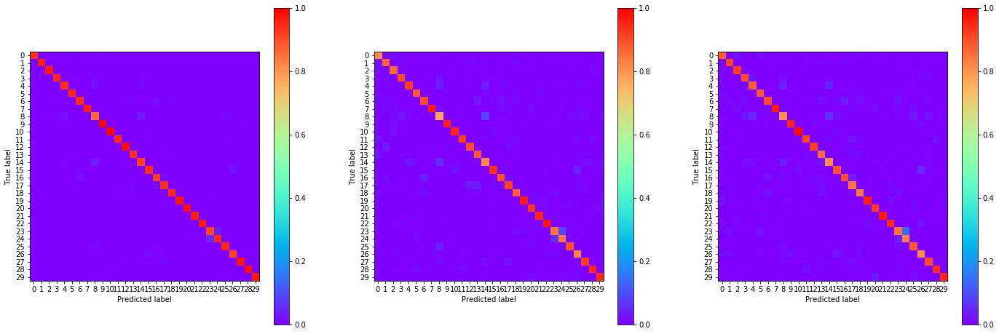

17:57:54.844078
#250 [Train: 0.177] [Test: 0.358] [Valid: 0.363]
#250 [Train: 0.949] [Test: 0.901] [Valid: 0.898]


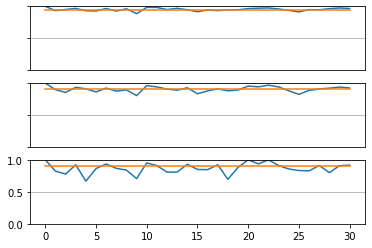

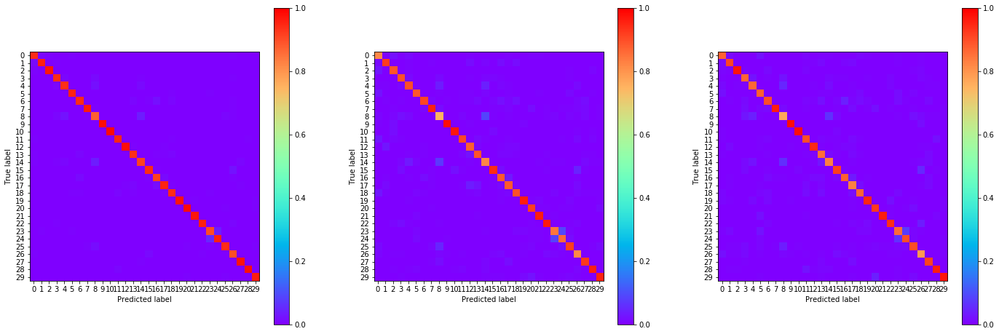

17:59:04.671943
#251 [Train: 0.176] [Test: 0.369] [Valid: 0.369]
#251 [Train: 0.948] [Test: 0.897] [Valid: 0.899]


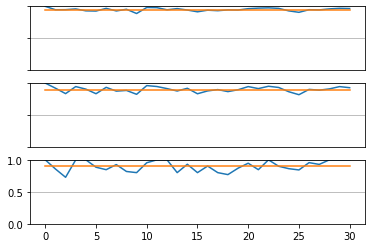

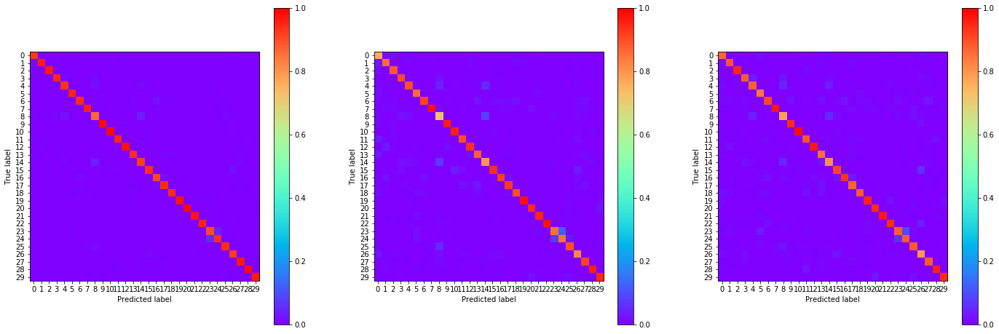

18:00:11.561548
#252 [Train: 0.179] [Test: 0.371] [Valid: 0.367]
#252 [Train: 0.947] [Test: 0.896] [Valid: 0.897]


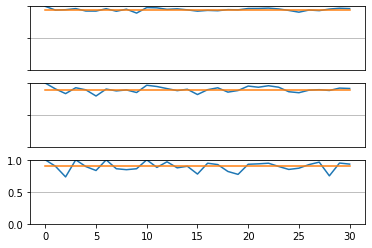

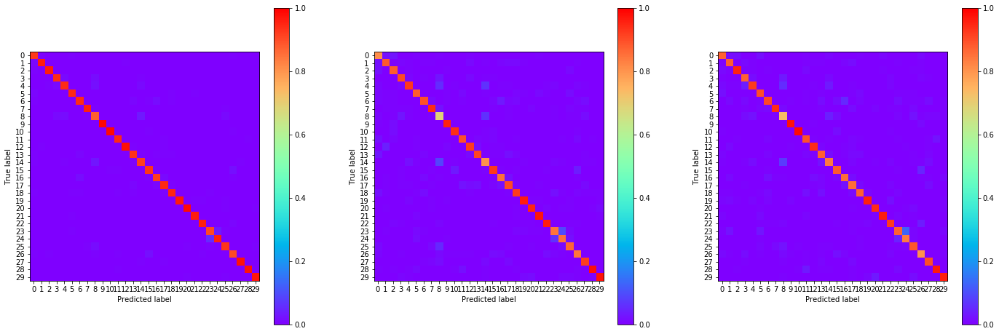

18:01:21.763069
#253 [Train: 0.173] [Test: 0.356] [Valid: 0.363]
#253 [Train: 0.949] [Test: 0.900] [Valid: 0.900]


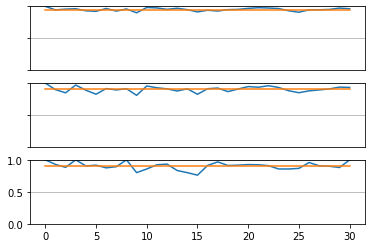

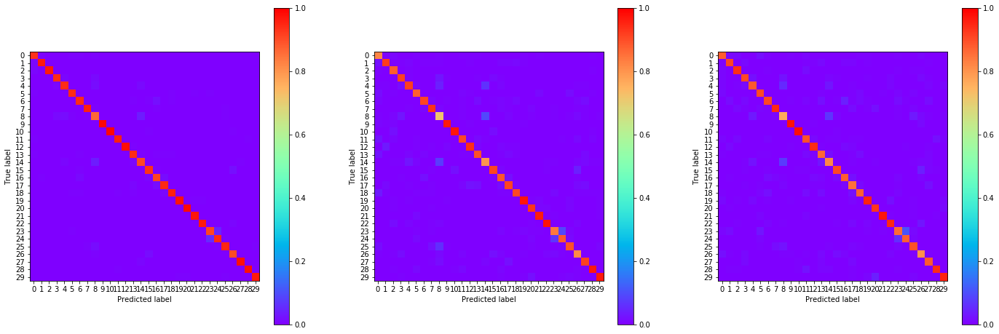

18:02:30.304477
#254 [Train: 0.173] [Test: 0.372] [Valid: 0.374]
#254 [Train: 0.949] [Test: 0.894] [Valid: 0.894]


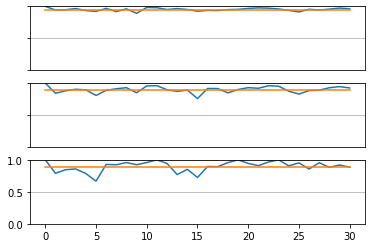

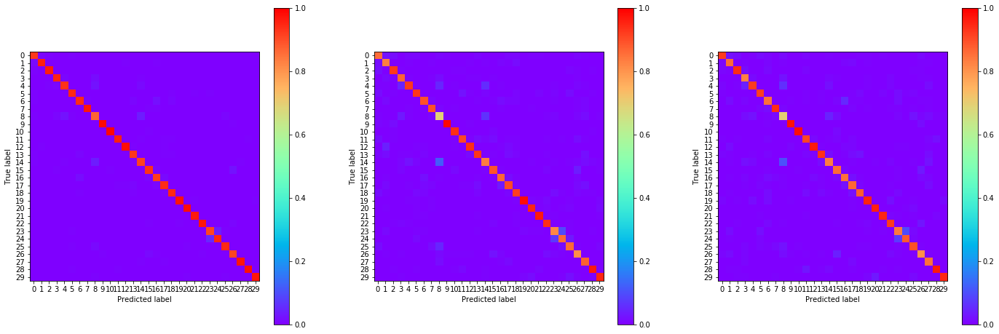

18:03:40.090568
#255 [Train: 0.177] [Test: 0.353] [Valid: 0.370]
#255 [Train: 0.948] [Test: 0.901] [Valid: 0.896]


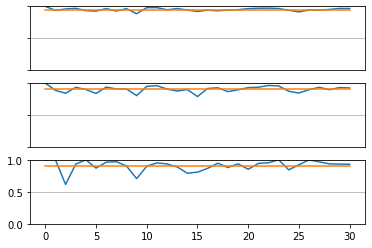

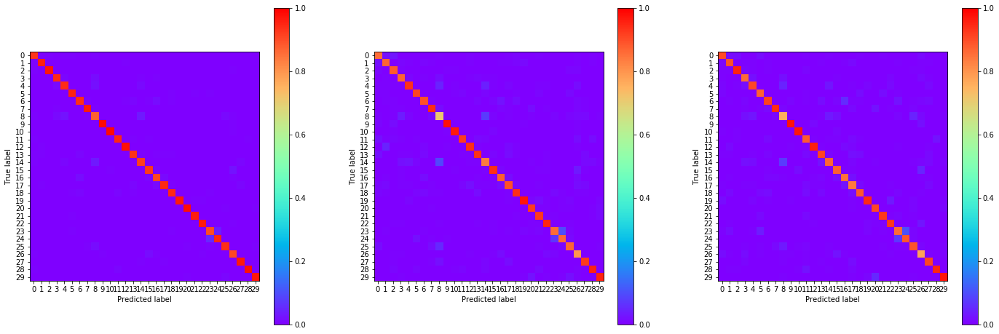

18:04:48.298814
#256 [Train: 0.171] [Test: 0.378] [Valid: 0.370]
#256 [Train: 0.950] [Test: 0.896] [Valid: 0.895]


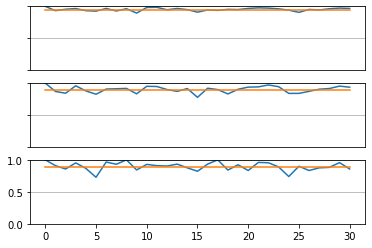

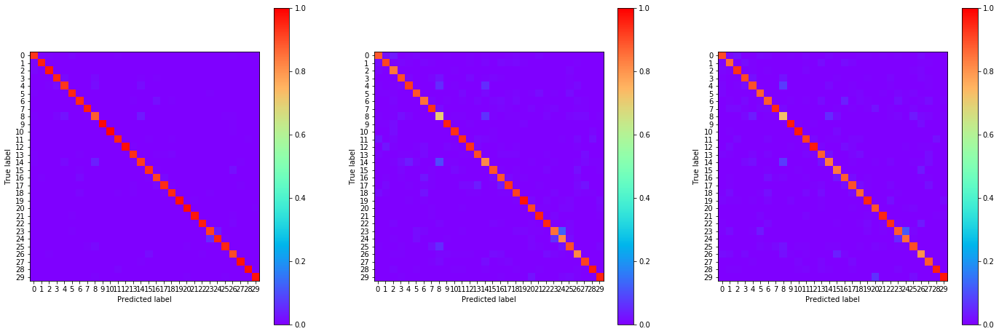

18:05:57.297865
#257 [Train: 0.172] [Test: 0.356] [Valid: 0.371]
#257 [Train: 0.949] [Test: 0.901] [Valid: 0.896]


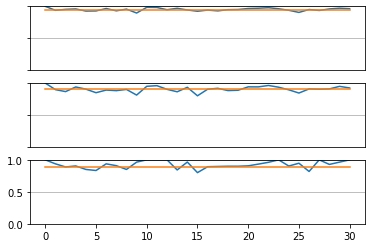

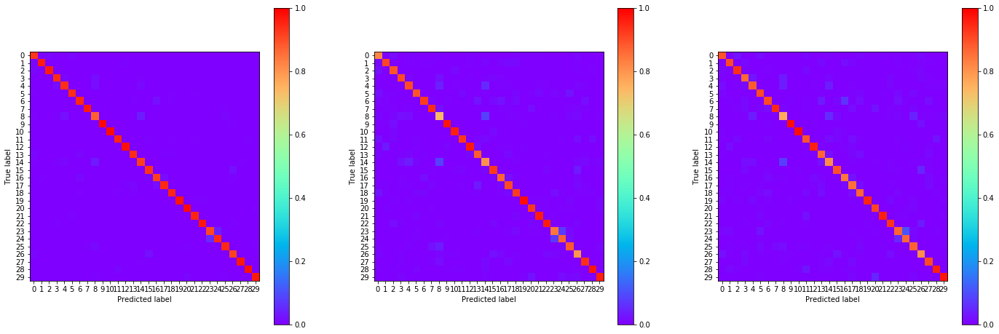

18:07:06.778527
#258 [Train: 0.169] [Test: 0.358] [Valid: 0.359]
#258 [Train: 0.950] [Test: 0.902] [Valid: 0.899]


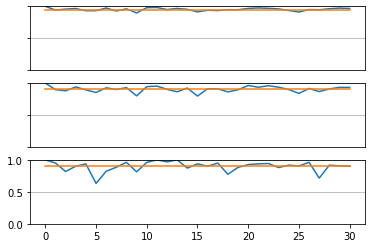

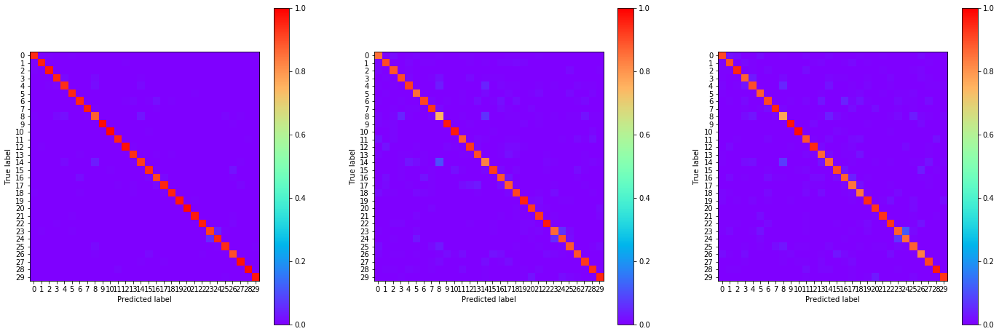

18:08:16.494499
#259 [Train: 0.167] [Test: 0.368] [Valid: 0.359]
#259 [Train: 0.951] [Test: 0.900] [Valid: 0.901]


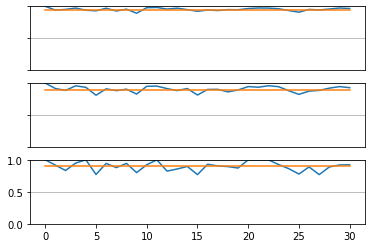

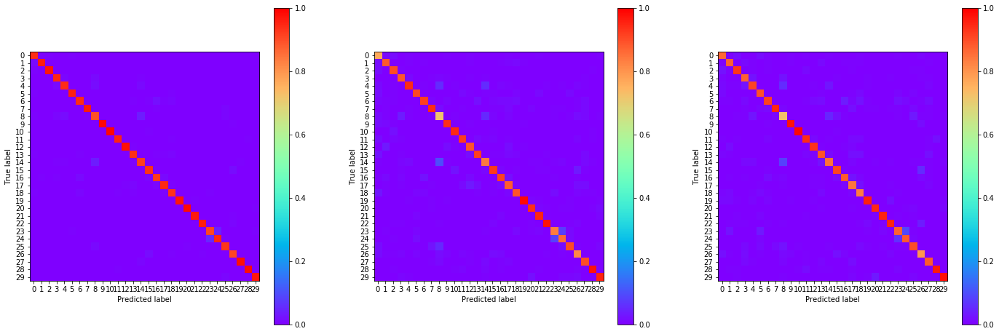

18:09:25.201920
#260 [Train: 0.169] [Test: 0.368] [Valid: 0.375]
#260 [Train: 0.950] [Test: 0.897] [Valid: 0.897]


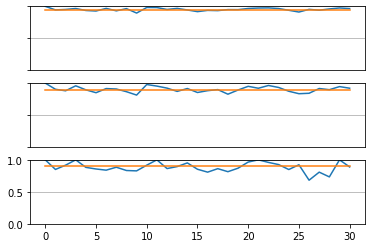

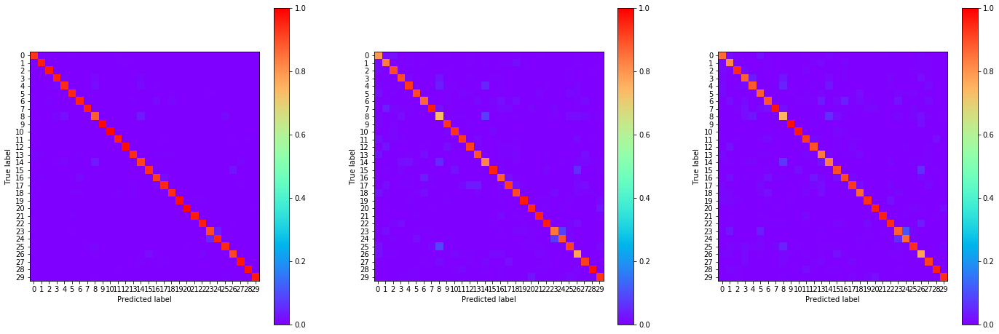

18:10:33.866288
#261 [Train: 0.170] [Test: 0.354] [Valid: 0.371]
#261 [Train: 0.950] [Test: 0.902] [Valid: 0.899]


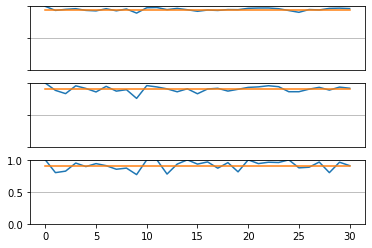

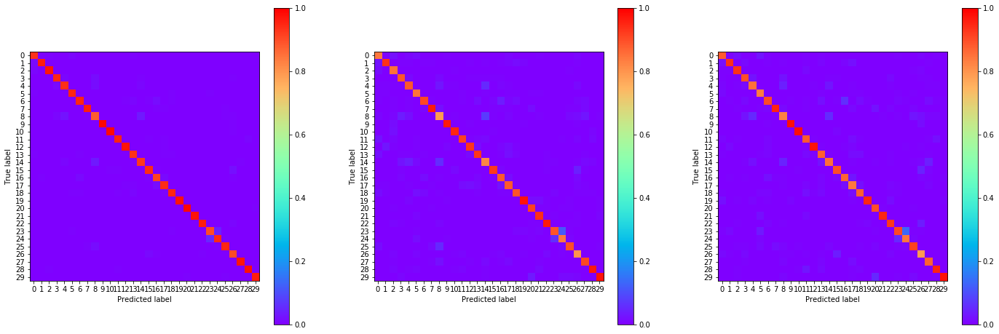

18:11:43.847212
#262 [Train: 0.169] [Test: 0.356] [Valid: 0.361]
#262 [Train: 0.950] [Test: 0.901] [Valid: 0.898]


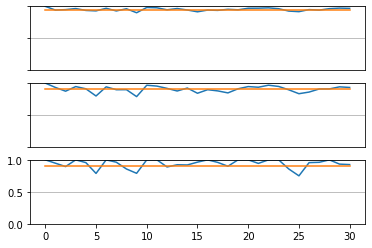

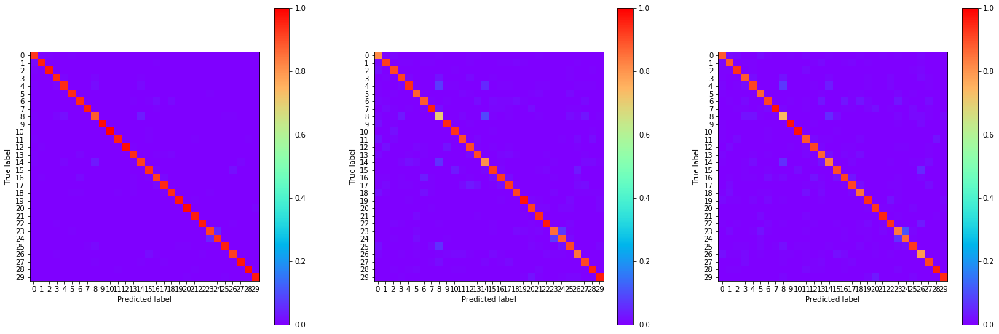

18:12:52.068359
#263 [Train: 0.167] [Test: 0.367] [Valid: 0.370]
#263 [Train: 0.951] [Test: 0.900] [Valid: 0.900]


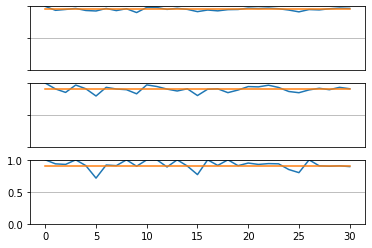

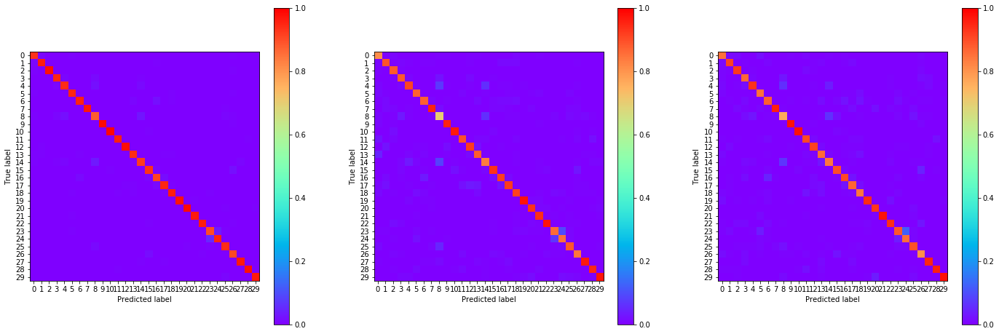

18:14:00.370396
#264 [Train: 0.165] [Test: 0.361] [Valid: 0.369]
#264 [Train: 0.951] [Test: 0.902] [Valid: 0.899]


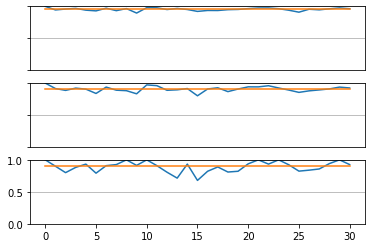

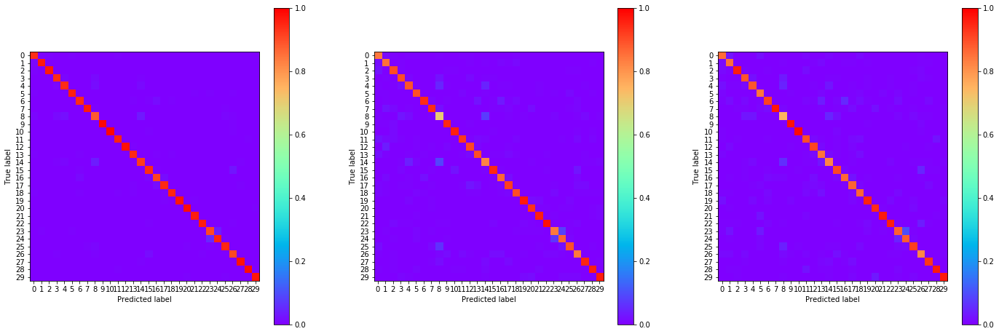

18:15:08.799008
#265 [Train: 0.164] [Test: 0.358] [Valid: 0.379]
#265 [Train: 0.953] [Test: 0.902] [Valid: 0.898]


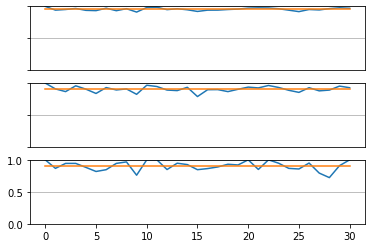

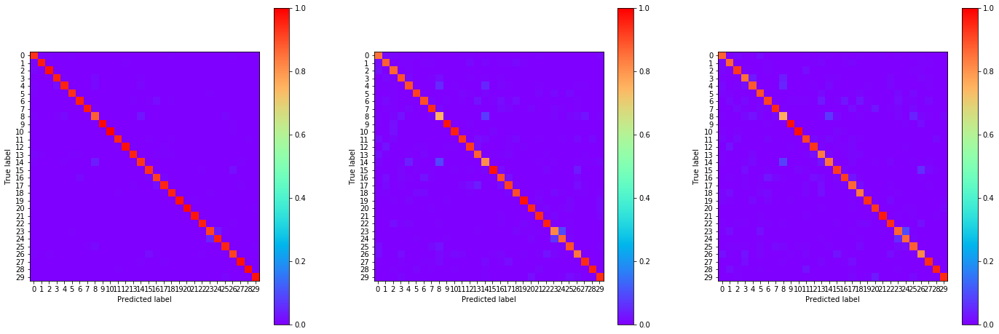

18:16:18.641116
#266 [Train: 0.164] [Test: 0.364] [Valid: 0.371]
#266 [Train: 0.952] [Test: 0.900] [Valid: 0.895]


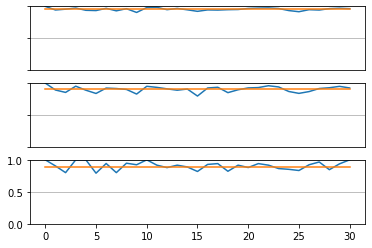

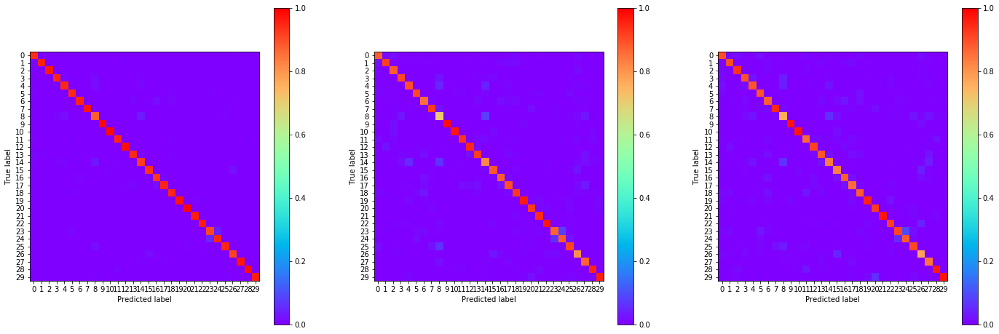

18:17:27.388614
#267 [Train: 0.161] [Test: 0.365] [Valid: 0.366]
#267 [Train: 0.952] [Test: 0.901] [Valid: 0.898]


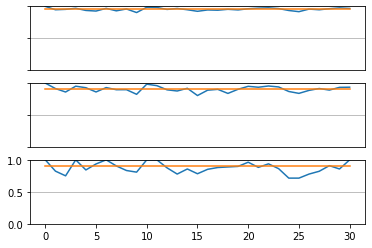

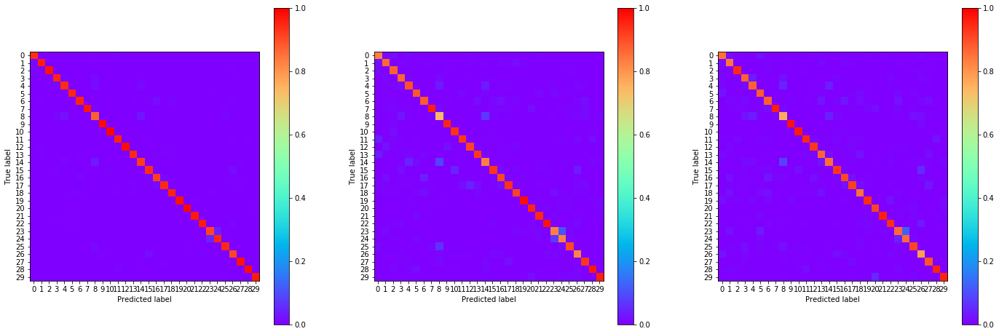

18:18:37.211659
#268 [Train: 0.164] [Test: 0.361] [Valid: 0.379]
#268 [Train: 0.952] [Test: 0.903] [Valid: 0.897]


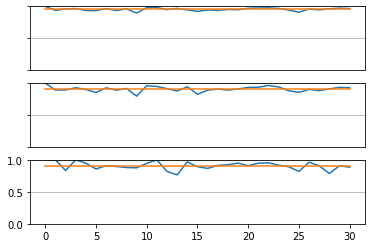

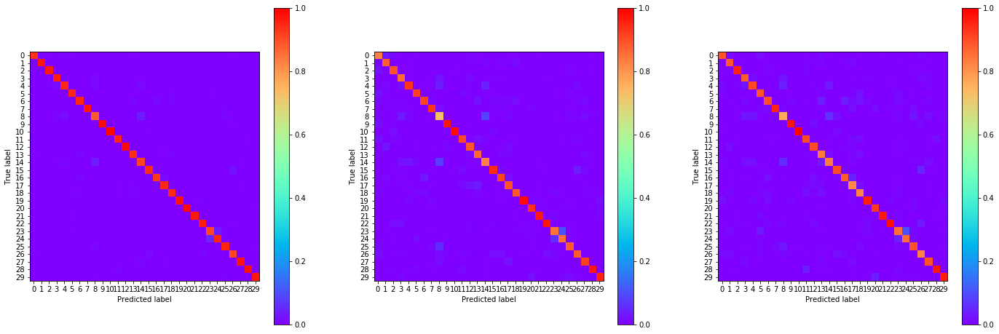

18:19:45.260544
#269 [Train: 0.159] [Test: 0.362] [Valid: 0.367]
#269 [Train: 0.954] [Test: 0.901] [Valid: 0.900]


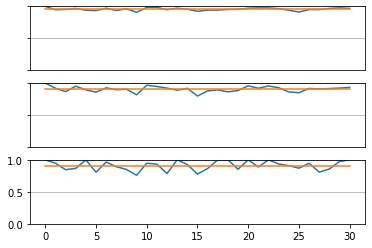

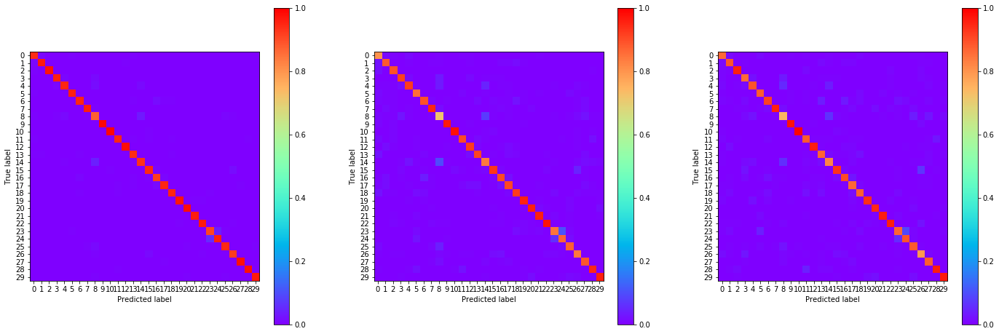

18:20:55.341767
#270 [Train: 0.159] [Test: 0.348] [Valid: 0.363]
#270 [Train: 0.953] [Test: 0.904] [Valid: 0.901]


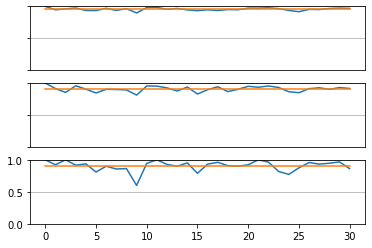

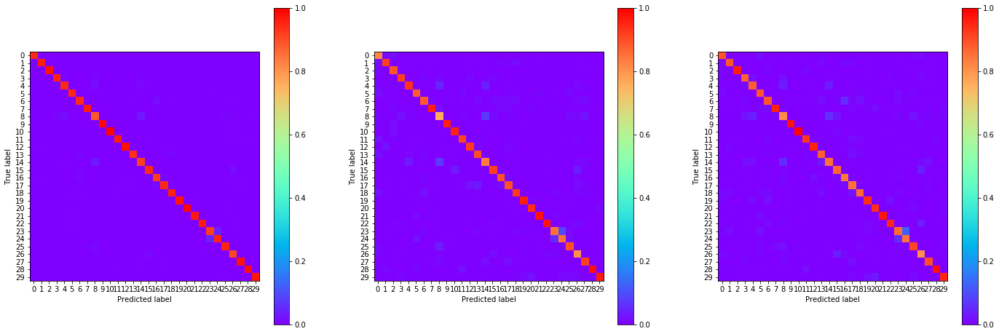

18:21:54.329964
#271 [Train: 0.158] [Test: 0.360] [Valid: 0.375]
#271 [Train: 0.954] [Test: 0.901] [Valid: 0.899]


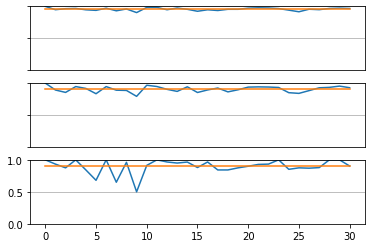

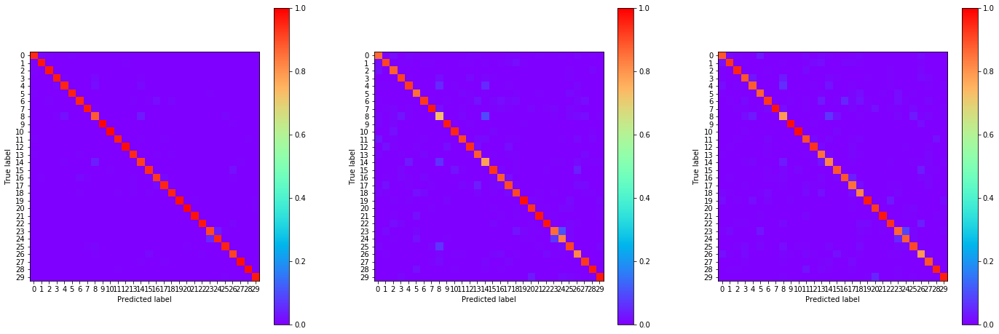

18:22:50.644191
#272 [Train: 0.161] [Test: 0.360] [Valid: 0.369]
#272 [Train: 0.952] [Test: 0.901] [Valid: 0.898]


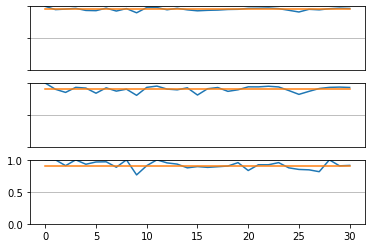

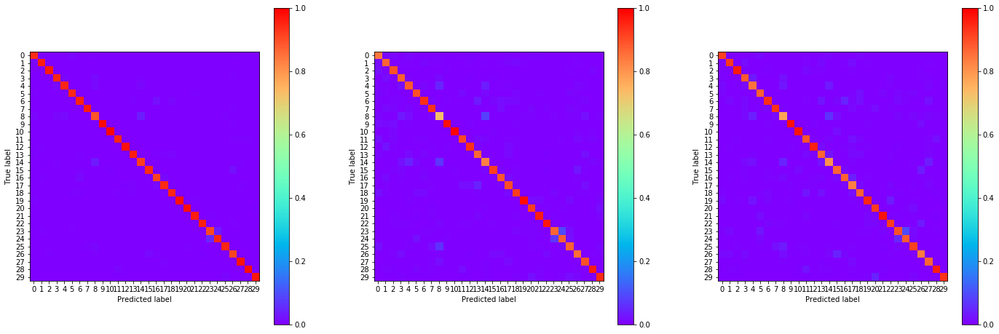

In [ ]:
MAX_EPOCH = 300

writer = SummaryWriter(log_dir=run_name)

for epoch in range(MAX_EPOCH):
    training_loss_list = list()
    batch_generator = dataset_loader_training.batch_generator()
    model.train()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_train = np.zeros([31, 2])
    result_matrix_train[0, :] = [1, 1]
    y_pred_train = list()
    y_true_train = list()

    for (batch, label) in batch_generator:
        optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
        loss.backward()
        training_loss_list.append(loss.item())
        optimizer.step()
        
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_train += list(label)
        y_pred_train += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_train[label, 0] += 1
            if result:
                result_matrix_train[label, 1] += 1
        
    acc_train = correct_num / total_num

    testing_loss_list = list()

    batch_generator = dataset_loader_testing.batch_generator()

    model.eval()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_test = np.zeros([31, 2])
    result_matrix_test[0, :] = [1, 1]
    y_pred_test = list()
    y_true_test = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label).to(device))
#         loss.backward()
        testing_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_test += list(label)
        y_pred_test += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_test[label, 0] += 1
            if result:
                result_matrix_test[label, 1] += 1
        
    acc_test = correct_num / total_num

    validation_loss_list = list()

    batch_generator = dataset_loader_validation.batch_generator()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_eval = np.zeros([31, 2])
    result_matrix_eval[0, :] = [1, 1]
    y_pred_eval = list()
    y_true_eval = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
#         loss.backward()
        validation_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        y_true_eval += list(label)
        y_pred_eval += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_eval[label, 0] += 1
            if result:
                result_matrix_eval[label, 1] += 1
        
    acc_valid = correct_num / total_num
    
    training_loss_mean = np.mean(training_loss_list)
    testing_loss_mean = np.mean(testing_loss_list)
    validation_loss_mean = np.mean(validation_loss_list)
    
    print(datetime.datetime.now().time())
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, training_loss_mean, testing_loss_mean, validation_loss_mean))
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, acc_train, acc_test, acc_valid))
    
    fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True)
    axes[0].plot(result_matrix_train[:, 1] / result_matrix_train[:, 0])
    axes[0].plot(np.ones(len(result_matrix_train)) * acc_train)
    axes[0].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[0].set_ylim([0, 1])
    axes[0].yaxis.grid(True)
                 
    axes[1].plot(result_matrix_test[:, 1] / result_matrix_test[:, 0])
    axes[1].plot(np.ones(len(result_matrix_test)) * acc_test)
    axes[1].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[1].set_ylim([0, 1])
    axes[1].yaxis.grid(True)
                 
    axes[2].plot(result_matrix_eval[:, 1] / result_matrix_eval[:, 0])
    axes[2].plot(np.ones(len(result_matrix_eval)) * acc_valid)
    axes[2].set_ylim([0, 1])
    axes[2].yaxis.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
    cm = confusion_matrix(y_true_train, y_pred_train, normalize='pred')
#     axes[0].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[0], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[0].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_test, y_pred_test, normalize='pred')
#     axes[1].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[1], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[1].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_eval, y_pred_eval, normalize='pred')
#     im = axes[2].imshow(cm)
#     plt.colorbar(im)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[2], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[2].get_images():
        im.set_clim(0, 1)
    
    plt.show()
    
    writer.add_scalar('Loss/Train', training_loss_mean, epoch)
    writer.add_scalar('Loss/Test', testing_loss_mean, epoch)
    writer.add_scalar('Loss/Valid', validation_loss_mean, epoch)
    writer.add_scalar('Acc/Train', acc_train, epoch)
    writer.add_scalar('Acc/Test', acc_test, epoch)
    writer.add_scalar('Acc/Valid', acc_valid, epoch)
    

In [ ]:
# output = model(torch.cuda.FloatTensor(batch))

In [ ]:
# output.shape

In [ ]:
# torch.tensor(batch).unsqueeze_(1).shape

In [ ]:
# input_tensor = torch.tensor(batch).to(device).float()
# input_tensor = input_tensor.transpose(1, 2)
# model(input_tensor).shape

In [ ]:
## for batch, label_list in batch_generator:
#     print(batch.shape[0])
#     plt.figure(figsize=(5, 1))
#     plt.plot(label_list)
#     plt.show()
    
#     plt.figure(figsize=(6, 18))
# #     plt.imshow(batch[0], aspect='auto')
#     plt.imshow(batch[0])
#     plt.show()
    
#     break